# NETWORK ANOMALY DETECTION

**BHAVESHKUMAR THAKER**

## BUSINESS PROBLEM

To build network intrusion detection system to detect anomalies and attacks in the Network. There are two problems.

1. Binomial Classification: Activity is normal or attack
2. Multinomial classification: Activity is normal or DOS or PROBE or R2L or U2R

### Basic features of individual TCP connections

|feature name|description|type|
|:---|:---|:---|
|duration|length (number of seconds) of the connection|continuous|
|protocol_type|type of the protocol, e.g. tcp, udp, etc.|discrete|
|service|network service on the destination, e.g., http, telnet, etc.|discrete|
|src_bytes|number of data bytes from source to destination|continuous|
|dst_bytes|number of data bytes from destination to source|continuous|
|flag|normal or error status of the connection|discrete|
|land|1 if connection is from/to the same host/port; 0 otherwise|discrete|
|wrong_fragment|number of "wrong" fragments|continuous|
|urgent|number of urgent packets|continuous|

### Content features within a connection suggested by domain knowledge

|feature name|description|type|
|:---|:---|:---|
|hot|number of "hot" indicators|continuous|
|num_failed_logins|number of failed login attempts|continuous|
|logged_in|1 if successfully logged in; 0 otherwise|discrete|
|num_compromised|number of "compromised" conditions|continuous|
|root_shell|1 if root shell is obtained; 0 otherwise|discrete|
|su_attempted|1 if "su root" command attempted; 0 otherwise|discrete|
|num_root|number of "root" accesses|continuous|
|num_file_creations|number of file creation operations|continuous|
|num_shells|number of shell prompts|continuous|
|num_access_files|number of operations on access control files|continuous|
|num_outbound_cmds|number of outbound commands in an ftp session|continuous|
|is_hot_login|1 if the login belongs to the "hot" list; 0 otherwise|discrete|
|is_guest_login|1 if the login is a "guest"login; 0 otherwise|discrete|

### Traffic features computed using a two-second time window

|feature name|description|type|
|:---|:---|:---|
|count|number of connections to the same host as the current connection in the past two seconds|continuous|
|Note: The following features refer to these same-host connections.|||
|serror_rate|% of connections that have "SYN" errors|continuous|
|rerror_rate|% of connections that have "REJ" errors|continuous|
|same_srv_rate|% of connections to the same service|continuous|
|diff_srv_rate|% of connections to different services|continuous|
|srv_count|number of connections to the same service as the current connection in the past two seconds|continuous|
|Note: The following features refer to these same-service connections.|||
|srv_serror_rate|% of connections that have "SYN" errors|continuous|
|srv_rerror_rate|% of connections that have "REJ" errors|continuous|
|srv_diff_host_rate|% of connections to different hosts|continuous|

## Expectation

1. User must upload solution in .IPYNB Python/R File with  appropriate comment
2. File Name must start with “EMPID_" 
3. User must upload complete EDA (Exploratory Data Analysis) Document
4. Model evaluation should be done using AUC

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#NETWORK-ANOMALY-DETECTION" data-toc-modified-id="NETWORK-ANOMALY-DETECTION-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>NETWORK ANOMALY DETECTION</a></span><ul class="toc-item"><li><span><a href="#BUSINESS-PROBLEM" data-toc-modified-id="BUSINESS-PROBLEM-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>BUSINESS PROBLEM</a></span><ul class="toc-item"><li><span><a href="#Basic-features-of-individual-TCP-connections" data-toc-modified-id="Basic-features-of-individual-TCP-connections-1.1.1"><span class="toc-item-num">1.1.1&nbsp;&nbsp;</span>Basic features of individual TCP connections</a></span></li><li><span><a href="#Content-features-within-a-connection-suggested-by-domain-knowledge" data-toc-modified-id="Content-features-within-a-connection-suggested-by-domain-knowledge-1.1.2"><span class="toc-item-num">1.1.2&nbsp;&nbsp;</span>Content features within a connection suggested by domain knowledge</a></span></li><li><span><a href="#Traffic-features-computed-using-a-two-second-time-window" data-toc-modified-id="Traffic-features-computed-using-a-two-second-time-window-1.1.3"><span class="toc-item-num">1.1.3&nbsp;&nbsp;</span>Traffic features computed using a two-second time window</a></span></li></ul></li><li><span><a href="#Expectation" data-toc-modified-id="Expectation-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Expectation</a></span></li></ul></li><li><span><a href="#Import-and-Load-Packages" data-toc-modified-id="Import-and-Load-Packages-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Import and Load Packages</a></span></li><li><span><a href="#Define-generic-common-methods" data-toc-modified-id="Define-generic-common-methods-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Define generic common methods</a></span></li><li><span><a href="#Load-data-and-perform-analysis" data-toc-modified-id="Load-data-and-perform-analysis-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Load data and perform analysis</a></span><ul class="toc-item"><li><ul class="toc-item"><li><span><a href="#Key-Observations" data-toc-modified-id="Key-Observations-4.0.1"><span class="toc-item-num">4.0.1&nbsp;&nbsp;</span>Key Observations</a></span></li><li><span><a href="#Key-Observations" data-toc-modified-id="Key-Observations-4.0.2"><span class="toc-item-num">4.0.2&nbsp;&nbsp;</span>Key Observations</a></span></li><li><span><a href="#Key-Observations" data-toc-modified-id="Key-Observations-4.0.3"><span class="toc-item-num">4.0.3&nbsp;&nbsp;</span>Key Observations</a></span></li></ul></li></ul></li><li><span><a href="#Perform-exploratory-data-analysis-(EDA)" data-toc-modified-id="Perform-exploratory-data-analysis-(EDA)-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Perform exploratory data analysis (EDA)</a></span><ul class="toc-item"><li><span><a href="#Understanding-Distribution-of-Feature(s)" data-toc-modified-id="Understanding-Distribution-of-Feature(s)-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Understanding Distribution of Feature(s)</a></span></li><li><span><a href="#Understanding-Target-variable-(attack_type)" data-toc-modified-id="Understanding-Target-variable-(attack_type)-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Understanding Target variable (attack_type)</a></span><ul class="toc-item"><li><span><a href="#Key-Observations" data-toc-modified-id="Key-Observations-5.2.1"><span class="toc-item-num">5.2.1&nbsp;&nbsp;</span>Key Observations</a></span></li><li><span><a href="#Key-Observations" data-toc-modified-id="Key-Observations-5.2.2"><span class="toc-item-num">5.2.2&nbsp;&nbsp;</span>Key Observations</a></span></li><li><span><a href="#Key-Observations" data-toc-modified-id="Key-Observations-5.2.3"><span class="toc-item-num">5.2.3&nbsp;&nbsp;</span>Key Observations</a></span></li></ul></li><li><span><a href="#Understanding-Target-variable-(last_flag)" data-toc-modified-id="Understanding-Target-variable-(last_flag)-5.3"><span class="toc-item-num">5.3&nbsp;&nbsp;</span>Understanding Target variable (last_flag)</a></span></li><li><span><a href="#Understanding-distribution-of-Nominal-Features" data-toc-modified-id="Understanding-distribution-of-Nominal-Features-5.4"><span class="toc-item-num">5.4&nbsp;&nbsp;</span>Understanding distribution of Nominal Features</a></span></li><li><span><a href="#Understanding-distribution-of-Binary-Features" data-toc-modified-id="Understanding-distribution-of-Binary-Features-5.5"><span class="toc-item-num">5.5&nbsp;&nbsp;</span>Understanding distribution of Binary Features</a></span></li></ul></li><li><span><a href="#Feature-Engineering" data-toc-modified-id="Feature-Engineering-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Feature Engineering</a></span><ul class="toc-item"><li><span><a href="#Correlation-Matrix" data-toc-modified-id="Correlation-Matrix-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>Correlation Matrix</a></span></li><li><span><a href="#Understanding-Target-Variable-by-Classes" data-toc-modified-id="Understanding-Target-Variable-by-Classes-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>Understanding Target Variable by Classes</a></span><ul class="toc-item"><li><span><a href="#Key-Observations" data-toc-modified-id="Key-Observations-6.2.1"><span class="toc-item-num">6.2.1&nbsp;&nbsp;</span>Key Observations</a></span></li><li><span><a href="#Key-Observations" data-toc-modified-id="Key-Observations-6.2.2"><span class="toc-item-num">6.2.2&nbsp;&nbsp;</span>Key Observations</a></span></li></ul></li><li><span><a href="#Perform-exploratory-data-analysis-(EDA)-by-attack_type-(five-classes)" data-toc-modified-id="Perform-exploratory-data-analysis-(EDA)-by-attack_type-(five-classes)-6.3"><span class="toc-item-num">6.3&nbsp;&nbsp;</span>Perform exploratory data analysis (EDA) by <strong>attack_type (five classes)</strong></a></span><ul class="toc-item"><li><span><a href="#Key-Observations" data-toc-modified-id="Key-Observations-6.3.1"><span class="toc-item-num">6.3.1&nbsp;&nbsp;</span>Key Observations</a></span></li><li><span><a href="#Key-Observations" data-toc-modified-id="Key-Observations-6.3.2"><span class="toc-item-num">6.3.2&nbsp;&nbsp;</span>Key Observations</a></span></li><li><span><a href="#Key-Observations" data-toc-modified-id="Key-Observations-6.3.3"><span class="toc-item-num">6.3.3&nbsp;&nbsp;</span>Key Observations</a></span></li></ul></li><li><span><a href="#Handling-Nominal-Features" data-toc-modified-id="Handling-Nominal-Features-6.4"><span class="toc-item-num">6.4&nbsp;&nbsp;</span>Handling Nominal Features</a></span></li><li><span><a href="#Seperate-data-and-target-features" data-toc-modified-id="Seperate-data-and-target-features-6.5"><span class="toc-item-num">6.5&nbsp;&nbsp;</span>Seperate data and target features</a></span></li><li><span><a href="#Remove-Columns-with-Zero-Standard" data-toc-modified-id="Remove-Columns-with-Zero-Standard-6.6"><span class="toc-item-num">6.6&nbsp;&nbsp;</span>Remove Columns with Zero Standard</a></span></li><li><span><a href="#Examin-the-shape-of-data-and-target-variables-after-feature-engineering" data-toc-modified-id="Examin-the-shape-of-data-and-target-variables-after-feature-engineering-6.7"><span class="toc-item-num">6.7&nbsp;&nbsp;</span>Examin the shape of data and target variables after feature engineering</a></span></li><li><span><a href="#The-Elbow-Method-Plot---understand-the-possible-no(s)-of-cluster(s)-of-dataset" data-toc-modified-id="The-Elbow-Method-Plot---understand-the-possible-no(s)-of-cluster(s)-of-dataset-6.8"><span class="toc-item-num">6.8&nbsp;&nbsp;</span>The Elbow Method Plot - understand the possible no(s) of cluster(s) of dataset</a></span><ul class="toc-item"><li><span><a href="#Key-Observations" data-toc-modified-id="Key-Observations-6.8.1"><span class="toc-item-num">6.8.1&nbsp;&nbsp;</span>Key Observations</a></span></li><li><span><a href="#Key-Observations" data-toc-modified-id="Key-Observations-6.8.2"><span class="toc-item-num">6.8.2&nbsp;&nbsp;</span>Key Observations</a></span></li></ul></li></ul></li><li><span><a href="#Modelling" data-toc-modified-id="Modelling-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Modelling</a></span><ul class="toc-item"><li><span><a href="#Binomial-Classification:-Activity-is-normal-or-attack" data-toc-modified-id="Binomial-Classification:-Activity-is-normal-or-attack-7.1"><span class="toc-item-num">7.1&nbsp;&nbsp;</span><strong>Binomial Classification:</strong> Activity is normal or attack</a></span><ul class="toc-item"><li><span><a href="#Binomial-Classification:-Using-NN-Keras-Classifier" data-toc-modified-id="Binomial-Classification:-Using-NN-Keras-Classifier-7.1.1"><span class="toc-item-num">7.1.1&nbsp;&nbsp;</span><strong>Binomial Classification:</strong> Using NN Keras Classifier</a></span><ul class="toc-item"><li><span><a href="#Perform-Classification" data-toc-modified-id="Perform-Classification-7.1.1.1"><span class="toc-item-num">7.1.1.1&nbsp;&nbsp;</span>Perform Classification</a></span></li></ul></li><li><span><a href="#Binomial-Classification:-Using-LightGBM-Classifier" data-toc-modified-id="Binomial-Classification:-Using-LightGBM-Classifier-7.1.2"><span class="toc-item-num">7.1.2&nbsp;&nbsp;</span><strong>Binomial Classification:</strong> Using LightGBM Classifier</a></span><ul class="toc-item"><li><span><a href="#Perform-Classification" data-toc-modified-id="Perform-Classification-7.1.2.1"><span class="toc-item-num">7.1.2.1&nbsp;&nbsp;</span>Perform Classification</a></span></li></ul></li><li><span><a href="#Binomial-Classification:-Using-LightGBM-Classifier-(Hyperopt)" data-toc-modified-id="Binomial-Classification:-Using-LightGBM-Classifier-(Hyperopt)-7.1.3"><span class="toc-item-num">7.1.3&nbsp;&nbsp;</span><strong>Binomial Classification:</strong> Using LightGBM Classifier (Hyperopt)</a></span><ul class="toc-item"><li><span><a href="#Perform-Classification" data-toc-modified-id="Perform-Classification-7.1.3.1"><span class="toc-item-num">7.1.3.1&nbsp;&nbsp;</span>Perform Classification</a></span></li></ul></li><li><span><a href="#Binomial-Classification:-Using-XGBoost-Classifier" data-toc-modified-id="Binomial-Classification:-Using-XGBoost-Classifier-7.1.4"><span class="toc-item-num">7.1.4&nbsp;&nbsp;</span><strong>Binomial Classification:</strong> Using XGBoost Classifier</a></span><ul class="toc-item"><li><span><a href="#Perform-Classification" data-toc-modified-id="Perform-Classification-7.1.4.1"><span class="toc-item-num">7.1.4.1&nbsp;&nbsp;</span>Perform Classification</a></span></li></ul></li><li><span><a href="#Binomial-Classification:-Using-XGBoost-with-Semi-Supervised-Classifier" data-toc-modified-id="Binomial-Classification:-Using-XGBoost-with-Semi-Supervised-Classifier-7.1.5"><span class="toc-item-num">7.1.5&nbsp;&nbsp;</span><strong>Binomial Classification:</strong> Using XGBoost with Semi-Supervised Classifier</a></span><ul class="toc-item"><li><span><a href="#Perform-Classification" data-toc-modified-id="Perform-Classification-7.1.5.1"><span class="toc-item-num">7.1.5.1&nbsp;&nbsp;</span>Perform Classification</a></span></li></ul></li></ul></li><li><span><a href="#Multinomial-Classification:-Activity-is-normal-or-DOS-or-PROBE-or-R2L-or-U2R" data-toc-modified-id="Multinomial-Classification:-Activity-is-normal-or-DOS-or-PROBE-or-R2L-or-U2R-7.2"><span class="toc-item-num">7.2&nbsp;&nbsp;</span><strong>Multinomial Classification:</strong> Activity is normal or DOS or PROBE or R2L or U2R</a></span><ul class="toc-item"><li><span><a href="#Multinomial-Classification:-Using-NN-Keras-Classifier" data-toc-modified-id="Multinomial-Classification:-Using-NN-Keras-Classifier-7.2.1"><span class="toc-item-num">7.2.1&nbsp;&nbsp;</span><strong>Multinomial Classification:</strong> Using NN Keras Classifier</a></span><ul class="toc-item"><li><span><a href="#Perform-Classification" data-toc-modified-id="Perform-Classification-7.2.1.1"><span class="toc-item-num">7.2.1.1&nbsp;&nbsp;</span>Perform Classification</a></span></li></ul></li><li><span><a href="#Multinomial-Classification:-Using-LightGBM-Classifier" data-toc-modified-id="Multinomial-Classification:-Using-LightGBM-Classifier-7.2.2"><span class="toc-item-num">7.2.2&nbsp;&nbsp;</span><strong>Multinomial Classification:</strong> Using LightGBM Classifier</a></span><ul class="toc-item"><li><span><a href="#Perform-Classification" data-toc-modified-id="Perform-Classification-7.2.2.1"><span class="toc-item-num">7.2.2.1&nbsp;&nbsp;</span>Perform Classification</a></span></li></ul></li><li><span><a href="#Multinomial-Classification:-Using-XGBoost-Classifier" data-toc-modified-id="Multinomial-Classification:-Using-XGBoost-Classifier-7.2.3"><span class="toc-item-num">7.2.3&nbsp;&nbsp;</span><strong>Multinomial Classification:</strong> Using XGBoost Classifier</a></span><ul class="toc-item"><li><span><a href="#Perform-Classification" data-toc-modified-id="Perform-Classification-7.2.3.1"><span class="toc-item-num">7.2.3.1&nbsp;&nbsp;</span>Perform Classification</a></span></li></ul></li><li><span><a href="#Multinomial-Classification:-Using-XGBoost-with-Semi-Supervised-Classifier" data-toc-modified-id="Multinomial-Classification:-Using-XGBoost-with-Semi-Supervised-Classifier-7.2.4"><span class="toc-item-num">7.2.4&nbsp;&nbsp;</span><strong>Multinomial Classification:</strong> Using XGBoost with Semi-Supervised Classifier</a></span><ul class="toc-item"><li><span><a href="#Perform-Classification" data-toc-modified-id="Perform-Classification-7.2.4.1"><span class="toc-item-num">7.2.4.1&nbsp;&nbsp;</span>Perform Classification</a></span></li></ul></li></ul></li></ul></li></ul></div>

# Import and Load Packages

In [1]:
import time
notebookstart = time.time()

In [2]:
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=DeprecationWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

In [3]:
import platform
import sys
import importlib
import multiprocessing
import random

In [4]:
import numpy as np
import pandas as pd

random.seed(321)
np.random.seed(321)

pd.options.display.max_columns = 9999

In [5]:
belize_light_flavor = [
    '#5899DA',
    '#E8743B',
    '#19A979',
    '#ED4A7B',
    '#945ECF',
    '#13A4B4',
    '#525DF4',
    '#BF399E',
    '#6C8893',
    '#EE6868',
    '#2F6497',
    ]

In [6]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

%matplotlib inline

mpl.rc('figure', figsize=(15, 12))
plt.figure(figsize=(15, 12))
plt.rcParams['figure.facecolor'] = 'azure'
mpl.style.use('seaborn')
plt.style.use('seaborn')

belize_light_flavor_cmap = \
    mpl.colors.ListedColormap(belize_light_flavor)

from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')

<Figure size 1080x864 with 0 Axes>

In [7]:
import seaborn as sns

sns.set(rc={'figure.figsize': (15, 12)})
sns.set(context='notebook', style='darkgrid', font='sans-serif',
        font_scale=1.1, rc={'figure.facecolor': 'azure',
        'axes.facecolor': 'azure', 'grid.color': 'steelblue'})
sns.color_palette(belize_light_flavor);

In [8]:
# https://anaconda.org/anaconda/plotly
# conda install -c anaconda plotly

plotly_check = importlib.util.find_spec('plotly')
found = plotly_check is not None
if found:
    import plotly
    import plotly.offline as py
    import plotly.graph_objs as go
    import plotly.figure_factory as ff
    from plotly import tools
    from plotly.offline import init_notebook_mode, iplot
    
    init_notebook_mode(connected=True)
else:
    !conda install --yes --prefix {sys.prefix} plotly
    
    import plotly
    import plotly.offline as py
    import plotly.graph_objs as go
    import plotly.figure_factory as ff
    from plotly import tools
    from plotly.offline import init_notebook_mode, iplot

    init_notebook_mode(connected=True)

In [9]:
from statsmodels.graphics.mosaicplot import mosaic

In [10]:
# https://anaconda.org/conda-forge/missingno
# conda install -c conda-forge missingno

missingno_check = importlib.util.find_spec("missingno")
found = missingno_check is not None
if found:
    import missingno as msno
else:
    !conda install --yes --prefix {sys.prefix} -c conda-forge missingno
    
    import missingno as msno

In [11]:
# https://anaconda.org/conda-forge/scikit-plot
# conda install -c conda-forge scikit-plot

scikitplot_check = importlib.util.find_spec("scikitplot")
found = scikitplot_check is not None
if found:
    import scikitplot as skplt
else:
    #!conda install --yes --prefix {sys.prefix} -c conda-forge scikit-plot
    !pip install scikit-plot
    
    import scikitplot as skplt

In [12]:
import sklearn

from sklearn.model_selection import train_test_split, \
    cross_val_predict, cross_val_score
from sklearn.model_selection import StratifiedShuffleSplit, \
    StratifiedKFold, GridSearchCV

from sklearn.preprocessing import StandardScaler, MinMaxScaler, \
    RobustScaler, MaxAbsScaler, Normalizer
from sklearn.preprocessing import LabelBinarizer, label_binarize

from sklearn.metrics import accuracy_score, confusion_matrix, \
    classification_report
from sklearn.metrics import roc_auc_score, roc_curve, auc
from sklearn.metrics import average_precision_score, \
    precision_recall_fscore_support

from sklearn.utils import shuffle
from sklearn.base import BaseEstimator, ClassifierMixin

In [13]:
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier

In [14]:
# https://anaconda.org/conda-forge/xgboost
# conda install -c conda-forge xgboost

xgboost_check = importlib.util.find_spec('xgboost')
found = xgboost_check is not None
if found:
    import xgboost as xgb
    from xgboost import XGBClassifier
else:
    !conda install --yes --prefix {sys.prefix} -c conda-forge xgboost
    
    import xgboost as xgb
    from xgboost import XGBClassifier

In [15]:
# https://anaconda.org/conda-forge/catboost
# conda install -c conda-forge catboost

catboost_check = importlib.util.find_spec('catboost')
found = catboost_check is not None
if found:
    import catboost
    from catboost import CatBoostClassifier
else:
    #!conda install --yes --prefix {sys.prefix} -c conda-forge catboost
    !pip install catboost
    
    import catboost
    from catboost import CatBoostClassifier

In [16]:
# https://anaconda.org/conda-forge/lightgbm
# conda install -c conda-forge lightgbm

lightgbm_check = importlib.util.find_spec('lightgbm')
found = lightgbm_check is not None
if found:
    import lightgbm as lgbm
else:
    !conda install --yes --prefix {sys.prefix} -c conda-forge lightgbm
    
    import lightgbm as lgbm

In [17]:
# https://anaconda.org/conda-forge/scikit-optimize
# conda install -c conda-forge scikit-optimize

skopt_check = importlib.util.find_spec('skopt')
found = skopt_check is not None
if found:
    import skopt
    from skopt import BayesSearchCV
else:
    #!conda install --yes --prefix {sys.prefix} -c conda-forge scikit-optimize
    !pip install scikit-optimize
    
    import skopt
    from skopt import BayesSearchCV

In [18]:
# https://anaconda.org/conda-forge/hyperopt
# conda install -c conda-forge hyperopt

hyperopt_check = importlib.util.find_spec('hyperopt')
found = hyperopt_check is not None
if found:
    import hyperopt
    from hyperopt import fmin, hp, tpe, rand, Trials, space_eval, STATUS_OK, STATUS_FAIL
else:
    !conda install --yes --prefix {sys.prefix} -c conda-forge hyperopt
    
    import hyperopt
    from hyperopt import fmin, hp, tpe, rand, Trials, space_eval, STATUS_OK, STATUS_FAIL

In [19]:
# https://anaconda.org/conda-forge/imbalanced-learn
# conda install -c conda-forge imbalanced-learn

imblearn_check = importlib.util.find_spec('imblearn')
found = imblearn_check is not None
if found:
    import imblearn
    from imblearn.over_sampling import SMOTE, SMOTENC
else:
    !conda install --yes --prefix {sys.prefix} -c conda-forge imbalanced-learn
    
    import imblearn
    from imblearn.over_sampling import SMOTE, SMOTENC

In [20]:
import tensorflow as tf
tf.set_random_seed(321)

import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, \
    BatchNormalization, GaussianNoise
from keras.callbacks import EarlyStopping
from keras.utils import np_utils
from keras import regularizers

Using TensorFlow backend.


In [21]:
print('Operating system version........', platform.platform())
print('Python version is............... %s.%s.%s' % sys.version_info[:3])
print('scikit-learn version is.........', sklearn.__version__)
print('pandas version is...............', pd.__version__)
print('numpy version is................', np.__version__)
print('matplotlib version is...........', mpl.__version__)
print('seaborn version is..............', sns.__version__)
print('plotly version is...............', plotly.__version__)
print('scikit-plot version is..........', skplt.__version__)
print('missingno version is............', msno.__version__)
print('xgboost version is..............', xgb.__version__)
print('catboost version is.............', catboost.__version__)
print('lightgbm version is.............', lgbm.__version__)
print('scikit-optimize version is......', skopt.__version__)
print('hyperopt version is.............', hyperopt.__version__)
print('imblearn version is.............', imblearn.__version__)
print('tensorflow version is...........', tf.__version__)
print('keras version is................', keras.__version__)

Operating system version........ Windows-10-10.0.16299-SP0
Python version is............... 3.6.8
scikit-learn version is......... 0.20.3
pandas version is............... 0.24.2
numpy version is................ 1.16.2
matplotlib version is........... 3.0.2
seaborn version is.............. 0.9.0
plotly version is............... 3.7.0
scikit-plot version is.......... 0.3.7
missingno version is............ 0.4.1
xgboost version is.............. 0.80
catboost version is............. 0.13
lightgbm version is............. 2.2.1
scikit-optimize version is...... 0.5.2
hyperopt version is............. 0.2
imblearn version is............. 0.4.3
tensorflow version is........... 1.13.1
keras version is................ 2.2.4


# Define generic common methods

In [22]:
def getDatasetInformation(csv_filepath, is_corr_required=True):
    """
    Read CSV (comma-separated) file into DataFrame
    
    Returns,
    - DataFrame
    - DataFrame's shape
    - DataFrame's data types
    - DataFrame's describe
    - DataFrame's sorted unique value count
    - DataFrame's missing or NULL value count
    - DataFrame's correlation between numerical columns
    """

    dataset_tmp = pd.read_csv(csv_filepath, header=None, index_col=None)
    dataset_tmp.columns = columns_name

    dataset_tmp_shape = pd.DataFrame(list(dataset_tmp.shape),
            index=['No of Rows', 'No of Columns'], columns=['Total'])
    dataset_tmp_shape = dataset_tmp_shape.reset_index()

    dataset_tmp_dtypes = dataset_tmp.dtypes.reset_index()
    dataset_tmp_dtypes.columns = ['Column Names', 'Column Data Types']

    dataset_tmp_desc = pd.DataFrame(dataset_tmp.describe())
    dataset_tmp_desc = dataset_tmp_desc.transpose()

    dataset_tmp_unique = dataset_tmp.nunique().reset_index()
    dataset_tmp_unique.columns = ['Column Name', 'Unique Value(s) Count'
                                  ]

    dataset_tmp_missing = dataset_tmp.isnull().sum(axis=0).reset_index()
    dataset_tmp_missing.columns = ['Column Names',
                                   'NULL value count per Column']
    dataset_tmp_missing = \
        dataset_tmp_missing.sort_values(by='NULL value count per Column'
            , ascending=False)

    if is_corr_required:
        dataset_tmp_corr = dataset_tmp.corr(method='spearman')
    else:
        dataset_tmp_corr = pd.DataFrame()

    return [
        dataset_tmp,
        dataset_tmp_shape,
        dataset_tmp_dtypes,
        dataset_tmp_desc,
        dataset_tmp_unique,
        dataset_tmp_missing,
        dataset_tmp_corr,
        ]

In [23]:
def getHighlyCorrelatedColumns(dataset, NoOfCols=6):
    df_corr = dataset.corr()

    # set the correlations on the diagonal or lower triangle to zero,
    # so they will not be reported as the highest ones

    df_corr *= np.tri(k=-1, *df_corr.values.shape).T
    df_corr = df_corr.stack()
    df_corr = \
        df_corr.reindex(df_corr.abs().sort_values(ascending=False).index).reset_index()
    return df_corr.head(NoOfCols)

In [24]:
def createFeatureEngineeredColumns(dataset):
    dataset_tmp = pd.DataFrame()

    dataset_tmp['CountOfZeroValues'] = (dataset == 0).sum(axis=1)
    dataset_tmp['CountOfNonZeroValues'] = (dataset != 0).sum(axis=1)

    weight = ((dataset != 0).sum() / len(dataset)).values
    dataset_tmp['WeightedCount'] = (dataset * weight).sum(axis=1)

    dataset_tmp['SumOfValues'] = dataset.sum(axis=1)

    dataset_tmp['VarianceOfValues'] = dataset.var(axis=1)
    dataset_tmp['MedianOfValues'] = dataset.median(axis=1)
    dataset_tmp['MeanOfValues'] = dataset.mean(axis=1)
    dataset_tmp['StandardDeviationOfValues'] = dataset.std(axis=1)
    dataset_tmp['ModeOfValues'] = dataset.mode(axis=1)
    dataset_tmp['SkewOfValues'] = dataset.skew(axis=1)
    dataset_tmp['KurtosisOfValues'] = dataset.kurtosis(axis=1)

    dataset_tmp['MaxOfValues'] = dataset.max(axis=1)
    dataset_tmp['MinOfValues'] = dataset.min(axis=1)
    dataset_tmp['DiffOfMinMaxOfValues'] = \
        np.subtract(dataset_tmp['MaxOfValues'],
                    dataset_tmp['MinOfValues'])

    dataset_tmp['QuantilePointFiveOfValues'] = dataset[dataset
            > 0].quantile(0.5, axis=1)

    dataset = pd.concat([dataset, dataset_tmp], axis=1)

    return dataset


def getZeroStdColumns(dataset):
    columnsWithZeroStd = dataset.columns[dataset.std() == 0].tolist()
    return columnsWithZeroStd


def getUniqueValueColumns(dataset, valueToCheck=0):
    columnsWithUniqueValue = dataset.columns[dataset.nunique()
            == valueToCheck].tolist()
    return columnsWithUniqueValue

In [25]:
def getScaledDataset(dataset, scaleType='StandardScaler'):
    if scaleType == 'StandardScaler':
        scaler = StandardScaler()
        scaled_tmp = scaler.fit_transform(dataset)
    elif scaleType == 'MinMaxScaler':
        scaler = MinMaxScaler()
        scaled_tmp = scaler.fit_transform(dataset)
    elif scaleType == 'RobustScaler':
        scaler = RobustScaler()
        scaled_tmp = scaler.fit_transform(dataset)
    elif scaleType == 'MaxAbsScaler':
        scaler = MaxAbsScaler()
        scaled_tmp = scaler.fit_transform(dataset)
    elif scaleType == 'Normalizer':
        scaler = Normalizer()
        scaled_tmp = scaler.fit_transform(dataset)

    if scaler is None:
        return [dataset, _]
    else:
        dataset = pd.DataFrame(scaled_tmp)
        return [dataset, scaler]

In [26]:
def plot_countplot(x, title='', xtitle=''):
    ncount = len(x)
    ax = sns.countplot(x=x)
    plt.title(title, fontsize=18)
    plt.xlabel(xtitle, fontsize=14)

    legend_labels = x.unique()
    plt.legend(legend_labels, ncol=1, loc='best')

    # Make twin axis
    ax2 = ax.twinx()

    # Switch so count axis is on right, frequency on left
    ax2.yaxis.tick_left()
    ax.yaxis.tick_right()

    # Also switch the labels over
    ax2.yaxis.set_label_position('left')
    ax.yaxis.set_label_position('right')

    ax2.set_ylabel('Frequency [%]', fontsize=14)
    ax.set_ylabel('Count', fontsize=14)

    for p in ax.patches:
        x = p.get_bbox().get_points()[:, 0]
        y = p.get_bbox().get_points()[1, 1]
        ax.annotate('{:.1f}%'.format(100. * y / ncount), (x.mean(), y),
                    ha='center', va='bottom')  # set the alignment of the text

    # Use a LinearLocator to ensure the correct number of ticks
    ax.yaxis.set_major_locator(ticker.LinearLocator(11))

    # Fix the frequency range to 0-100
    ax2.set_ylim(0, 100)
    ax.set_ylim(0, ncount)

    # And use a MultipleLocator to ensure a tick spacing of 10
    ax2.yaxis.set_major_locator(ticker.MultipleLocator(10))

    # Need to turn the grid on ax2 off, otherwise the gridlines end up on top of the bars
    ax2.grid(None)


def plot_valuecount_pieplot(x, title=''):
    x_value_count = x.value_counts()
    x_value_index = x_value_count.index
    pieplot = plt.pie(x_value_count, labels=x_value_index,
                      autopct='%1.1f%%', shadow=True, startangle=195)
    pieplot = plt.title(title, fontsize=18)
    pieplot = plt.axis('equal')
    plt.show()


def plot_boxplot(x, y, title=''):
    boxplot = sns.boxplot(x=x, y=y, palette=belize_light_flavor);
    boxplot = plt.title(title, fontsize=18)
    plt.xticks(rotation=90)
    plt.show()


def plot_distplot(dataset):
    import matplotlib.colors as mcolors

    colors = mcolors.TABLEAU_COLORS

    dataset_fordist = dataset.select_dtypes([np.int, np.float])
    number_of_subplots = len(dataset_fordist.columns)
    number_of_columns = 3

    number_of_rows = number_of_subplots // number_of_columns
    number_of_rows += number_of_subplots % number_of_columns

    postion = range(1, number_of_subplots + 1)

    fig = plt.figure(1)
    for k in range(number_of_subplots):
        ax = fig.add_subplot(number_of_rows, number_of_columns,
                             postion[k])
        sns.distplot(dataset_fordist.iloc[:, k],
                     color=random.choice(list(colors.keys())), ax=ax)
    fig.tight_layout()
    plt.show()

In [27]:
def getCategoricalVariableDistributionGraph(target_value, title=''):
    tmp_count = target_value.value_counts()
    figureCVDG = tools.make_subplots(rows=1, cols=2, shared_yaxes=True,
            subplot_titles=('Distribution Graph',
            'Distribution Graph - Bar'))
    figureCVDG.append_trace(go.Scatter(x=tmp_count.index, y=tmp_count,
                            mode='markers+lines', connectgaps=True), 1,
                            1)
    figureCVDG.append_trace(go.Bar(x=tmp_count.index, y=tmp_count), 1,
                            2)
    figureCVDG['layout'].update(title=title,
                                titlefont=dict(family='Arial',
                                size=36), paper_bgcolor='#ffffcf',
                                plot_bgcolor='#ffffcf')
    py.iplot(figureCVDG)


def getPlotlyLayout(title='', xtitle='', ytitle=''):
    layout = go.Layout(
        title=title,
        showlegend=True,
        hovermode='closest',
        paper_bgcolor='#ffffcf',
        plot_bgcolor='#ffffcf',
        titlefont=dict(family='Arial', size=36),
        xaxis=dict(title=xtitle, titlefont=dict(family='Arial',
                   size=18), tickfont=dict(family='Arial', size=14)),
        yaxis=dict(title=ytitle, titlefont=dict(family='Arial',
                   size=18), tickfont=dict(family='Arial', size=14)),
        )

    return layout

In [28]:
class PseudoLabeler(BaseEstimator, ClassifierMixin):
    '''
    Sci-kit learn wrapper for creating pseudo-lebeled estimators.
    '''
    
    def __init__(self, model, unlabled_data, features, target, sample_rate=0.2, seed=42):
        '''
        @sample_rate - percent of samples used as pseudo-labelled data
                       from the unlabled dataset
        '''
        assert sample_rate <= 1.0, 'Sample_rate should be between 0.0 and 1.0.'
        
        self.sample_rate = sample_rate
        self.seed = seed
        self.model = model
        self.model.seed = seed
        
        self.unlabled_data = unlabled_data
        self.features = features
        self.target = target
        
    def get_params(self, deep=True):
        return {
            "sample_rate": self.sample_rate,
            "seed": self.seed,
            "model": self.model,
            "unlabled_data": self.unlabled_data,
            "features": self.features,
            "target": self.target
        }

    def set_params(self, **parameters):
        for parameter, value in parameters.items():
            setattr(self, parameter, value)
        return self

        
    def fit(self, X, y):
        '''
        Fit the data using pseudo labeling.
        '''

        augemented_train = self.__create_augmented_train(X, y)
        self.model.fit(
            augemented_train[self.features],
            augemented_train[self.target]
        )
        
        return self


    def __create_augmented_train(self, X, y):
        '''
        Create and return the augmented_train set that consists
        of pseudo-labeled and labeled data.
        '''        
        num_of_samples = int(len(self.unlabled_data) * self.sample_rate)
        
        # Train the model and creat the pseudo-labels
        self.model.fit(X, y)
        pseudo_labels = self.model.predict(self.unlabled_data[self.features])
        
        # Add the pseudo-labels to the test set
        pseudo_data = self.unlabled_data.copy(deep=True)
        pseudo_data[self.target] = pseudo_labels
        
        # Take a subset of the test set with pseudo-labels and append in onto
        # the training set
        sampled_pseudo_data = pseudo_data.sample(n=num_of_samples)
        temp_train = pd.concat([X, y], axis=1)
        augemented_train = pd.concat([sampled_pseudo_data, temp_train])

        return shuffle(augemented_train)
        
    def predict(self, X):
        '''
        Returns the predicted values.
        '''
        return self.model.predict(X)
    
    def predict_proba(self, X):
        '''
        Returns the proba.
        '''
        return self.model.predict_proba(X)
    
    def get_model_name(self):
        return self.model.__class__.__name__

In [29]:
def convertIntFloatToInt(dictObj):
    for (k, v) in dictObj.items():
        if float('Inf') == v:
            pass
        elif int(v) == v and isinstance(v, float):
            dictObj[k] = int(v)
    return dictObj

In [30]:
def attackTypeNumConverter(attack_type):
    if attack_type == 'normal':
        return 0
    else:
        return 1


def attackTypeConverter(attack_type):
    if attack_type == 'normal':
        return 'Normal'
    else:
        return 'Attack'

In [31]:
dos_list = [
    'back',
    'land',
    'neptune',
    'pod',
    'smurf',
    'teardrop',
    'apache2',
    'udpstorm',
    'processtable',
    'worm',
    ]
probe_list = [
    'satan',
    'ipsweep',
    'nmap',
    'portsweep',
    'mscan',
    'saint',
    ]
r2l_list = [
    'guess_password',
    'ftp_write',
    'imap',
    'phf',
    'multihop',
    'warezmaster',
    'warezclient',
    'spy',
    'xlock',
    'xsnoop',
    'snmpguess',
    'snmpgetattack',
    'httptunnel',
    'sendmail',
    'named',
    ]
u2r_list = [
    'buffer_overflow',
    'loadmodule',
    'rootkit',
    'perl',
    'sqlattack',
    'xterm',
    'ps',
    ]


def attackTypeMultiNumConverter(attack_type_value):
    if attack_type_value in dos_list:
        return 1
    elif attack_type_value in probe_list:
        return 2
    elif attack_type_value in r2l_list:
        return 3
    elif attack_type_value in u2r_list:
        return 4
    else:
        return 0


def attackTypeMultiConverter(attack_type_value):
    if attack_type_value in dos_list:
        return 'DoS'
    elif attack_type_value in probe_list:
        return 'Probe'
    elif attack_type_value in r2l_list:
        return 'R2L'
    elif attack_type_value in u2r_list:
        return 'U2R'
    else:
        return 'Normal'

# Load data and perform analysis

In [32]:
root_dir = ''

try:
    from google.colab import drive
    drive.mount('/content/gdrive', force_remount=True)
    root_dir = '/content/gdrive/My Drive/Colab Notebooks/Telecom Network Anomaly Detection/'
    
    !ls '/content/gdrive/My Drive/Colab Notebooks/Telecom Network Anomaly Detection'
except:
    print('No GOOGLE DRIVE connection. Using local dataset(s).')

No GOOGLE DRIVE connection. Using local dataset(s).


In [33]:
columns_name = [
    'duration',
    'protocol_type',
    'service',
    'flag',
    'src_bytes',
    'dst_bytes',
    'land',
    'wrong_fragment',
    'urgent',
    'hot',
    'num_failed_logins',
    'logged_in',
    'num_compromised',
    'root_shell',
    'su_attempted',
    'num_root',
    'num_file_creations',
    'num_shells',
    'num_access_files',
    'num_outbound_cmds',
    'is_host_login',
    'is_guest_login',
    'count',
    'srv_count',
    'serror_rate',
    'srv_serror_rate',
    'rerror_rate',
    'srv_rerror_rate',
    'same_srv_rate',
    'diff_srv_rate',
    'srv_diff_host_rate',
    'dst_host_count',
    'dst_host_srv_count',
    'dst_host_same_srv_count',
    'dst_host_diff_srv_count',
    'dst_host_same_src_port_rate',
    'dst_host_srv_diff_host_rate',
    'dst_host_serror_rate',
    'dst_host_srv_serror_rate',
    'dst_host_rerror_rate',
    'dst_host_srv_rerror_rate',
    'attack_type',
    'last_flag',
    ]

In [34]:
(
    dataset_network_train,
    df_train_shape,
    df_train_dtypes,
    df_train_describe,
    df_train_unique,
    df_train_missing,
    df_train_corr,
    ) = getDatasetInformation(root_dir + 'Train.txt', False)

(
    dataset_network_test,
    df_test_shape,
    df_test_dtypes,
    df_test_describe,
    df_test_unique,
    df_test_missing,
    df_test_corr,
    ) = getDatasetInformation(root_dir + 'Test.txt', False)

In [35]:
df_train_shape

,index,Total
0,No of Rows,125973
1,No of Columns,43


In [36]:
df_test_shape

,index,Total
0,No of Rows,22544
1,No of Columns,43


### Key Observations
- Train.txt Dataset comprises of 125973 observations and 43 characteristics.
- Test.txt Dataset comprises of 22544 observations and 43 characteristics.
- Out of which two are dependent variable (attack-type, last_flag) and rest 41 are independent variables.

In [37]:
dataset_network_train_rows = dataset_network_train.shape[0]
dataset_network_test_rows = dataset_network_test.shape[0]

In [38]:
dataset_network_train.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,root_shell,su_attempted,num_root,num_file_creations,num_shells,num_access_files,num_outbound_cmds,is_host_login,is_guest_login,count,srv_count,serror_rate,srv_serror_rate,rerror_rate,srv_rerror_rate,same_srv_rate,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_count,dst_host_diff_srv_count,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack_type,last_flag
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,0.0,0.0,0.0,0.0,1.00,0.00,0.00,150,25,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal,20
1,0,udp,other,SF,146,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,13,1,0.0,0.0,0.0,0.0,0.08,0.15,0.00,255,1,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal,15
2,0,tcp,private,S0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,123,6,1.0,1.0,0.0,0.0,0.05,0.07,0.00,255,26,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,19
3,0,tcp,http,SF,232,8153,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,5,5,0.2,0.2,0.0,0.0,1.00,0.00,0.00,30,255,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal,21
4,0,tcp,http,SF,199,420,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,30,32,0.0,0.0,0.0,0.0,1.00,0.00,0.09,255,255,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal,21


In [39]:
dataset_network_test.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,root_shell,su_attempted,num_root,num_file_creations,num_shells,num_access_files,num_outbound_cmds,is_host_login,is_guest_login,count,srv_count,serror_rate,srv_serror_rate,rerror_rate,srv_rerror_rate,same_srv_rate,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_count,dst_host_diff_srv_count,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack_type,last_flag
0,0,tcp,private,REJ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,229,10,0.0,0.00,1.0,1.0,0.04,0.06,0.00,255,10,0.04,0.06,0.00,0.00,0.0,0.0,1.00,1.00,neptune,21
1,0,tcp,private,REJ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,136,1,0.0,0.00,1.0,1.0,0.01,0.06,0.00,255,1,0.00,0.06,0.00,0.00,0.0,0.0,1.00,1.00,neptune,21
2,2,tcp,ftp_data,SF,12983,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0.0,0.00,0.0,0.0,1.00,0.00,0.00,134,86,0.61,0.04,0.61,0.02,0.0,0.0,0.00,0.00,normal,21
3,0,icmp,eco_i,SF,20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,65,0.0,0.00,0.0,0.0,1.00,0.00,1.00,3,57,1.00,0.00,1.00,0.28,0.0,0.0,0.00,0.00,saint,15
4,1,tcp,telnet,RSTO,0,15,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,8,0.0,0.12,1.0,0.5,1.00,0.00,0.75,29,86,0.31,0.17,0.03,0.02,0.0,0.0,0.83,0.71,mscan,11


In [40]:
df_train_dtypes

,Column Names,Column Data Types
0,duration,int64
1,protocol_type,object
2,service,object
3,flag,object
4,src_bytes,int64
5,dst_bytes,int64
6,land,int64
7,wrong_fragment,int64
8,urgent,int64
9,hot,int64


In [41]:
df_test_dtypes

,Column Names,Column Data Types
0,duration,int64
1,protocol_type,object
2,service,object
3,flag,object
4,src_bytes,int64
5,dst_bytes,int64
6,land,int64
7,wrong_fragment,int64
8,urgent,int64
9,hot,int64


In [42]:
df_train_describe

,count,mean,std,min,25%,50%,75%,max
duration,125973.0,287.144650,2.604515e+03,0.0,0.00,0.00,0.00,4.290800e+04
src_bytes,125973.0,45566.743000,5.870331e+06,0.0,0.00,44.00,276.00,1.379964e+09
dst_bytes,125973.0,19779.114421,4.021269e+06,0.0,0.00,0.00,516.00,1.309937e+09
land,125973.0,0.000198,1.408607e-02,0.0,0.00,0.00,0.00,1.000000e+00
wrong_fragment,125973.0,0.022687,2.535300e-01,0.0,0.00,0.00,0.00,3.000000e+00
urgent,125973.0,0.000111,1.436603e-02,0.0,0.00,0.00,0.00,3.000000e+00
hot,125973.0,0.204409,2.149968e+00,0.0,0.00,0.00,0.00,7.700000e+01
num_failed_logins,125973.0,0.001222,4.523914e-02,0.0,0.00,0.00,0.00,5.000000e+00
logged_in,125973.0,0.395736,4.890101e-01,0.0,0.00,0.00,1.00,1.000000e+00
num_compromised,125973.0,0.279250,2.394204e+01,0.0,0.00,0.00,0.00,7.479000e+03


In [43]:
df_test_describe

,count,mean,std,min,25%,50%,75%,max
duration,22544.0,218.859076,1407.176612,0.0,0.00,0.00,0.0000,57715.0
src_bytes,22544.0,10395.450231,472786.431088,0.0,0.00,54.00,287.0000,62825648.0
dst_bytes,22544.0,2056.018808,21219.297609,0.0,0.00,46.00,601.0000,1345927.0
land,22544.0,0.000311,0.017619,0.0,0.00,0.00,0.0000,1.0
wrong_fragment,22544.0,0.008428,0.142599,0.0,0.00,0.00,0.0000,3.0
urgent,22544.0,0.000710,0.036473,0.0,0.00,0.00,0.0000,3.0
hot,22544.0,0.105394,0.928428,0.0,0.00,0.00,0.0000,101.0
num_failed_logins,22544.0,0.021647,0.150328,0.0,0.00,0.00,0.0000,4.0
logged_in,22544.0,0.442202,0.496659,0.0,0.00,0.00,1.0000,1.0
num_compromised,22544.0,0.119899,7.269597,0.0,0.00,0.00,0.0000,796.0


### Key Observations
- Here as you can notice mean value is very higher than median value of each column which is represented by 50% (50th percentile) in index column.
- Thus observations of describe() method suggests that there are extreme values-Outliers in our data set.

In [44]:
df_train_unique

,Column Name,Unique Value(s) Count
0,duration,2981
1,protocol_type,3
2,service,70
3,flag,11
4,src_bytes,3341
5,dst_bytes,9326
6,land,2
7,wrong_fragment,3
8,urgent,4
9,hot,28


In [45]:
df_test_unique

,Column Name,Unique Value(s) Count
0,duration,624
1,protocol_type,3
2,service,64
3,flag,11
4,src_bytes,1149
5,dst_bytes,3650
6,land,2
7,wrong_fragment,3
8,urgent,4
9,hot,16


In [46]:
df_train_missing

,Column Names,NULL value count per Column
0,duration,0
32,dst_host_srv_count,0
24,serror_rate,0
25,srv_serror_rate,0
26,rerror_rate,0
27,srv_rerror_rate,0
28,same_srv_rate,0
29,diff_srv_rate,0
30,srv_diff_host_rate,0
31,dst_host_count,0


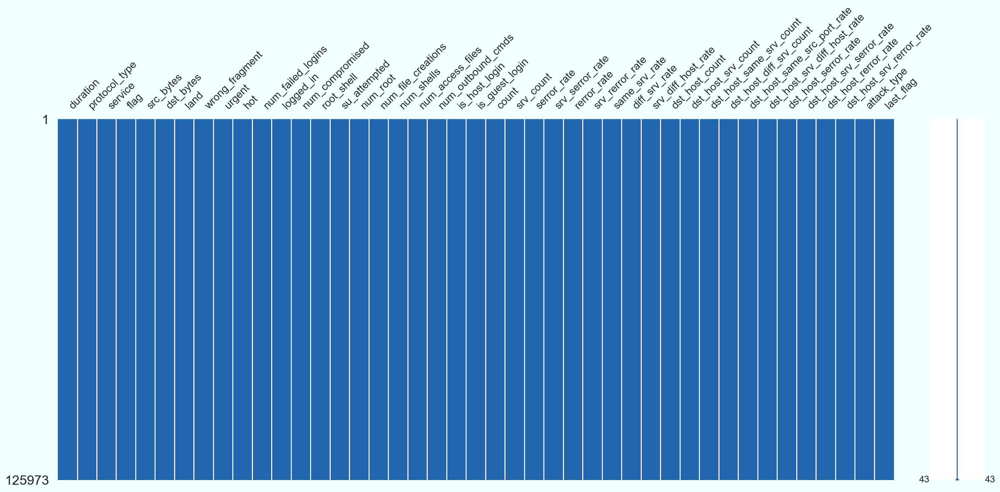

In [47]:
msno.matrix(dataset_network_train, color=(33 / 255, 102 / 255, 172 / 255));

In [48]:
df_test_missing

,Column Names,NULL value count per Column
0,duration,0
32,dst_host_srv_count,0
24,serror_rate,0
25,srv_serror_rate,0
26,rerror_rate,0
27,srv_rerror_rate,0
28,same_srv_rate,0
29,diff_srv_rate,0
30,srv_diff_host_rate,0
31,dst_host_count,0


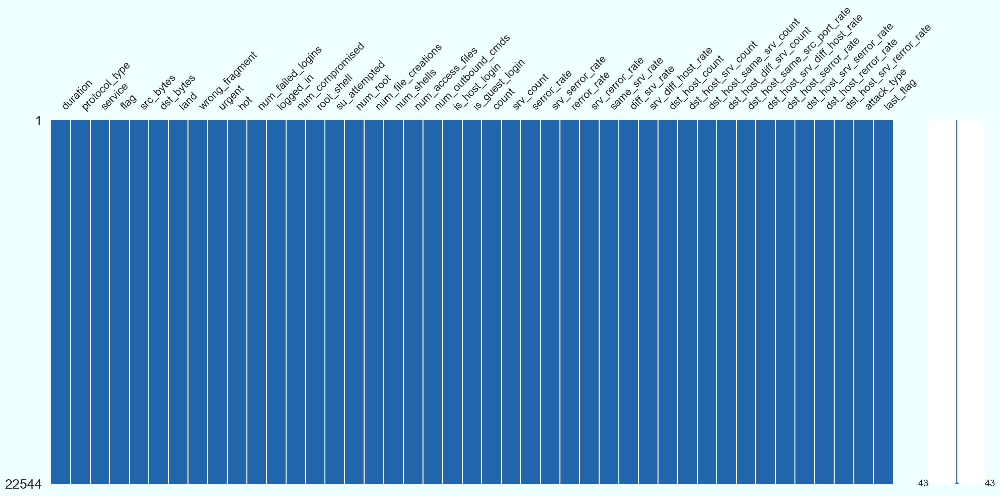

In [49]:
msno.matrix(dataset_network_test, color=(33 / 255, 102 / 255, 172 / 255));

### Key Observations
- Data has mostly float and integer values except three independent variables (protocol_type, service, and flag) which are object type (categorical)
- No variable column has null/missing values.

# Perform exploratory data analysis (EDA)

## Understanding Distribution of Feature(s)

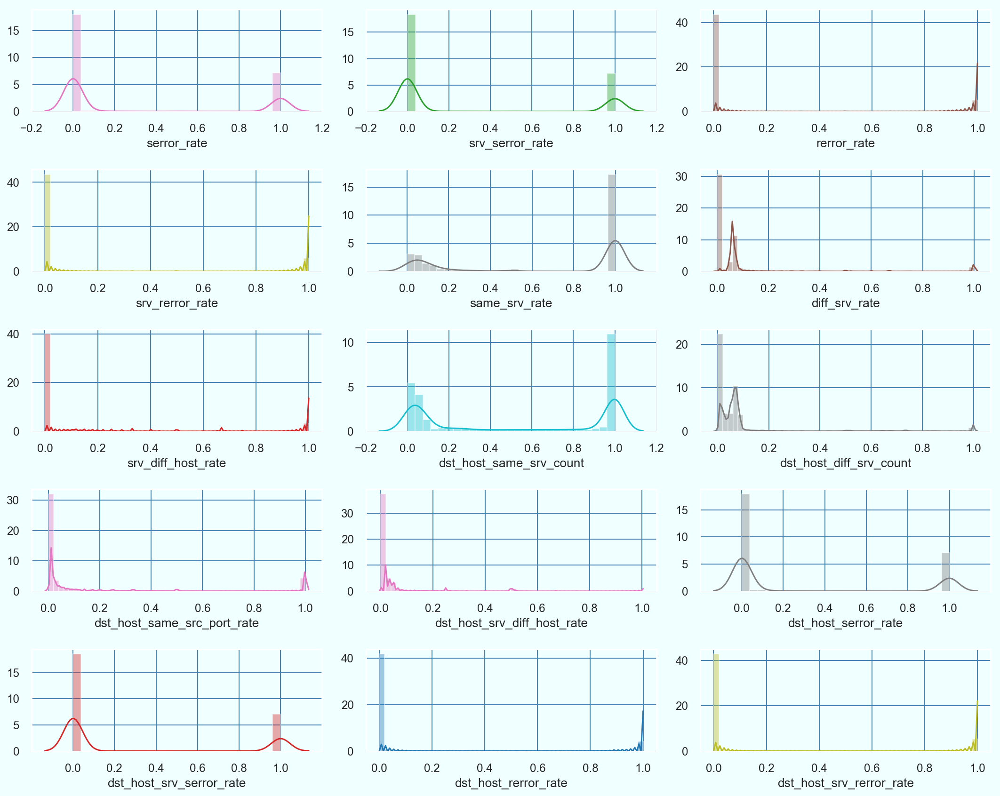

In [50]:
plot_distplot(dataset_network_train)

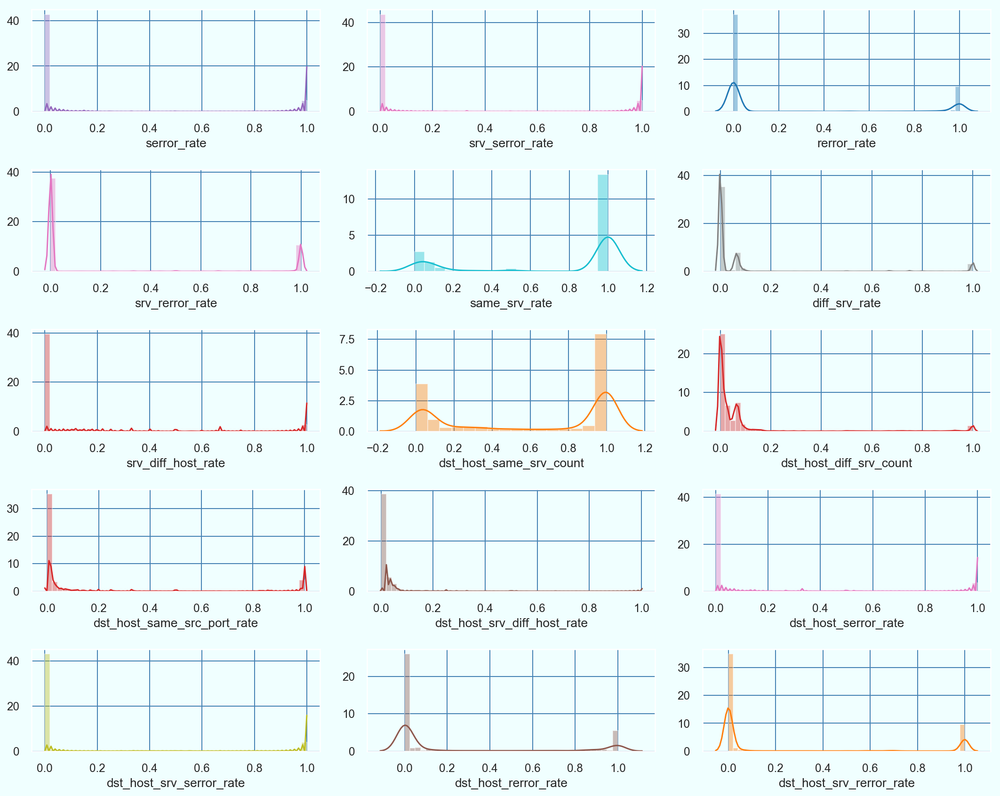

In [51]:
plot_distplot(dataset_network_test)

## Understanding Target variable (attack_type)

In [52]:
dataset_network_train.attack_type.unique()

array(['normal', 'neptune', 'warezclient', 'ipsweep', 'portsweep',
       'teardrop', 'nmap', 'satan', 'smurf', 'pod', 'back',
       'guess_passwd', 'ftp_write', 'multihop', 'rootkit',
       'buffer_overflow', 'imap', 'warezmaster', 'phf', 'land',
       'loadmodule', 'spy', 'perl'], dtype=object)

In [53]:
dataset_network_train.attack_type.value_counts()

normal             67343
neptune            41214
satan               3633
ipsweep             3599
portsweep           2931
smurf               2646
nmap                1493
back                 956
teardrop             892
warezclient          890
pod                  201
guess_passwd          53
buffer_overflow       30
warezmaster           20
land                  18
imap                  11
rootkit               10
loadmodule             9
ftp_write              8
multihop               7
phf                    4
perl                   3
spy                    2
Name: attack_type, dtype: int64

### Key Observations
- The dataset(s) has observations which are very less between 1 to 53 observations only.
- The dataset(s) are highly unbalanced.

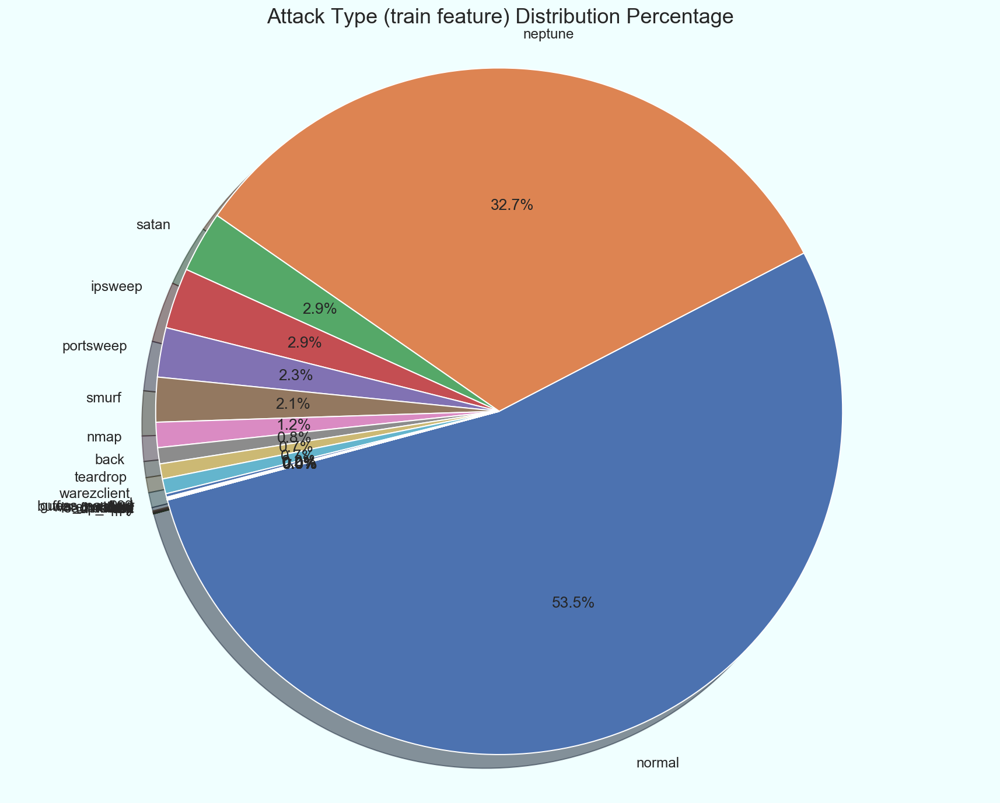

In [54]:
plot_valuecount_pieplot(dataset_network_train.attack_type,
                        'Attack Type (train feature) Distribution Percentage'
                        )

In [55]:
dataset_network_test.attack_type.unique()

array(['neptune', 'normal', 'saint', 'mscan', 'guess_passwd', 'smurf',
       'apache2', 'satan', 'buffer_overflow', 'back', 'warezmaster',
       'snmpgetattack', 'processtable', 'pod', 'httptunnel', 'nmap', 'ps',
       'snmpguess', 'ipsweep', 'mailbomb', 'portsweep', 'multihop',
       'named', 'sendmail', 'loadmodule', 'xterm', 'worm', 'teardrop',
       'rootkit', 'xlock', 'perl', 'land', 'xsnoop', 'sqlattack',
       'ftp_write', 'imap', 'udpstorm', 'phf'], dtype=object)

In [56]:
dataset_network_test.attack_type.value_counts()

normal             9711
neptune            4657
guess_passwd       1231
mscan               996
warezmaster         944
apache2             737
satan               735
processtable        685
smurf               665
back                359
snmpguess           331
saint               319
mailbomb            293
snmpgetattack       178
portsweep           157
ipsweep             141
httptunnel          133
nmap                 73
pod                  41
buffer_overflow      20
multihop             18
named                17
ps                   15
sendmail             14
rootkit              13
xterm                13
teardrop             12
xlock                 9
land                  7
xsnoop                4
ftp_write             3
loadmodule            2
perl                  2
udpstorm              2
phf                   2
sqlattack             2
worm                  2
imap                  1
Name: attack_type, dtype: int64

### Key Observations
- The dataset(s) has observations which are very less between 1 to 73 observations only.
- The dataset(s) are highly unbalanced.

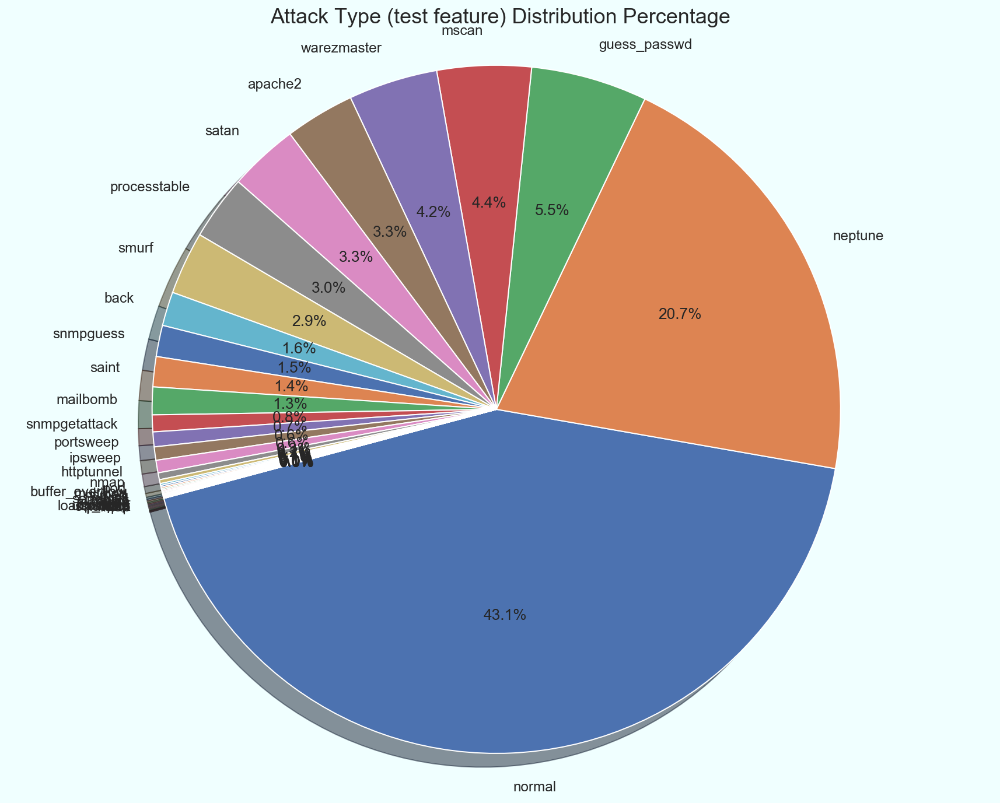

In [57]:
plot_valuecount_pieplot(dataset_network_test.attack_type,
                        'Attack Type (test feature) Distribution Percentage'
                        )

### Key Observations
- Train.txt data's target variable "attack_type" has less number of unique values then Test.txt. Test.txt has additional unique values which is not available for training.
- **Target variable/Dependent variable is discrete and categorical in nature.**

## Understanding Target variable (last_flag)

In [58]:
dataset_network_train.last_flag.unique()

array([20, 15, 19, 21, 18, 17, 16, 12, 14, 11,  2, 13, 10,  9,  8,  7,  3,
        5,  1,  6,  0,  4], dtype=int64)

In [59]:
dataset_network_train.last_flag.value_counts()

21    62557
18    20667
20    19339
19    10284
15     3990
17     3074
16     2393
12      729
14      674
11      641
13      451
10      253
9       194
7       118
8       106
6        96
5        81
4        79
0        66
3        65
1        62
2        54
Name: last_flag, dtype: int64

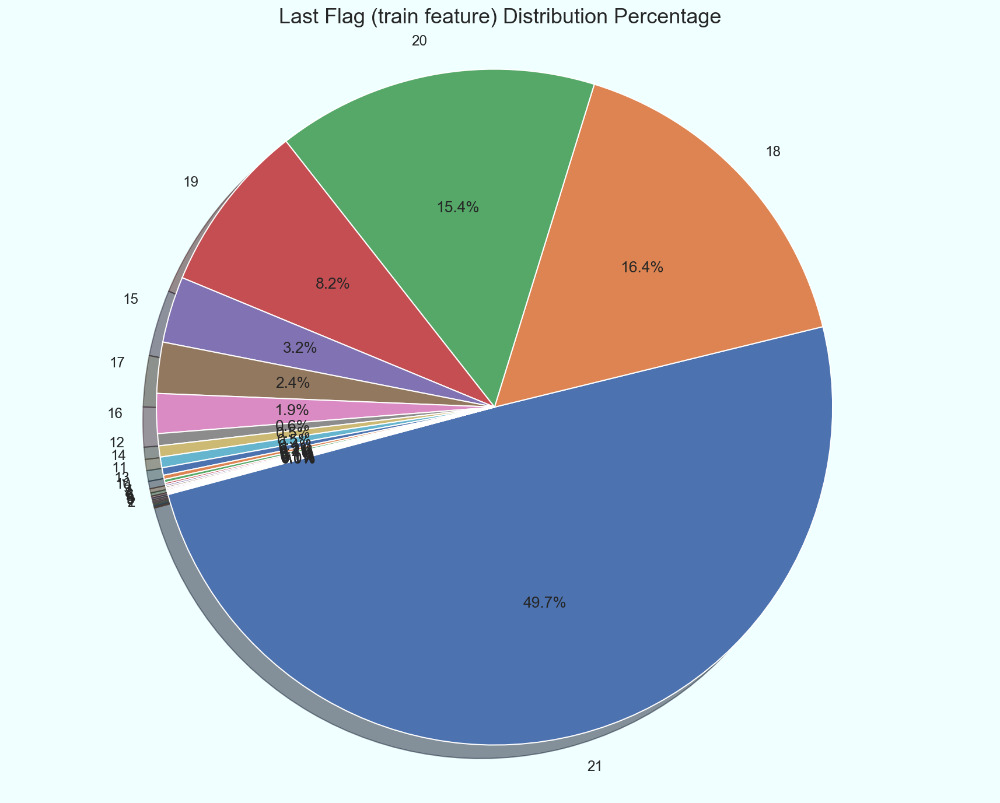

In [60]:
plot_valuecount_pieplot(dataset_network_train.last_flag,
                        'Last Flag (train feature) Distribution Percentage'
                        )

In [61]:
dataset_network_test.last_flag.unique()

array([21, 15, 11,  7,  9, 18, 14, 20, 17,  1, 19, 12, 13,  3,  8,  0, 16,
       10,  2,  5,  6,  4], dtype=int64)

In [62]:
dataset_network_test.last_flag.value_counts()

21    10694
18     2967
20     1343
15     1176
17     1168
19      890
14      736
16      681
13      519
12      486
11      461
7       249
10      195
6       157
8       131
0       123
3       116
9       106
5       103
4       101
1        87
2        55
Name: last_flag, dtype: int64

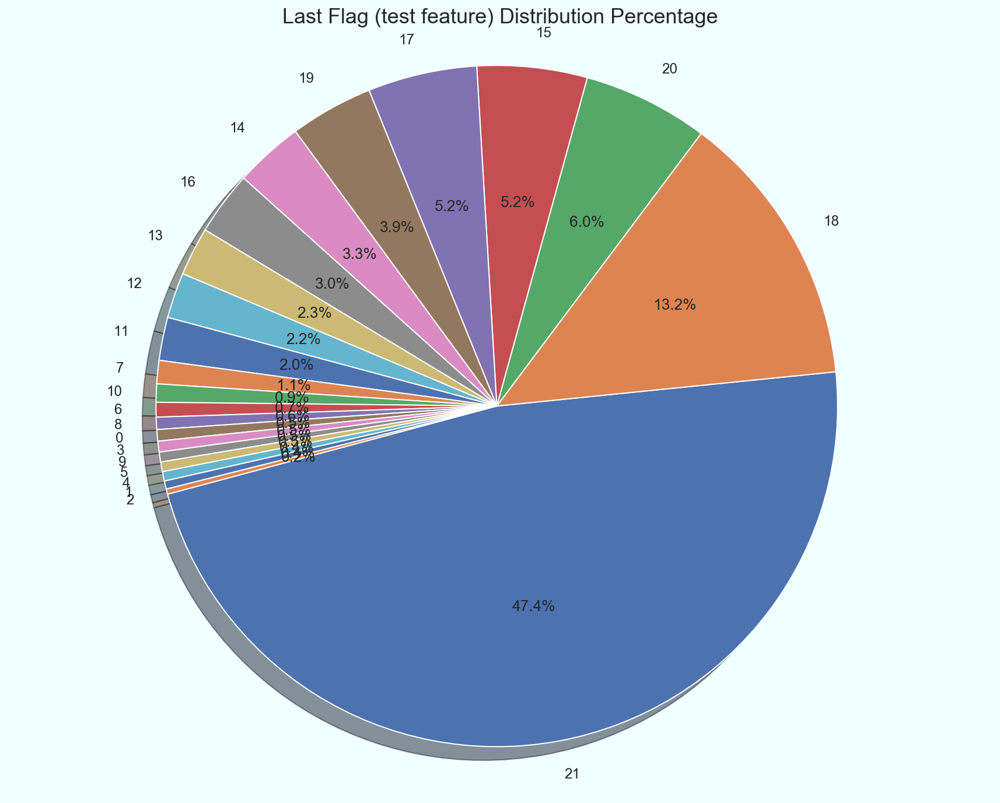

In [63]:
plot_valuecount_pieplot(dataset_network_test.last_flag,
                        'Last Flag (test feature) Distribution Percentage'
                        )

## Understanding distribution of Nominal Features

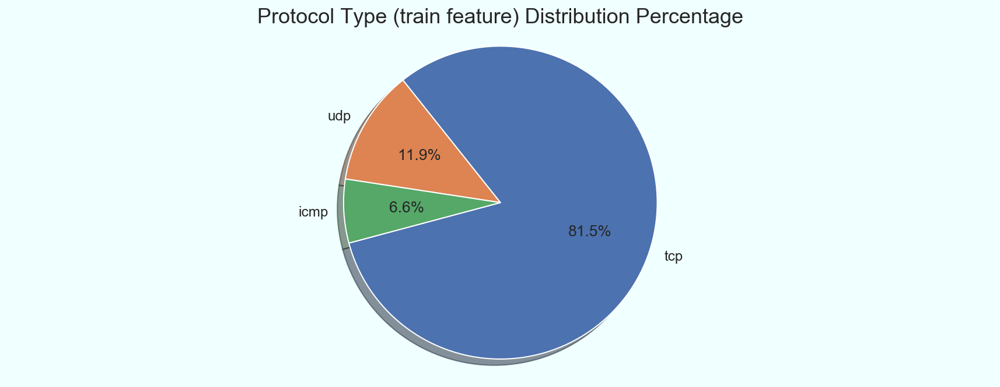

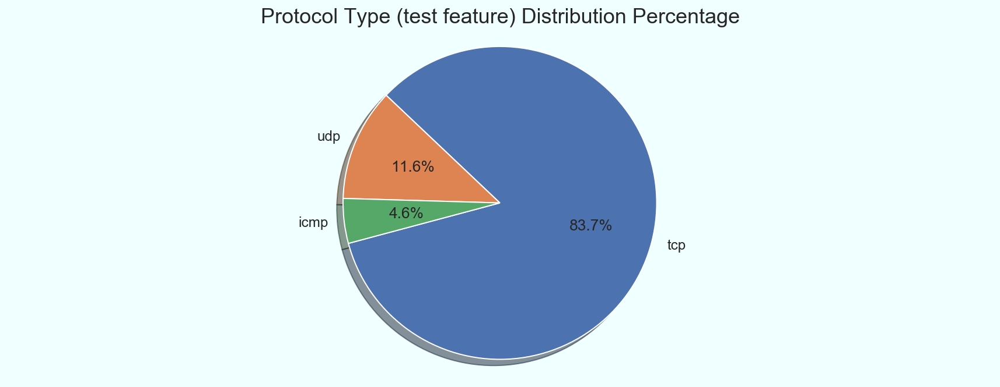

<Figure size 1080x864 with 0 Axes>

In [64]:
plt.subplot(211)
plot_valuecount_pieplot(dataset_network_train.protocol_type,
                        'Protocol Type (train feature) Distribution Percentage'
                        )
plt.subplot(212)
plot_valuecount_pieplot(dataset_network_test.protocol_type,
                        'Protocol Type (test feature) Distribution Percentage'
                        )
plt.tight_layout()
plt.show()

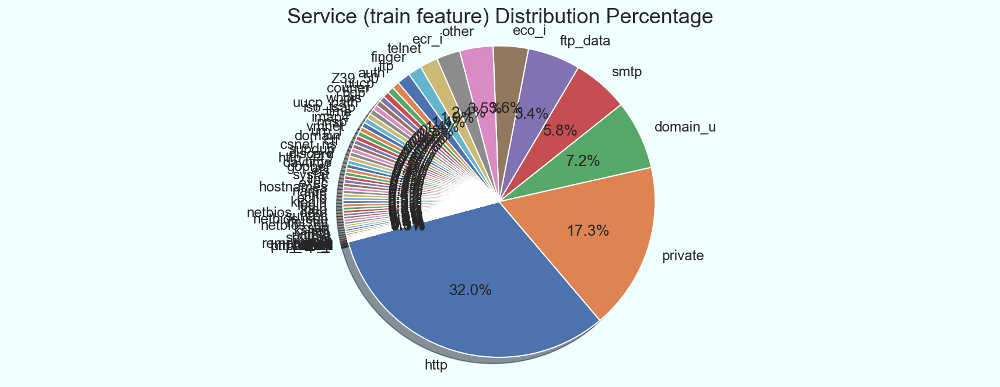

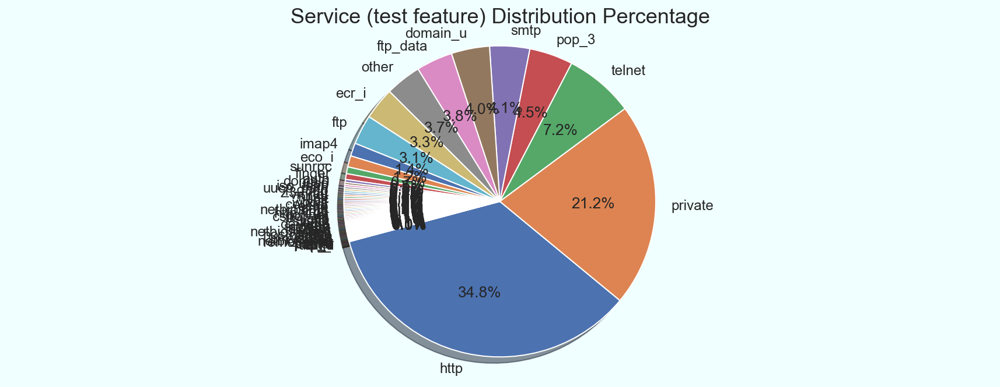

<Figure size 1080x864 with 0 Axes>

In [65]:
plt.subplot(211)
plot_valuecount_pieplot(dataset_network_train.service,
                        'Service (train feature) Distribution Percentage'
                        )
plt.subplot(212)
plot_valuecount_pieplot(dataset_network_test.service,
                        'Service (test feature) Distribution Percentage'
                        )
plt.tight_layout()
plt.show()

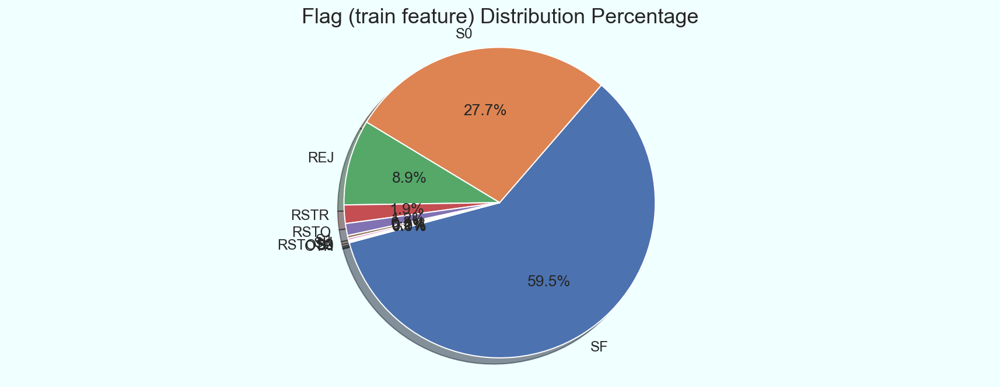

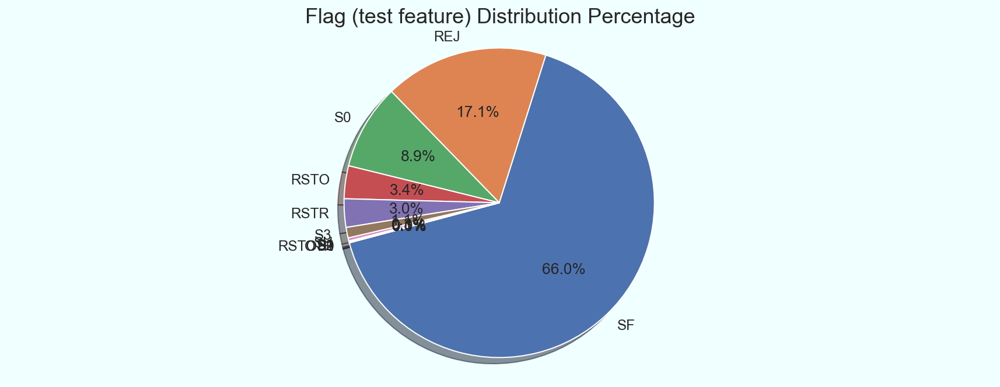

<Figure size 1080x864 with 0 Axes>

In [66]:
plt.subplot(211)
plot_valuecount_pieplot(dataset_network_train.flag,
                        'Flag (train feature) Distribution Percentage')
plt.subplot(212)
plot_valuecount_pieplot(dataset_network_test.flag,
                        'Flag (test feature) Distribution Percentage')
plt.tight_layout()
plt.show()

## Understanding distribution of Binary Features

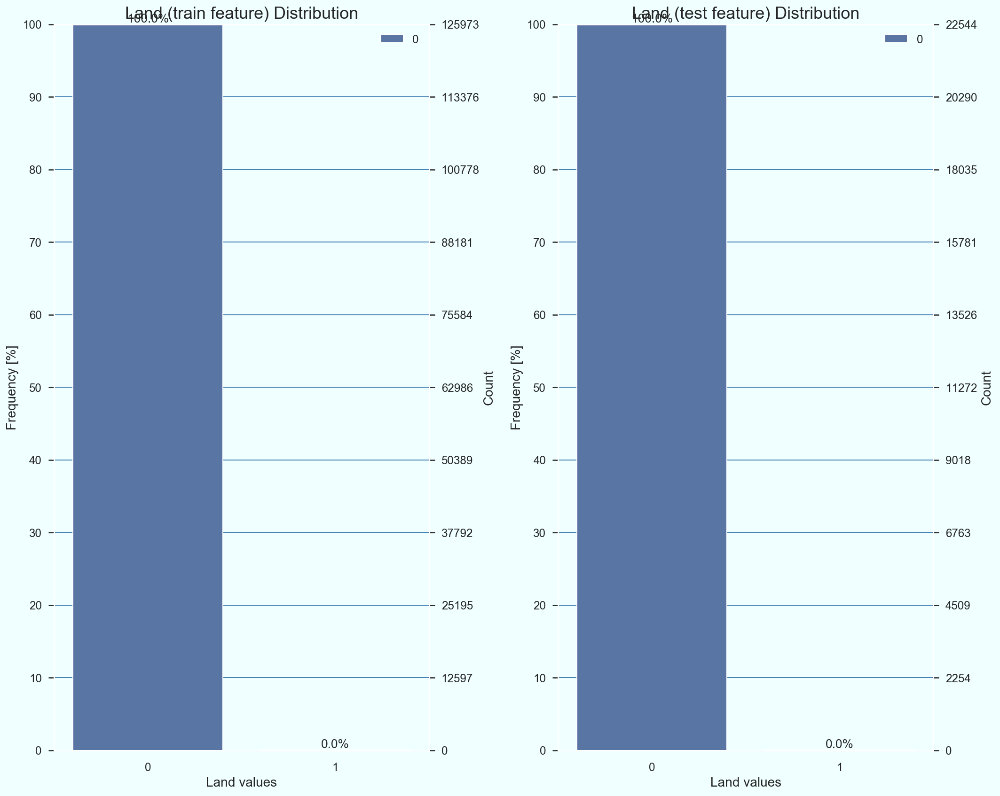

In [67]:
plt.subplot(121)
plot_countplot(dataset_network_train.land,
               'Land (train feature) Distribution', 'Land values')
plt.subplot(122)
plot_countplot(dataset_network_test.land,
               'Land (test feature) Distribution', 'Land values')
plt.tight_layout()
plt.show()

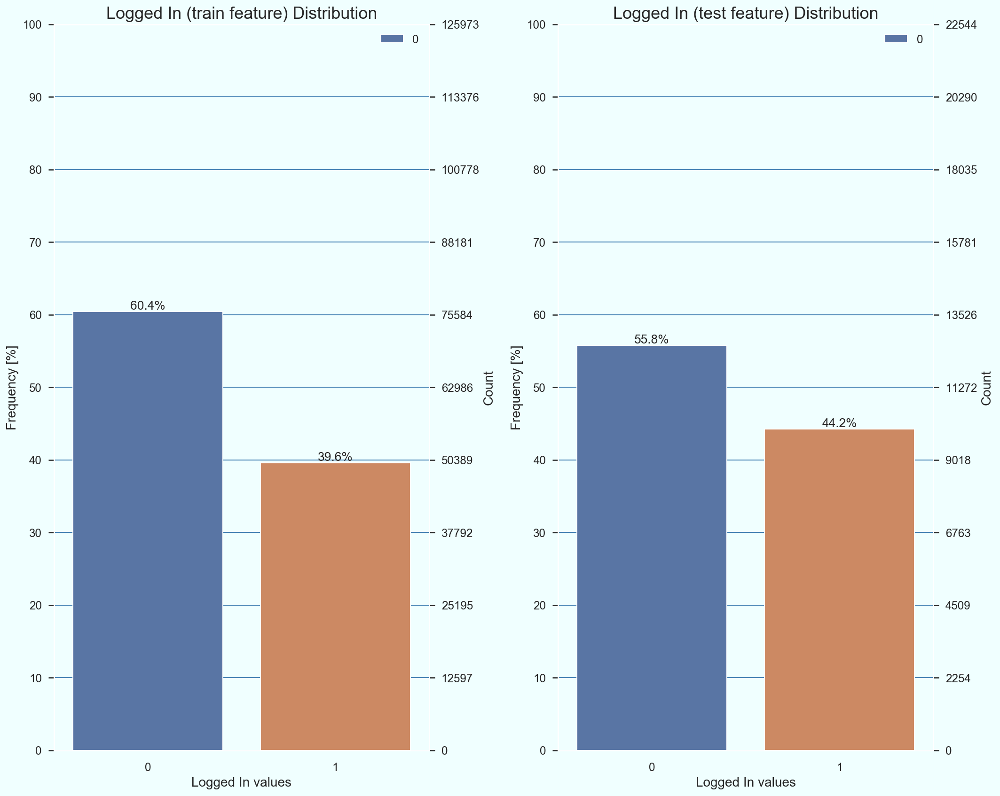

In [68]:
plt.subplot(121)
plot_countplot(dataset_network_train.logged_in,
               'Logged In (train feature) Distribution',
               'Logged In values')
plt.subplot(122)
plot_countplot(dataset_network_test.logged_in,
               'Logged In (test feature) Distribution',
               'Logged In values')
plt.tight_layout()
plt.show()

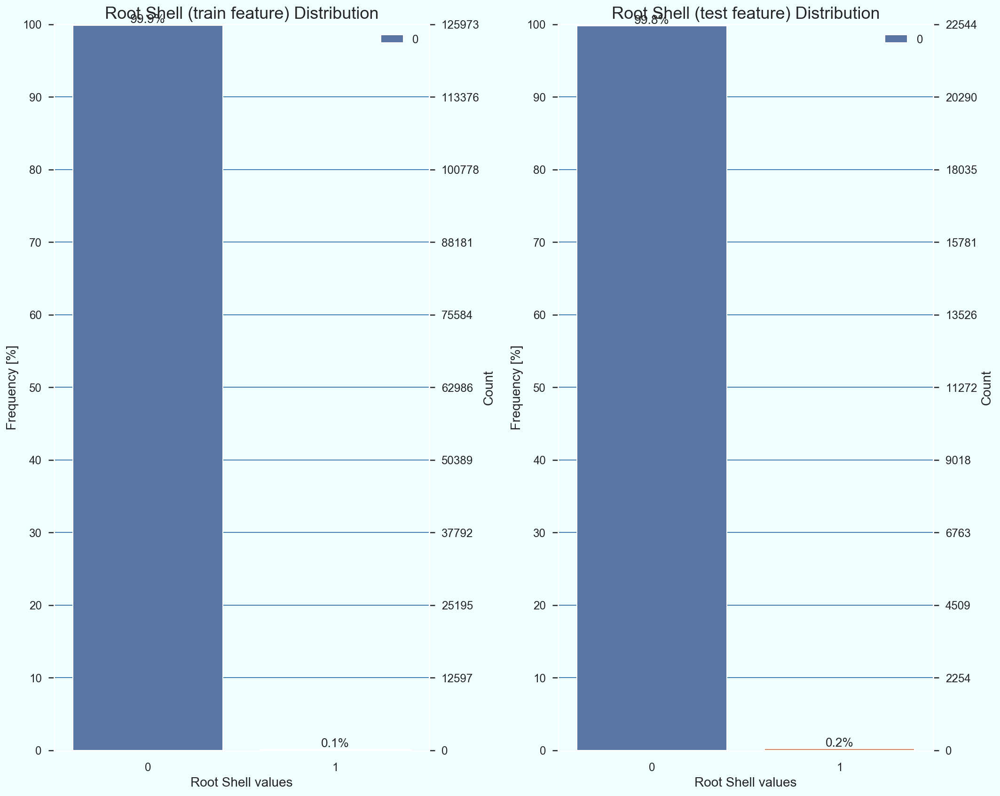

In [69]:
plt.subplot(121)
plot_countplot(dataset_network_train.root_shell,
               'Root Shell (train feature) Distribution',
               'Root Shell values')
plt.subplot(122)
plot_countplot(dataset_network_test.root_shell,
               'Root Shell (test feature) Distribution',
               'Root Shell values')
plt.tight_layout()
plt.show()

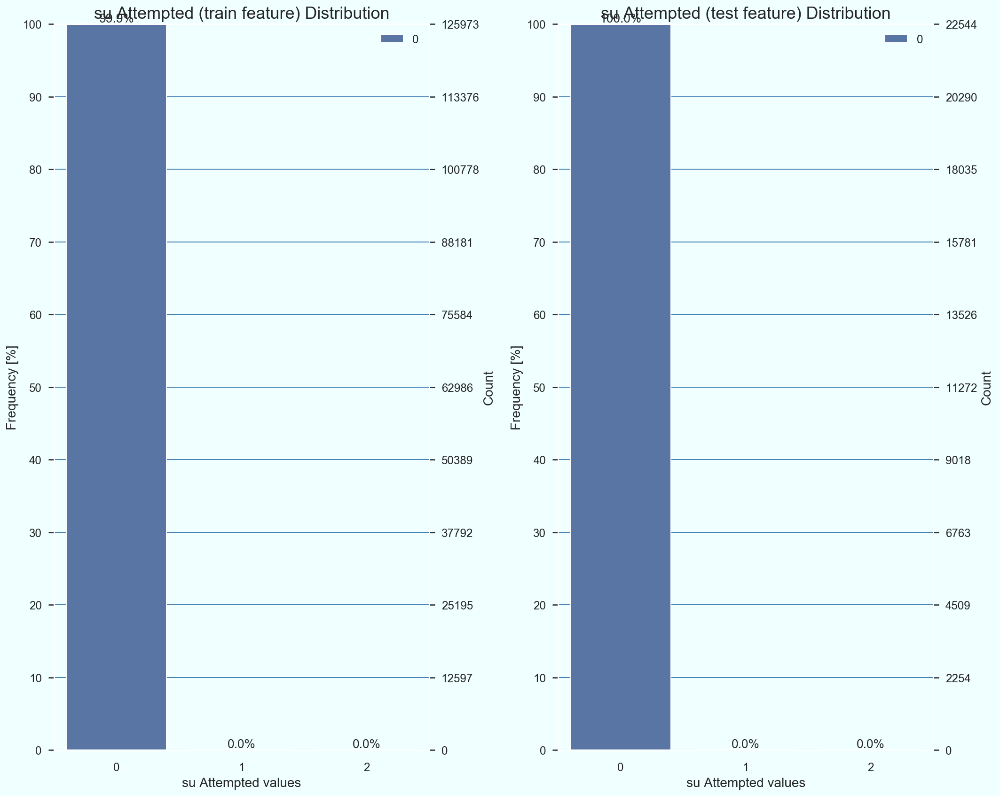

In [70]:
plt.subplot(121)
plot_countplot(dataset_network_train.su_attempted,
               'su Attempted (train feature) Distribution',
               'su Attempted values')
plt.subplot(122)
plot_countplot(dataset_network_test.su_attempted,
               'su Attempted (test feature) Distribution',
               'su Attempted values')
plt.tight_layout()
plt.show()

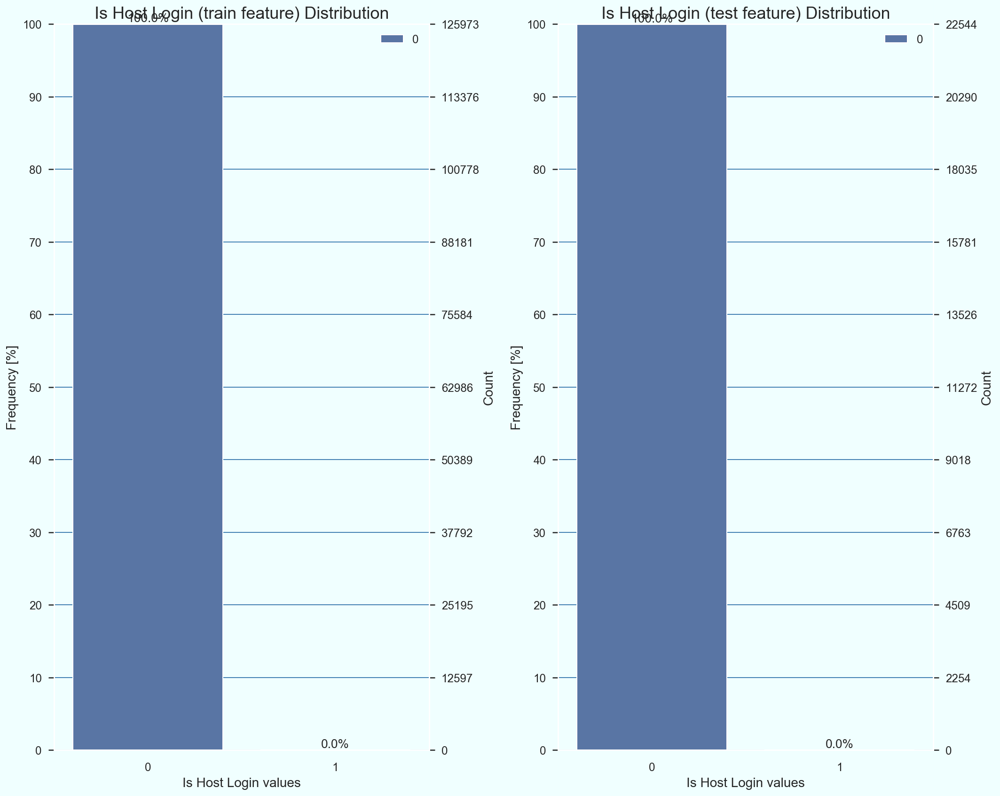

In [71]:
plt.subplot(121)
plot_countplot(dataset_network_train.is_host_login,
               'Is Host Login (train feature) Distribution',
               'Is Host Login values')
plt.subplot(122)
plot_countplot(dataset_network_test.is_host_login,
               'Is Host Login (test feature) Distribution',
               'Is Host Login values')
plt.tight_layout()
plt.show()

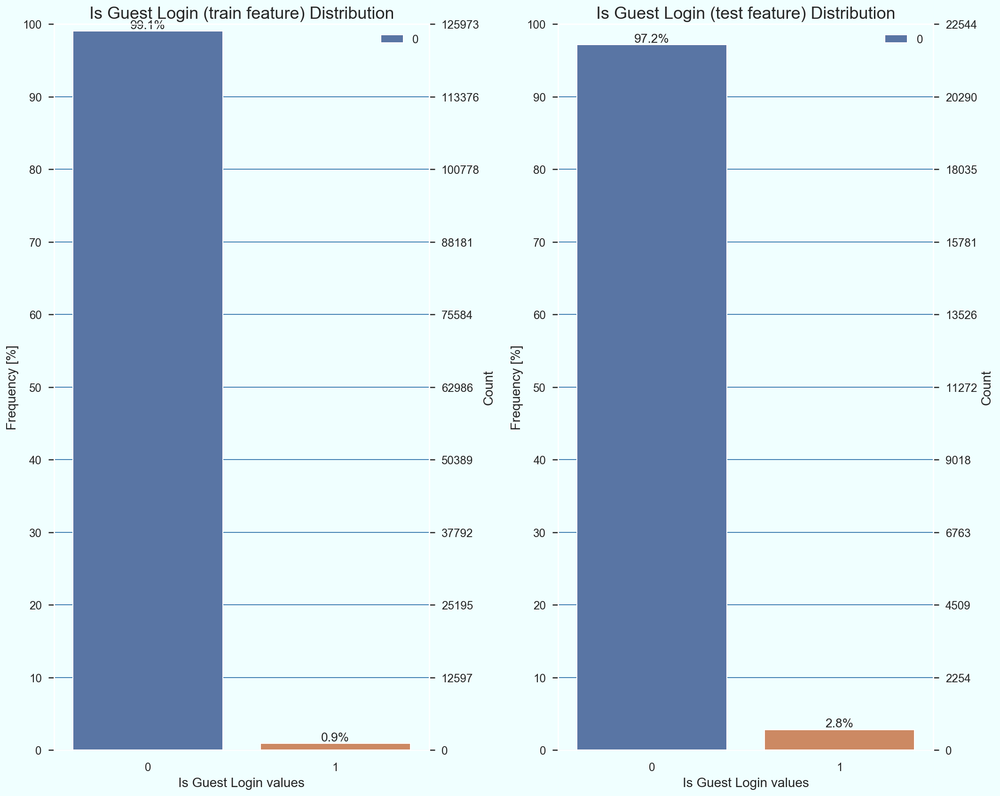

In [72]:
plt.subplot(121)
plot_countplot(dataset_network_train.is_guest_login,
               'Is Guest Login (train feature) Distribution',
               'Is Guest Login values')
plt.subplot(122)
plot_countplot(dataset_network_test.is_guest_login,
               'Is Guest Login (test feature) Distribution',
               'Is Guest Login values')
plt.tight_layout()
plt.show()

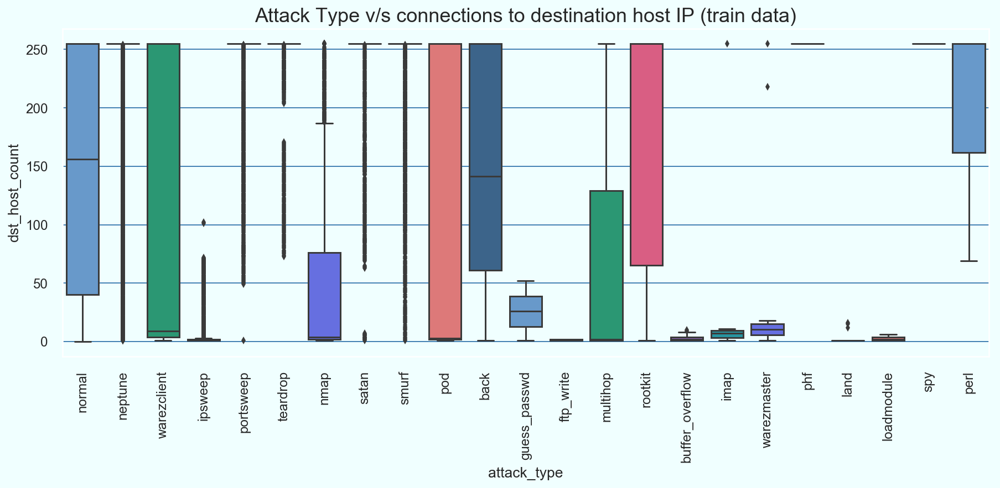

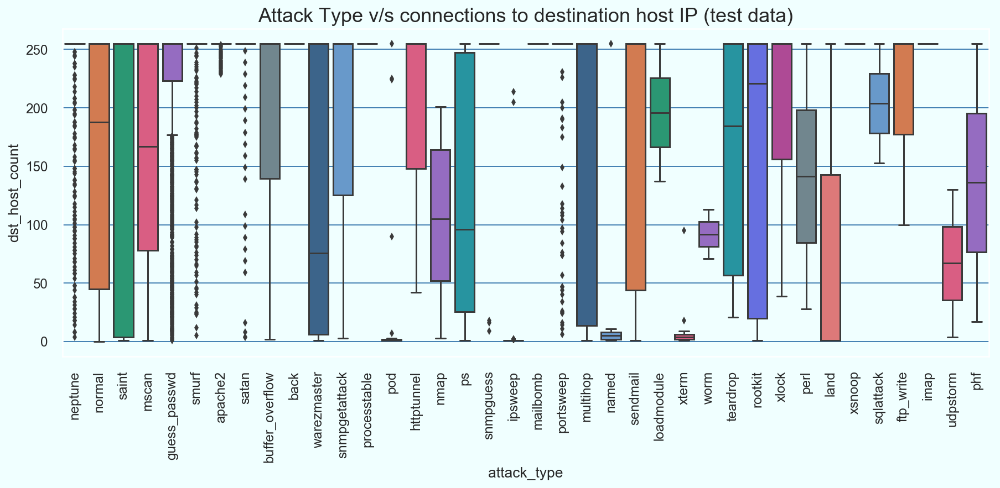

In [73]:
plt.subplot(211)
plot_boxplot(dataset_network_train.attack_type, 
             dataset_network_train.dst_host_count, 
             title='Attack Type v/s connections to destination host IP (train data)'
            );
plt.subplot(211)
plot_boxplot(dataset_network_test.attack_type, 
             dataset_network_test.dst_host_count, 
             title='Attack Type v/s connections to destination host IP (test data)'
            );
plt.show()

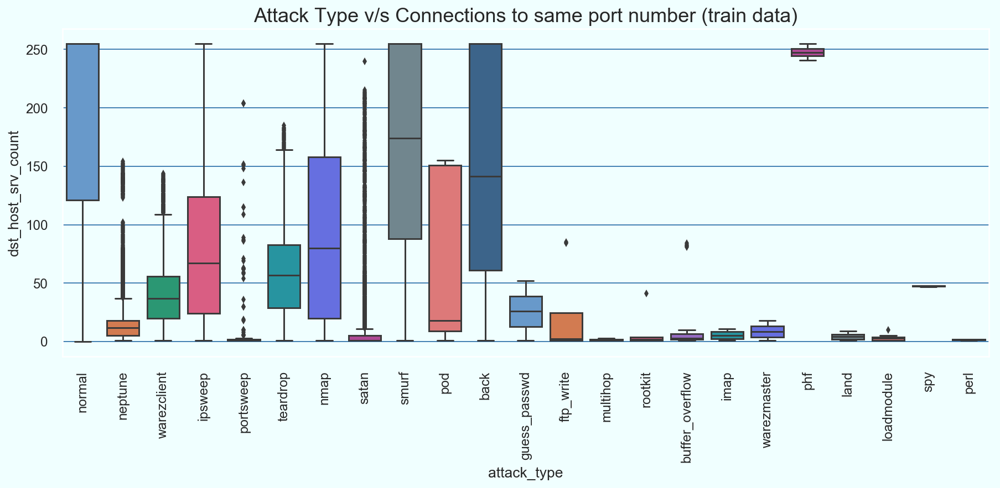

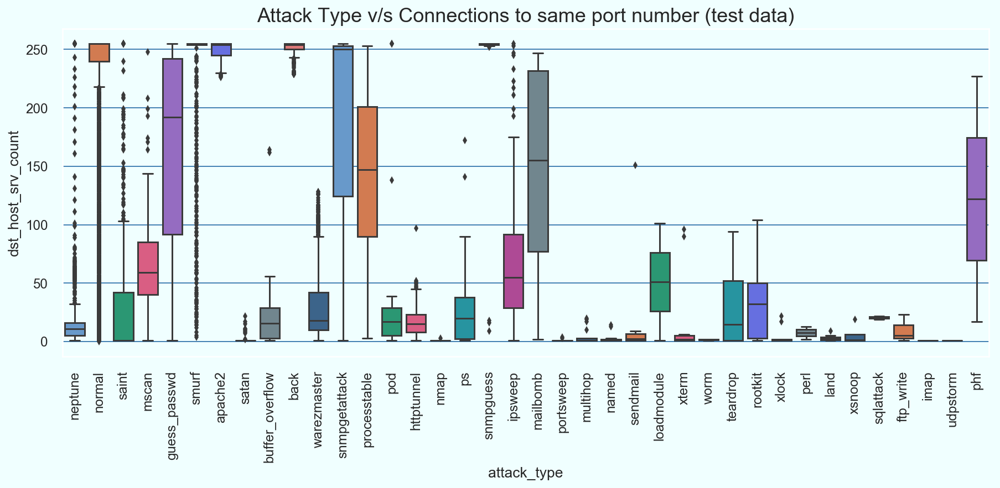

In [74]:
plt.subplot(211)
plot_boxplot(dataset_network_train.attack_type, 
             dataset_network_train.dst_host_srv_count, 
             title='Attack Type v/s Connections to same port number (train data)'
            );
plt.subplot(211)
plot_boxplot(dataset_network_test.attack_type, 
             dataset_network_test.dst_host_srv_count, 
             title='Attack Type v/s Connections to same port number (test data)'
            );
plt.show()

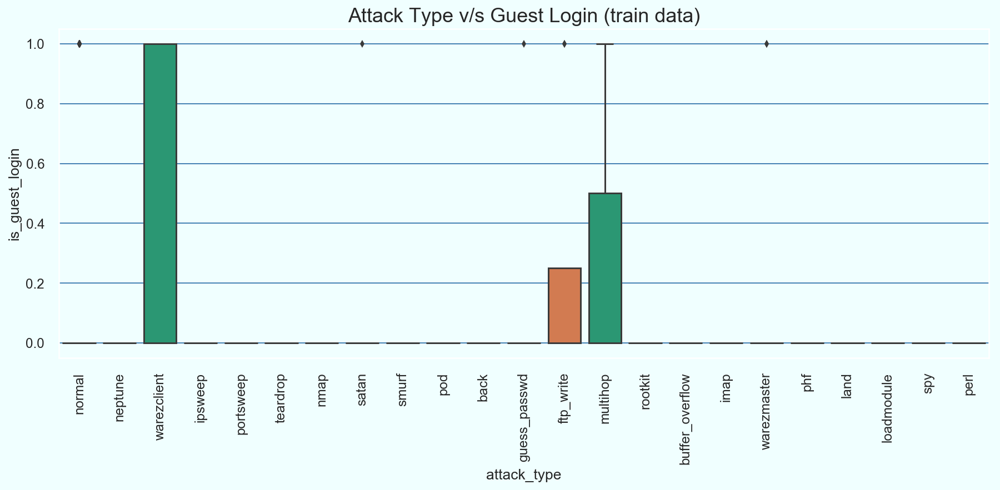

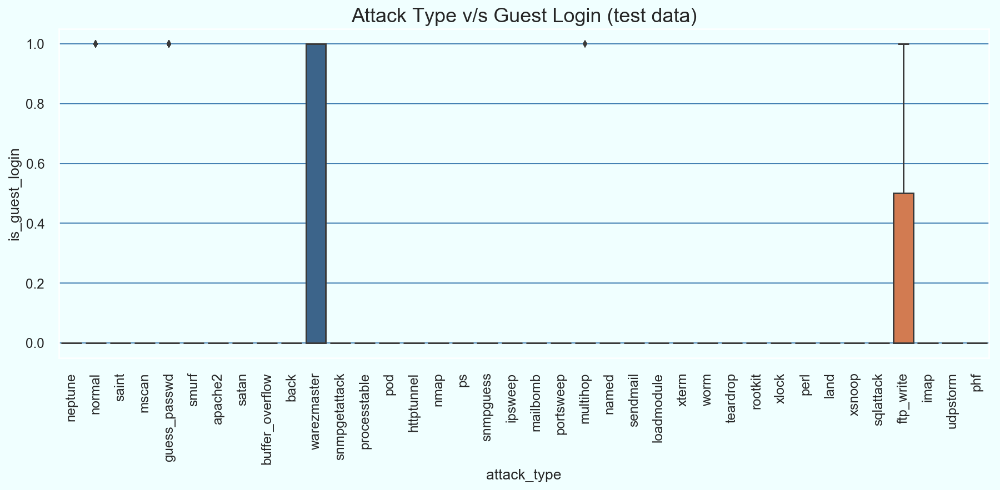

In [75]:
plt.subplot(211)
plot_boxplot(dataset_network_train.attack_type, 
             dataset_network_train.is_guest_login, 
             title='Attack Type v/s Guest Login (train data)'
            );
plt.subplot(211)
plot_boxplot(dataset_network_test.attack_type, 
             dataset_network_test.is_guest_login, 
             title='Attack Type v/s Guest Login (test data)'
            );
plt.show()

# Feature Engineering

## Correlation Matrix

In [76]:
df_corr = dataset_network_train.corr(method='spearman')
df_corr

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,root_shell,su_attempted,num_root,num_file_creations,num_shells,num_access_files,num_outbound_cmds,is_host_login,is_guest_login,count,srv_count,serror_rate,srv_serror_rate,rerror_rate,srv_rerror_rate,same_srv_rate,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_count,dst_host_diff_srv_count,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,last_flag
duration,1.000000,0.226289,0.148983,-0.004136,-0.027429,0.029670,0.229319,0.058024,0.119651,0.080430,0.074821,0.075079,0.042033,0.086589,0.009893,0.048248,NaN,0.009817,0.305264,-0.323663,-0.319135,-0.184564,-0.181817,0.051243,0.045693,0.168681,-0.139716,0.015576,-0.066844,-0.156473,-0.140483,0.196320,0.182132,-0.026560,-0.155824,-0.153078,0.065207,0.068996,-0.007767
src_bytes,0.226289,1.000000,0.700442,-0.015303,0.015848,0.007789,0.204355,0.012740,0.776844,0.154821,0.040084,0.033547,0.080847,0.072759,0.029673,0.063387,NaN,0.000955,0.132652,-0.523823,-0.053056,-0.673558,-0.652557,-0.363120,-0.344039,0.752801,-0.705392,0.289111,-0.405293,0.620720,0.617294,-0.525394,0.377040,0.343929,-0.624111,-0.608681,-0.229499,-0.259287,0.279580
dst_bytes,0.148983,0.700442,1.000000,-0.012239,-0.080977,0.013028,0.200110,0.025260,0.822190,0.171165,0.062631,0.046253,-0.012985,0.040314,-0.006556,0.068272,NaN,0.004716,0.131275,-0.439640,-0.016658,-0.536478,-0.510009,-0.299625,-0.277687,0.629973,-0.608104,0.310325,-0.342276,0.707573,0.666924,-0.624866,0.059123,0.327014,-0.519159,-0.483431,-0.218704,-0.186047,0.460242
land,-0.004136,-0.015303,-0.012239,1.000000,-0.001316,-0.000119,-0.002073,-0.000439,-0.011402,-0.001431,-0.000516,-0.000355,-0.001014,-0.000673,-0.000272,-0.000766,NaN,-0.000040,-0.001374,-0.017707,-0.013622,0.021598,0.022250,-0.003908,-0.005409,0.008607,-0.008086,0.023460,-0.026018,-0.017995,0.012719,-0.011336,0.022817,0.021344,0.020113,0.017276,-0.003990,-0.005984,-0.017332
wrong_fragment,-0.027429,0.015848,-0.080977,-0.001316,1.000000,-0.000790,-0.013749,-0.002909,-0.075605,-0.009488,-0.003424,-0.002355,-0.006723,-0.004464,-0.001805,-0.005077,NaN,-0.000263,-0.009112,0.011829,0.085125,-0.040707,-0.060279,-0.018378,-0.035871,0.047834,-0.047221,-0.027775,0.022517,-0.018833,-0.020442,0.032054,0.109508,-0.036583,-0.016905,-0.063794,0.038362,-0.039682,-0.146584
urgent,0.029670,0.007789,0.013028,-0.000119,-0.000790,1.000000,0.017955,0.060172,0.008524,0.055610,0.102325,0.111647,0.078350,0.058679,-0.000163,0.016865,NaN,-0.000024,-0.000824,-0.011476,-0.011743,-0.005634,-0.005454,-0.003241,-0.003245,0.006498,-0.006571,-0.004512,-0.006790,-0.011919,-0.004589,0.002349,0.004120,-0.000385,-0.004700,-0.005772,-0.003949,-0.003590,-0.007988
hot,0.229319,0.204355,0.200110,-0.002073,-0.013749,0.017955,1.000000,0.092974,0.171878,0.514724,0.140361,0.015718,0.008543,0.052763,0.014253,0.002123,NaN,0.018784,0.665821,-0.153166,-0.143470,-0.086205,-0.082632,-0.009033,0.012295,0.106979,-0.103591,-0.028497,-0.068595,0.004939,0.063152,-0.060204,-0.001804,-0.066183,-0.063820,-0.070269,0.095387,0.095205,-0.152387
num_failed_logins,0.058024,0.012740,0.025260,-0.000439,-0.002909,0.060172,0.092974,1.000000,-0.011102,0.035221,0.026757,0.090380,0.037102,0.062769,-0.000602,0.003015,NaN,-0.000088,0.002249,-0.038077,-0.039550,-0.018389,-0.018135,0.030823,0.030205,0.022804,-0.022191,-0.016621,-0.031247,-0.018930,0.007478,-0.002810,0.015013,-0.018310,0.007159,0.007902,0.029613,0.029172,-0.048949
logged_in,0.119651,0.776844,0.822190,-0.011402,-0.075605,0.008524,0.171878,-0.011102,1.000000,0.125492,0.045290,0.031150,0.088923,0.058708,0.023873,0.067158,NaN,0.003482,0.119678,-0.503868,-0.137034,-0.492653,-0.472549,-0.283275,-0.263681,0.596788,-0.588050,0.265448,-0.424506,0.642934,0.606223,-0.555504,0.144428,0.426757,-0.464252,-0.430866,-0.196843,-0.175929,0.491281
num_compromised,0.080430,0.154821,0

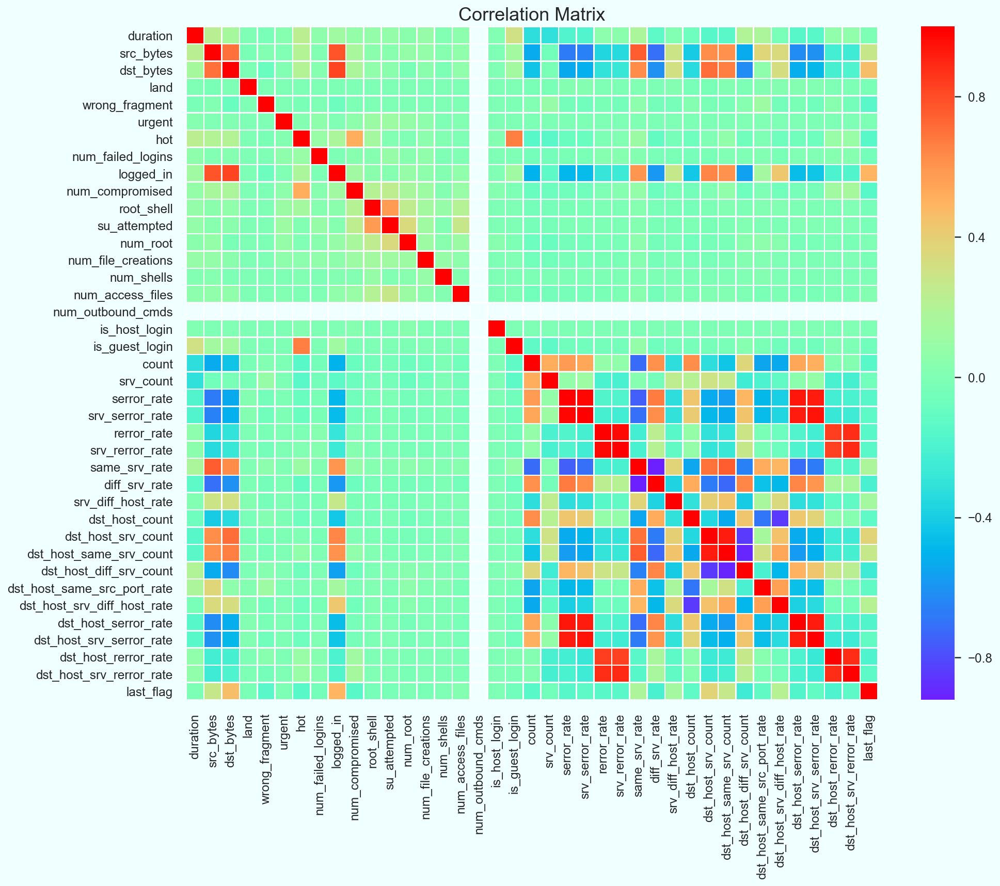

In [77]:
# Generate a mask for the upper triangle
#mask = np.zeros_like(df_corr, dtype=np.bool)
#mask[np.triu_indices_from(mask)] = True

sns.heatmap(
    df_corr,
    cmap='rainbow',
    annot=False,
    fmt='.2f',
    center=0,
    square=False,
    linewidths=.75,
    #mask=mask,
    );
plt.title('Correlation Matrix', fontsize=18)
plt.show()

In [78]:
getHighlyCorrelatedColumns(dataset_network_train, 10)

,level_0,level_1,0
0,num_compromised,num_root,0.998833
1,serror_rate,srv_serror_rate,0.993289
2,rerror_rate,srv_rerror_rate,0.989008
3,srv_serror_rate,dst_host_srv_serror_rate,0.986252
4,dst_host_serror_rate,dst_host_srv_serror_rate,0.985052
5,serror_rate,dst_host_srv_serror_rate,0.981139
6,serror_rate,dst_host_serror_rate,0.979373
7,srv_serror_rate,dst_host_serror_rate,0.977596
8,srv_rerror_rate,dst_host_srv_rerror_rate,0.970208
9,rerror_rate,dst_host_srv_rerror_rate,0.964449


In [79]:
upper = df_corr.where(np.triu(np.ones(df_corr.shape), k=1).astype(np.bool))

to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]

print(f'Columns to drop from Train and Test datasets are {to_drop}.')

dataset_network_train.drop(columns=to_drop, axis=1, inplace=True)
dataset_network_test.drop(columns=to_drop, axis=1, inplace=True)

(dataset_network_train.shape, dataset_network_test.shape)

Columns to drop from Train and Test datasets are ['srv_serror_rate', 'srv_rerror_rate', 'dst_host_same_srv_count', 'dst_host_serror_rate', 'dst_host_srv_serror_rate'].


((125973, 38), (22544, 38))

## Understanding Target Variable by Classes

In [80]:
dataset_network_train['attack_type_twoclass'] = \
    dataset_network_train['attack_type'].apply(attackTypeConverter)
dataset_network_test['attack_type_twoclass'] = \
    dataset_network_test['attack_type'].apply(attackTypeConverter)

dataset_network_train['attack_type_twoclass_num'] = \
    dataset_network_train['attack_type'].apply(attackTypeNumConverter)
dataset_network_test['attack_type_twoclass_num'] = \
    dataset_network_test['attack_type'].apply(attackTypeNumConverter)

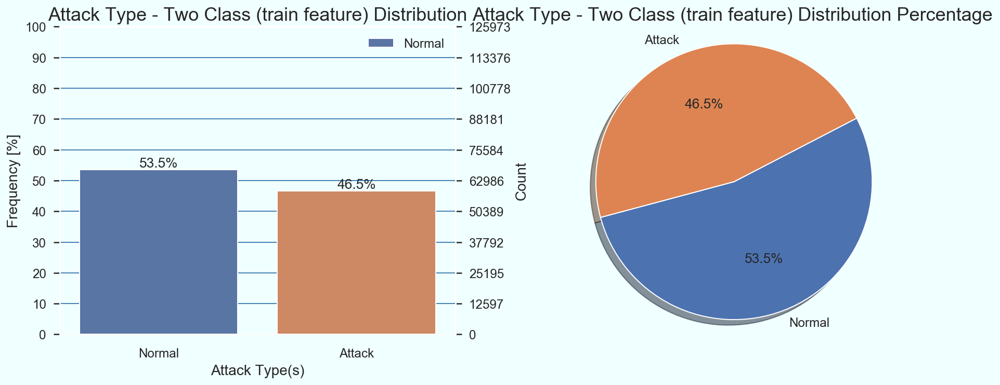

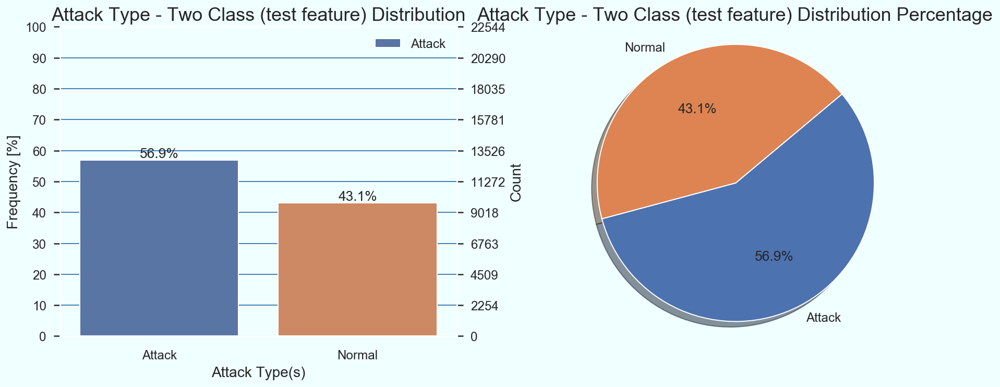

<Figure size 1080x864 with 0 Axes>

In [81]:
plt.subplot(221)
plot_countplot(dataset_network_train.attack_type_twoclass,
               'Attack Type - Two Class (train feature) Distribution',
               'Attack Type(s)')
plt.subplot(222)
plot_valuecount_pieplot(dataset_network_train.attack_type_twoclass,
                        'Attack Type - Two Class (train feature) Distribution Percentage'
                        )
plt.subplot(223)
plot_countplot(dataset_network_test.attack_type_twoclass,
               'Attack Type - Two Class (test feature) Distribution',
               'Attack Type(s)')
plt.subplot(224)
plot_valuecount_pieplot(dataset_network_test.attack_type_twoclass,
                        'Attack Type - Two Class (test feature) Distribution Percentage'
                        )
plt.tight_layout()
plt.show()

### Key Observations
- When dataset distributed in two attack types ("Normal", "Anomaly") then the dataset is nearly balanced

In [82]:
dataset_network_train['attack_type_fiveclass'] = \
    dataset_network_train['attack_type'].apply(attackTypeMultiConverter)
dataset_network_test['attack_type_fiveclass'] = \
    dataset_network_test['attack_type'].apply(attackTypeMultiConverter)

dataset_network_train['attack_type_fiveclass_num'] = \
    dataset_network_train['attack_type'
                          ].apply(attackTypeMultiNumConverter)
dataset_network_test['attack_type_fiveclass_num'] = \
    dataset_network_test['attack_type'
                         ].apply(attackTypeMultiNumConverter)

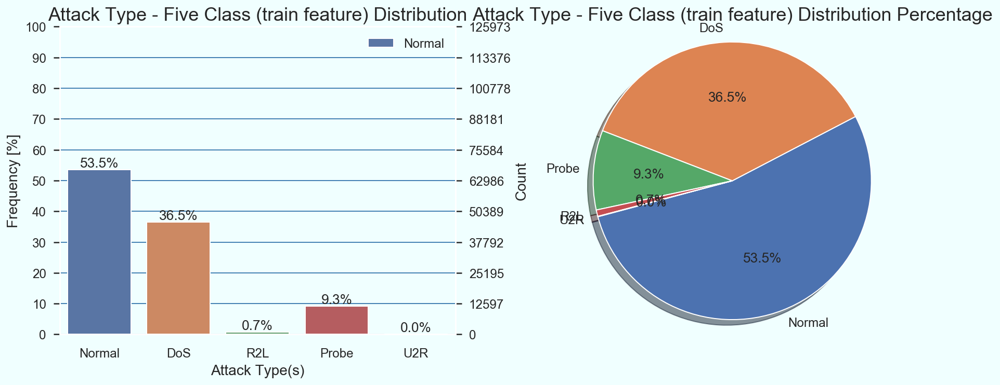

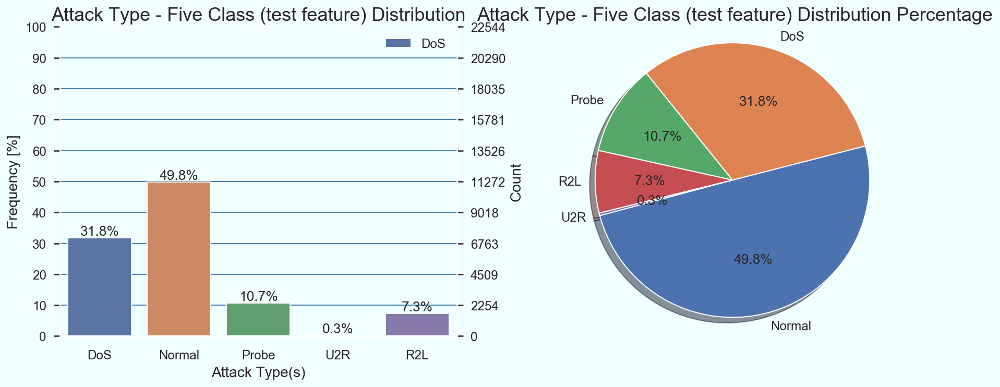

<Figure size 1080x864 with 0 Axes>

In [83]:
plt.subplot(221)
plot_countplot(dataset_network_train.attack_type_fiveclass,
               'Attack Type - Five Class (train feature) Distribution',
               'Attack Type(s)')
plt.subplot(222)
plot_valuecount_pieplot(dataset_network_train.attack_type_fiveclass,
                        'Attack Type - Five Class (train feature) Distribution Percentage'
                        )
plt.subplot(223)
plot_countplot(dataset_network_test.attack_type_fiveclass,
               'Attack Type - Five Class (test feature) Distribution',
               'Attack Type(s)')
plt.subplot(224)
plot_valuecount_pieplot(dataset_network_test.attack_type_fiveclass,
                        'Attack Type - Five Class (test feature) Distribution Percentage'
                        )
plt.tight_layout()
plt.show()

### Key Observations
- When dataset distributed in five attack types ("Normal", "DoS", "Probe", "R2L", "U2R") then the dataset is unbalanced.
- 88.6% dataset is distributed between attack types - "Normal", and "DoS".

In [84]:
(dataset_network_train.shape, dataset_network_test.shape)

((125973, 42), (22544, 42))

## Perform exploratory data analysis (EDA) by **attack_type (five classes)**

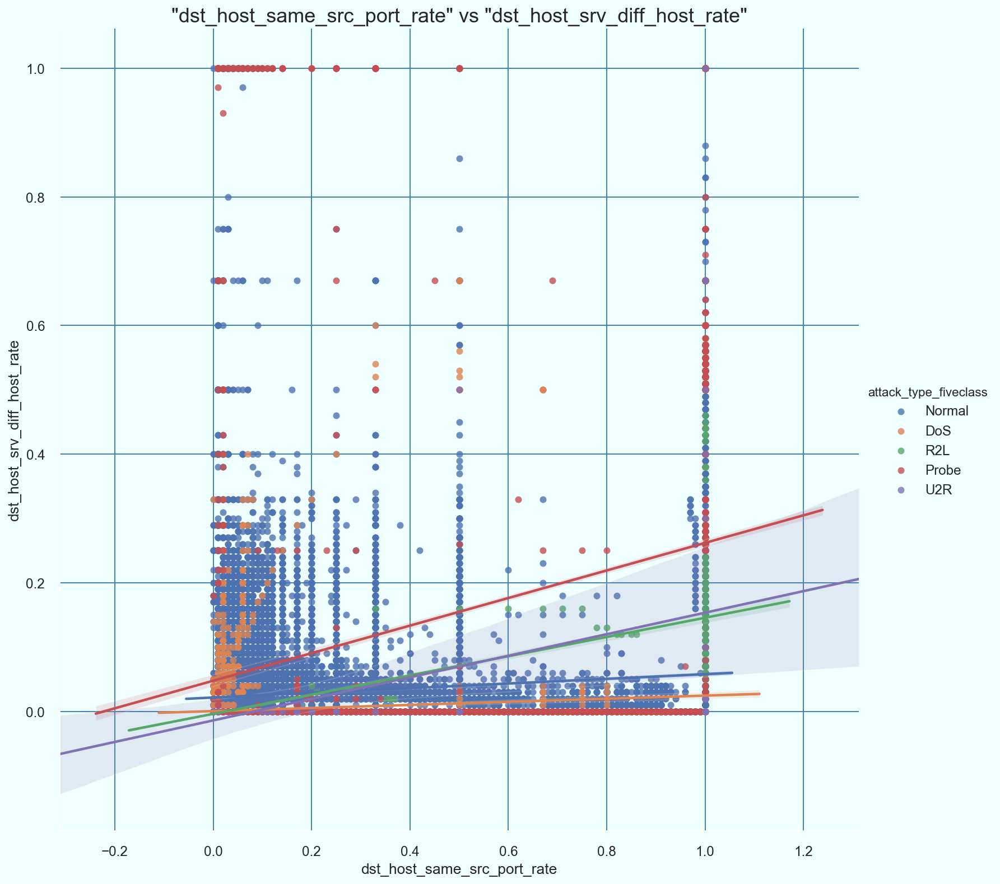

In [85]:
sns.lmplot(x='dst_host_same_src_port_rate',
           y='dst_host_srv_diff_host_rate', hue='attack_type_fiveclass'
           , data=dataset_network_train, height=11)
plt.title('"dst_host_same_src_port_rate" vs "dst_host_srv_diff_host_rate"'
          , fontsize=18)
plt.show()

### Key Observations
- dst_host_same_src_port_rate has slight effect on the intrusion type.
- for "dst_host_same_src_port_rate" value greater than equal to 1 it can be "probe" and "r2l""

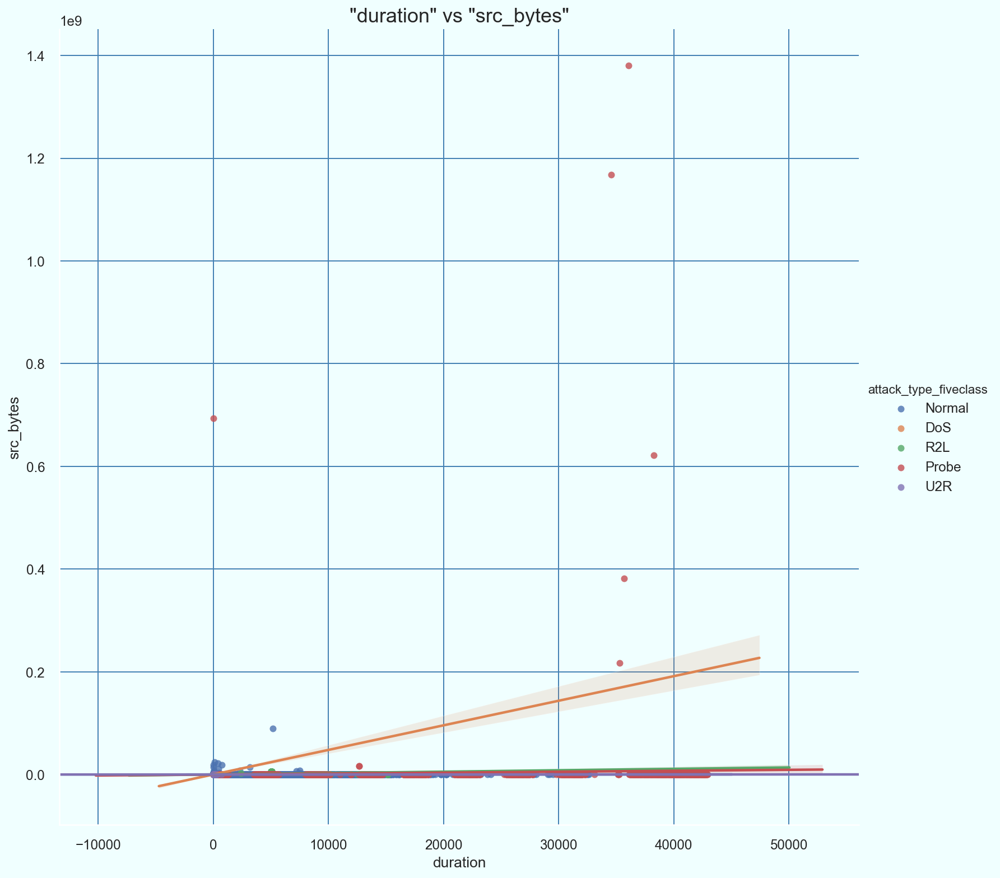

In [86]:
sns.lmplot(x='duration', y='src_bytes', hue='attack_type_fiveclass',
           data=dataset_network_train, height=11)
plt.title('"duration" vs "src_bytes"', fontsize=18)
plt.show()

### Key Observations
- For duration Greater than 30000 we can see it's 'probe', therefore duration itself is a strong predictor.

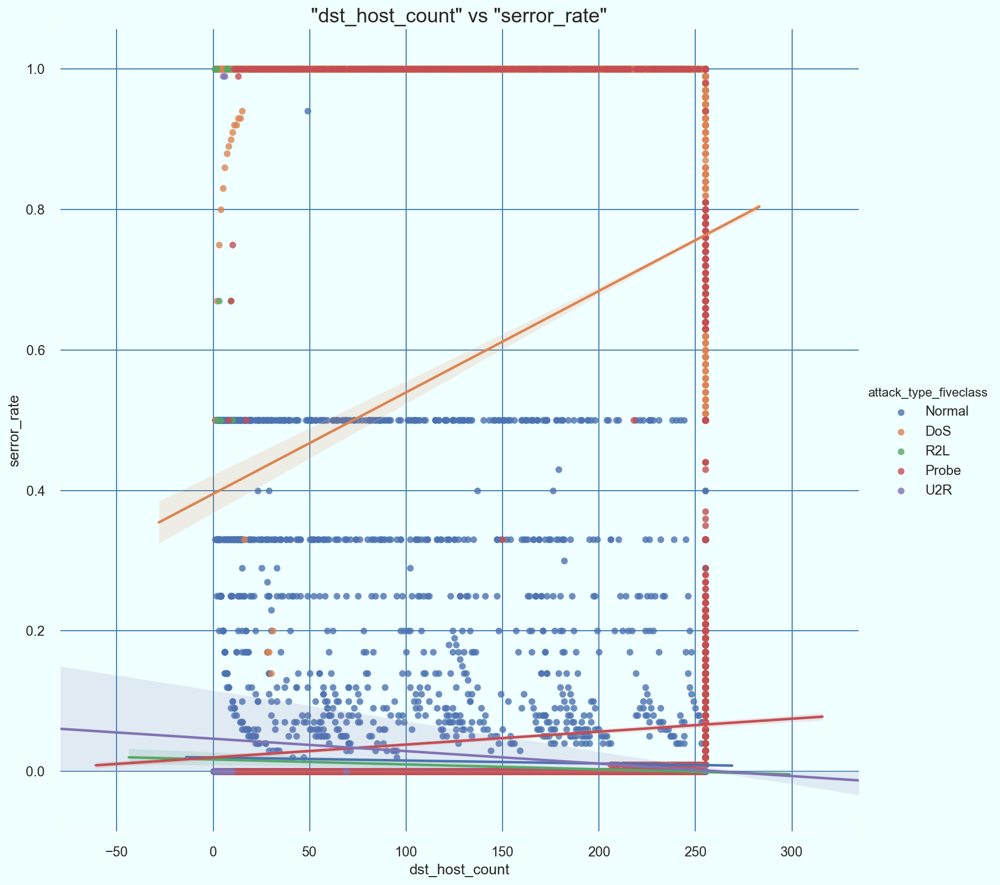

In [87]:
sns.lmplot(x='dst_host_count', y='serror_rate',
           hue='attack_type_fiveclass', data=dataset_network_train,
           height=11)
plt.title('"dst_host_count" vs "serror_rate"', fontsize=18)
plt.show()

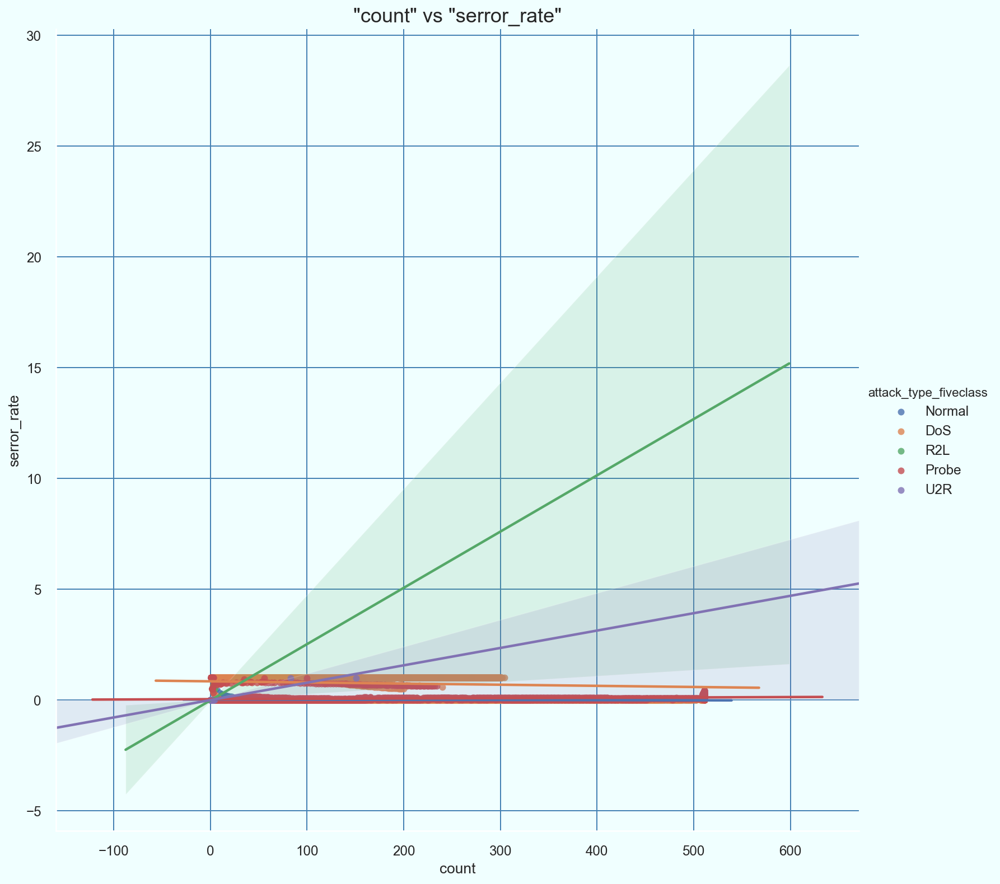

In [88]:
sns.lmplot(x='count', y='serror_rate', hue='attack_type_fiveclass',
           data=dataset_network_train, height=11)
plt.title('"count" vs "serror_rate"', fontsize=18)
plt.show()

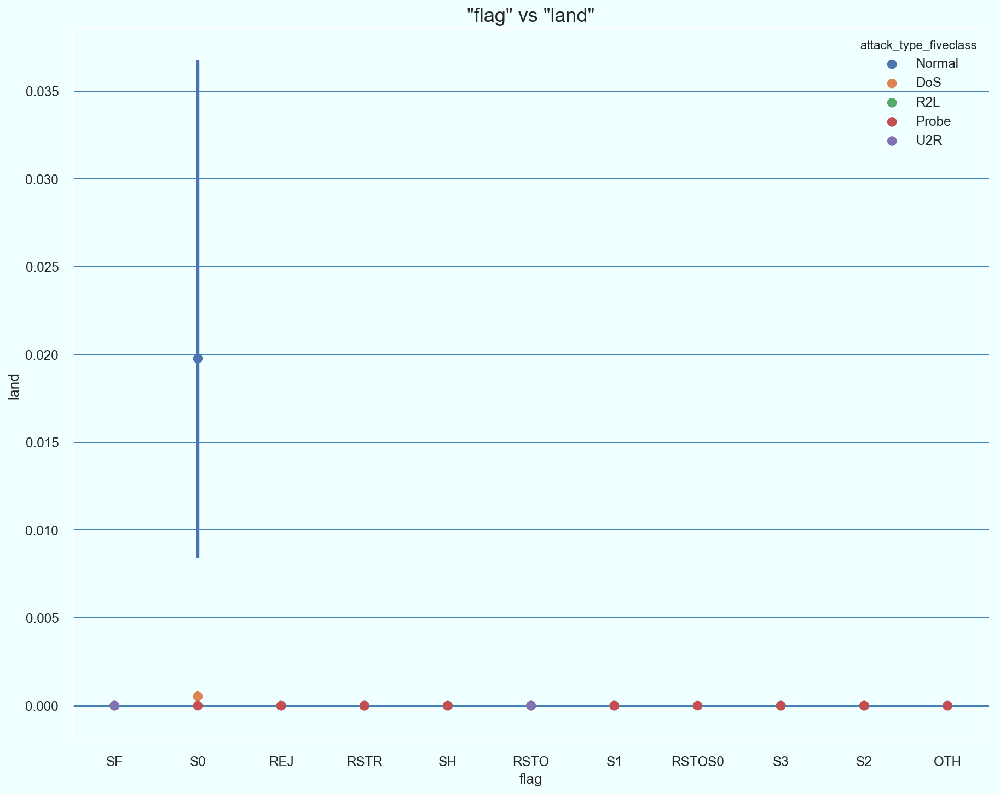

In [89]:
sns.pointplot(x='flag', y='land', hue='attack_type_fiveclass',
              data=dataset_network_train, join=False)
plt.title('"flag" vs "land"', fontsize=18)
plt.show()

### Key Observations
- No such clear identification

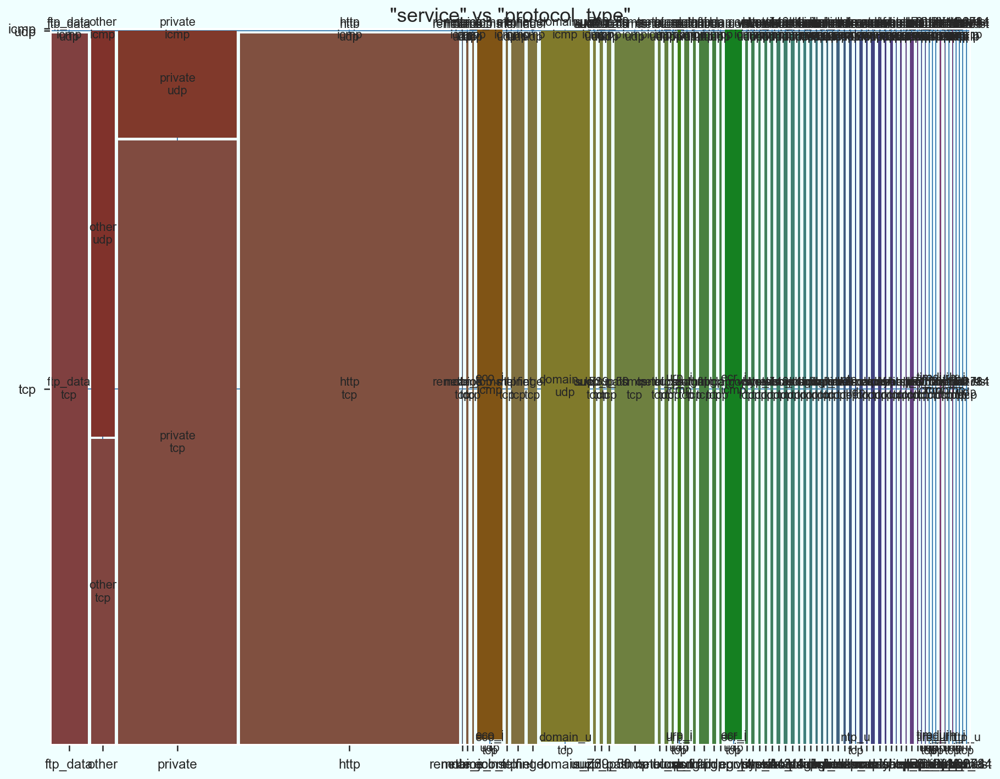

In [90]:
mosaic(dataset_network_train, ['service', 'protocol_type']);
plt.title('"service" vs "protocol_type"', fontsize=18)
plt.show()

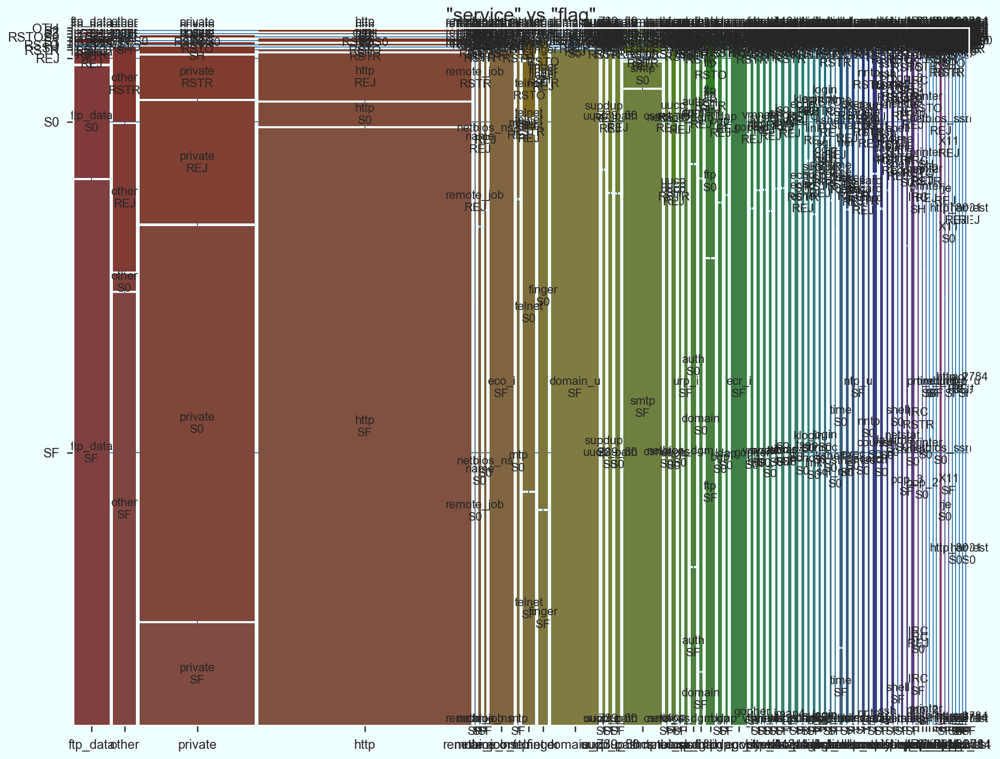

In [91]:
mosaic(dataset_network_train, ['service', 'flag']);
plt.title('"service" vs "flag"', fontsize=18)
plt.show()

## Handling Nominal Features

In [92]:
unique_protocol_type = pd.concat([dataset_network_train.protocol_type,
                                 dataset_network_test.protocol_type],
                                 ignore_index=True).unique().ravel()
unique_service = pd.concat([dataset_network_train.service,
                           dataset_network_test.service],
                           ignore_index=True).unique().ravel()
unique_flag = pd.concat([dataset_network_train.flag,
                        dataset_network_test.flag],
                        ignore_index=True).unique().ravel()
print(unique_protocol_type)
print(unique_service)
print(unique_flag)

['tcp' 'udp' 'icmp']
['ftp_data' 'other' 'private' 'http' 'remote_job' 'name' 'netbios_ns'
 'eco_i' 'mtp' 'telnet' 'finger' 'domain_u' 'supdup' 'uucp_path' 'Z39_50'
 'smtp' 'csnet_ns' 'uucp' 'netbios_dgm' 'urp_i' 'auth' 'domain' 'ftp'
 'bgp' 'ldap' 'ecr_i' 'gopher' 'vmnet' 'systat' 'http_443' 'efs' 'whois'
 'imap4' 'iso_tsap' 'echo' 'klogin' 'link' 'sunrpc' 'login' 'kshell'
 'sql_net' 'time' 'hostnames' 'exec' 'ntp_u' 'discard' 'nntp' 'courier'
 'ctf' 'ssh' 'daytime' 'shell' 'netstat' 'pop_3' 'nnsp' 'IRC' 'pop_2'
 'printer' 'tim_i' 'pm_dump' 'red_i' 'netbios_ssn' 'rje' 'X11' 'urh_i'
 'http_8001' 'aol' 'http_2784' 'tftp_u' 'harvest']
['SF' 'S0' 'REJ' 'RSTR' 'SH' 'RSTO' 'S1' 'RSTOS0' 'S3' 'S2' 'OTH']


In [93]:
def protocolTypeNumConverter(protocol_type):
    if protocol_type == 'tcp' :
        return 0
    elif protocol_type == 'udp' :
        return 1
    elif protocol_type == 'icmp' :
        return 2
    
def flagNumConverter(flag):
    if flag == 'SF' :
        return 0
    elif flag == 'S0' :
        return 1
    elif flag == 'REJ' :
        return 2
    elif flag == 'RSTR' :
        return 3
    elif flag == 'SH' :
        return 4
    elif flag == 'RSTO' :
        return 5
    elif flag == 'S1' :
        return 6
    elif flag == 'RSTOS0' :
        return 7
    elif flag == 'S3' :
        return 8
    elif flag == 'S2' :
        return 9
    elif flag == 'OTH' :
        return 10

In [94]:
serviceNumConverter = {
    'ftp_data': 0,
    'other': 1,
    'private': 2,
    'http': 3,
    'remote_job': 4,
    'name': 5,
    'netbios_ns': 6,
    'eco_i': 7,
    'mtp': 8,
    'telnet': 9,
    'finger': 10,
    'domain_u': 11,
    'supdup': 12,
    'uucp_path': 13,
    'Z39_50': 14,
    'smtp': 15,
    'csnet_ns': 16,
    'uucp': 17,
    'netbios_dgm': 18,
    'urp_i': 19,
    'auth': 20,
    'domain': 21,
    'ftp': 22,
    'bgp': 23,
    'ldap': 24,
    'ecr_i': 25,
    'gopher': 26,
    'vmnet': 27,
    'systat': 28,
    'http_443': 29,
    'efs': 30,
    'whois': 31,
    'imap4': 32,
    'iso_tsap': 33,
    'echo': 34,
    'klogin': 35,
    'link': 36,
    'sunrpc': 37,
    'login': 38,
    'kshell': 39,
    'sql_net': 40,
    'time': 41,
    'hostnames': 42,
    'exec': 43,
    'ntp_u': 44,
    'discard': 45,
    'nntp': 46,
    'courier': 47,
    'ctf': 48,
    'ssh': 49,
    'daytime': 50,
    'shell': 51,
    'netstat': 52,
    'pop_3': 53,
    'nnsp': 54,
    'IRC': 55,
    'pop_2': 56,
    'printer': 57,
    'tim_i': 58,
    'pm_dump': 59,
    'red_i': 60,
    'netbios_ssn': 61,
    'rje': 62,
    'X11': 63,
    'urh_i': 64,
    'http_8001': 65,
    'aol': 66,
    'http_2784': 67,
    'tftp_u': 68,
    'harvest': 69,
    }

In [95]:
dataset_network_train['protocol_type'] = \
    dataset_network_train['protocol_type'
                          ].apply(protocolTypeNumConverter)
dataset_network_test['protocol_type'] = \
    dataset_network_test['protocol_type'
                         ].apply(protocolTypeNumConverter)

In [96]:
dataset_network_train.flag = \
    dataset_network_train.flag.apply(flagNumConverter)
dataset_network_test.flag = \
    dataset_network_test.flag.apply(flagNumConverter)

In [97]:
dataset_network_train.service = [serviceNumConverter[item] for item in
                                 dataset_network_train.service]
dataset_network_test.service = [serviceNumConverter[item] for item in
                                dataset_network_test.service]

# Using map() function
# dataset_network_train['service'] = dataset_network_train['service'].map(serviceNumConverter).astype(int)
# dataset_network_test['service'] = dataset_network_test['service'].map(serviceNumConverter).astype(int)

## Seperate data and target features

In [98]:
X_train = dataset_network_train.drop(['attack_type',
        'attack_type_twoclass', 'attack_type_twoclass_num',
        'attack_type_fiveclass', 'attack_type_fiveclass_num'], axis=1)
y_train = dataset_network_train['attack_type_twoclass_num']
z_train = dataset_network_train['attack_type_fiveclass_num']

X_test = dataset_network_test.drop(['attack_type',
                                   'attack_type_twoclass',
                                   'attack_type_twoclass_num',
                                   'attack_type_fiveclass',
                                   'attack_type_fiveclass_num'], axis=1)
y_test = dataset_network_test['attack_type_twoclass_num']
z_test = dataset_network_test['attack_type_fiveclass_num']

## Remove Columns with Zero Standard

In [99]:
columnsWithZeroStdToRemove = getZeroStdColumns(X_train)
print(f'Columns with Zero STD to drop from Train and Test dataset(s) are {columnsWithZeroStdToRemove}.')
X_train.drop(columnsWithZeroStdToRemove, axis=1, inplace=True)
X_test.drop(columnsWithZeroStdToRemove, axis=1, inplace=True)

Columns with Zero STD to drop from Train and Test dataset(s) are ['num_outbound_cmds'].


## Examin the shape of data and target variables after feature engineering

In [100]:
(X_train.shape, y_train.shape, z_train.shape)

((125973, 36), (125973,), (125973,))

In [101]:
(X_test.shape, y_test.shape, z_test.shape)

((22544, 36), (22544,), (22544,))

## The Elbow Method Plot - understand the possible no(s) of cluster(s) of dataset

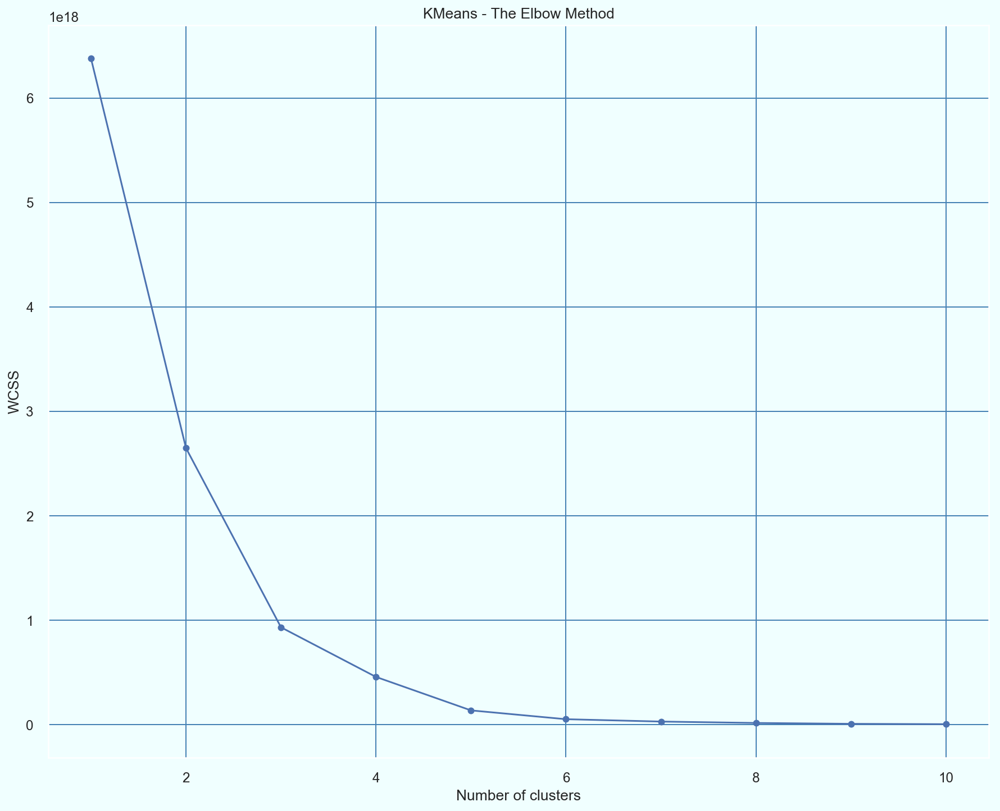

In [102]:
onetoten = [i for i in range(1,11)]
wcss = []
for i in onetoten:
    kmeans = KMeans(n_clusters = i, init = 'k-means++')
    kmeans.fit_predict(X_train)
    wcss.append(kmeans.inertia_)

# The Elbow Method Plot using Plotly
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
# data = [go.Scatter(x = onetoten, y = wcss, mode='lines+markers',
#                    marker = dict(symbol = 'circle',),
#                   )
#        ]
# layout = getPlotlyLayout('KMeans - The Elbow Method','Number of clusters','WCSS')
# figure = dict(data = data, layout = layout)
# py.iplot(figure)

# The Elbow Method Plot using matplotlib
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
plt.plot(range(1, 11), wcss, marker='o')
plt.title('KMeans - The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

### Key Observations
- Can see from the above graph that dataset is distributed in 2 cluster minimum.
- Can see from the above graph that dataset is distributed in 5 cluster maximun.
- Can see that after 5 possible clusters, the line is flat so dataset can't divied futher into clusters. Thus dataset can have minimum possible 2 clusters and maximum possible 5 clusters.

In [103]:
# scaler = StandardScaler()
# X_train_scaled = scaler.fit_transform(X_train)
# X_test_scaled = scaler.fit_transform(X_test)

# X_train = pd.DataFrame(X_train_scaled)
# X_test = pd.DataFrame(X_test_scaled)

### Key Observations
- Applied "StandardScaler" as well as "MinMaxScaler" but overall prediction accuracy doesn't have any effect and remains same. So continue to use normal data rather than using scaled dataset.

# Modelling

In [104]:
n_cpus_avaliable = multiprocessing.cpu_count()

print(f'We\'ve got {n_cpus_avaliable} cpus to work with.')

We've got 4 cpus to work with.


## **Binomial Classification:** Activity is normal or attack

### **Binomial Classification:** Using NN Keras Classifier

#### Perform Classification

In [105]:
#earlyStopping = EarlyStopping(monitor='val_binary_accuracy', patience=1, verbose=0, mode='max')

kerasnn_model = Sequential()
kerasnn_model.add(Dense(32, input_shape=(X_train.shape[1], ), activation='relu',
          kernel_regularizer=regularizers.l2(0.01),
          ))
kerasnn_model.add(Dropout(0.25))
kerasnn_model.add(BatchNormalization())
kerasnn_model.add(Dense(64, activation='relu',
          kernel_regularizer=regularizers.l2(0.01),
          ))
kerasnn_model.add(GaussianNoise(0.1))
kerasnn_model.add(Dense(128, activation='relu',
          kernel_regularizer=regularizers.l2(0.01),
          ))
kerasnn_model.add(Dropout(0.25))
kerasnn_model.add(BatchNormalization())
kerasnn_model.add(Dense(128, activation='relu',
          kernel_regularizer=regularizers.l2(0.01),
          ))
kerasnn_model.add(GaussianNoise(0.1))
kerasnn_model.add(Dense(64, activation='relu',
          kernel_regularizer=regularizers.l2(0.01),
          ))
kerasnn_model.add(Dropout(0.25))
kerasnn_model.add(BatchNormalization())
kerasnn_model.add(Dense(32, activation='relu',
          kernel_regularizer=regularizers.l2(0.01),
          ))
kerasnn_model.add(Dense(1, activation='sigmoid'))
kerasnn_model.summary()

kerasnn_model.compile(loss="binary_crossentropy", optimizer="adam", metrics=['binary_accuracy'])
#kerasnn_model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=9, callbacks=[earlyStopping], shuffle=True, verbose=1)
kerasnn_model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=5, shuffle=True, verbose=0)
kerasnn_model.evaluate(X_test, y_test)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 32)                1184      
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 32)                128       
_________________________________________________________________
dense_2 (Dense)              (None, 64)                2112      
_________________________________________________________________
gaussian_noise_1 (GaussianNo (None, 64)                0         
_________________________________________________________________
dense_3 (Dense)      

[0.9052926397137476, 0.7120741660752307]

The accuracy score of the Keras NN (Two Class) model is: 71.20741660752307%


              precision    recall  f1-score   support

           0       0.61      0.93      0.74      9711
           1       0.91      0.55      0.68     12833

   micro avg       0.71      0.71      0.71     22544
   macro avg       0.76      0.74      0.71     22544
weighted avg       0.78      0.71      0.71     22544





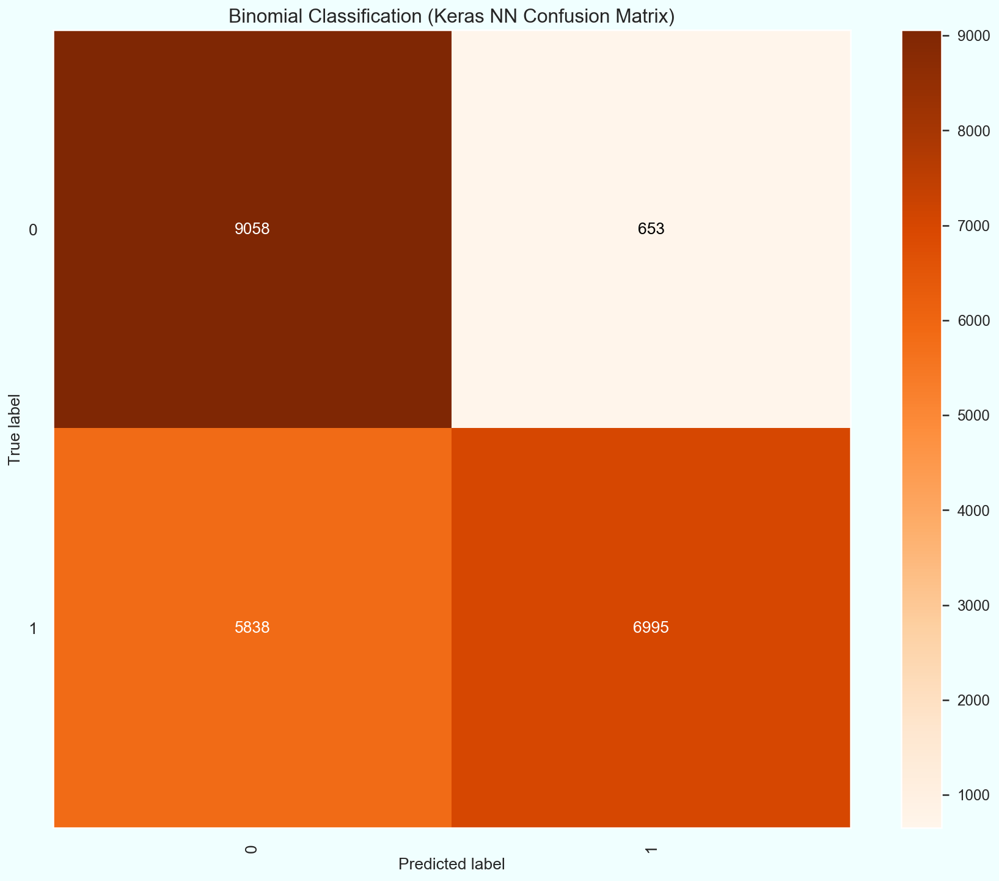

In [106]:
# Predicting the Test set results
y_pred = kerasnn_model.predict_classes(X_test)
y_pred_proba = kerasnn_model.predict_proba(X_test)

ac = accuracy_score(y_test, y_pred)
print('The accuracy score of the Keras NN (Two Class) model is: {}%'.format(ac
        * 100))
print('\n')

cr = classification_report(y_test, y_pred)
print(cr)
print('\n')

skplt.metrics.plot_confusion_matrix(y_test, y_pred,
                                    title='Binomial Classification (Keras NN Confusion Matrix)'
                                    , x_tick_rotation=90, cmap='Oranges'
                                    );

### **Binomial Classification:** Using LightGBM Classifier

#### Perform Classification

In [107]:
def lgbm_status_print_twoclass(optimal_result):
    all_models = pd.DataFrame(lgbm_bayes_cv_tuner_twoclass.cv_results_)
    best_params = pd.Series(lgbm_bayes_cv_tuner_twoclass.best_params_)
    print('Model #{}\nBest ROC-AUC: {}\nBest params: {}\n'.format(len(all_models),
            np.round(lgbm_bayes_cv_tuner_twoclass.best_score_, 4),
            lgbm_bayes_cv_tuner_twoclass.best_params_)
         )


lgbm_bayes_cv_tuner_twoclass = BayesSearchCV(
    estimator=lgbm.LGBMClassifier(n_jobs=n_cpus_avaliable,
                                  objective='binary',
                                  metric='binary_logloss',
                                  class_weight='balanced',
                                  silent=True),
    search_spaces={
        'boosting_type': ['gbdt', 'dart', 'rf'],
        'num_leaves': (1, 50),
        'max_depth': (1, 25),
        'learning_rate': (0.01, 1.0, 'log-uniform'),
        'n_estimators': (100, 300),
        'min_split_gain': (0.01, 1.0, 'uniform'),
        'min_child_weight': (0.01, 1.0, 'uniform'),
        'min_child_samples': (1, 50),
        'subsample': (0.01, 1.0, 'uniform'),
        'subsample_freq': (1, 50),
        'colsample_bytree': (0.01, 1.0, 'uniform'),
        'reg_lambda': (1e-9, 1000, 'log-uniform'),
        'bagging_fraction': (0.01, 1.0, 'uniform'),
        'feature_fraction': (0.01, 1.0, 'uniform'),
        },
    scoring='roc_auc',
    cv=StratifiedKFold(n_splits=9, shuffle=True),
    n_jobs=n_cpus_avaliable,
    n_iter=5,
    refit=True,
    verbose=0,
    )


lgbm_result_twoclass = lgbm_bayes_cv_tuner_twoclass.fit(X_train, y_train,
        callback=lgbm_status_print_twoclass)

lgbm_twoclass_model = lgbm_result_twoclass.best_estimator_

print(lgbm_twoclass_model)

Model #1
Best ROC-AUC: 1.0
Best params: {'bagging_fraction': 0.6763361685130609, 'boosting_type': 'gbdt', 'colsample_bytree': 0.11688537090149818, 'feature_fraction': 0.9092296667254578, 'learning_rate': 0.02705915672082682, 'max_depth': 19, 'min_child_samples': 49, 'min_child_weight': 0.3909932699621439, 'min_split_gain': 0.7838364334990557, 'n_estimators': 210, 'num_leaves': 40, 'reg_lambda': 0.1376853048221502, 'subsample': 0.4881428682426217, 'subsample_freq': 7}

Model #2
Best ROC-AUC: 1.0
Best params: {'bagging_fraction': 0.6763361685130609, 'boosting_type': 'gbdt', 'colsample_bytree': 0.11688537090149818, 'feature_fraction': 0.9092296667254578, 'learning_rate': 0.02705915672082682, 'max_depth': 19, 'min_child_samples': 49, 'min_child_weight': 0.3909932699621439, 'min_split_gain': 0.7838364334990557, 'n_estimators': 210, 'num_leaves': 40, 'reg_lambda': 0.1376853048221502, 'subsample': 0.4881428682426217, 'subsample_freq': 7}

Model #3
Best ROC-AUC: 1.0
Best params: {'bagging_frac

The accuracy score of the LightGBM (Two Class) model is: 81.65809084457062%


              precision    recall  f1-score   support

           0       0.71      0.97      0.82      9711
           1       0.97      0.70      0.81     12833

   micro avg       0.82      0.82      0.82     22544
   macro avg       0.84      0.84      0.82     22544
weighted avg       0.86      0.82      0.82     22544









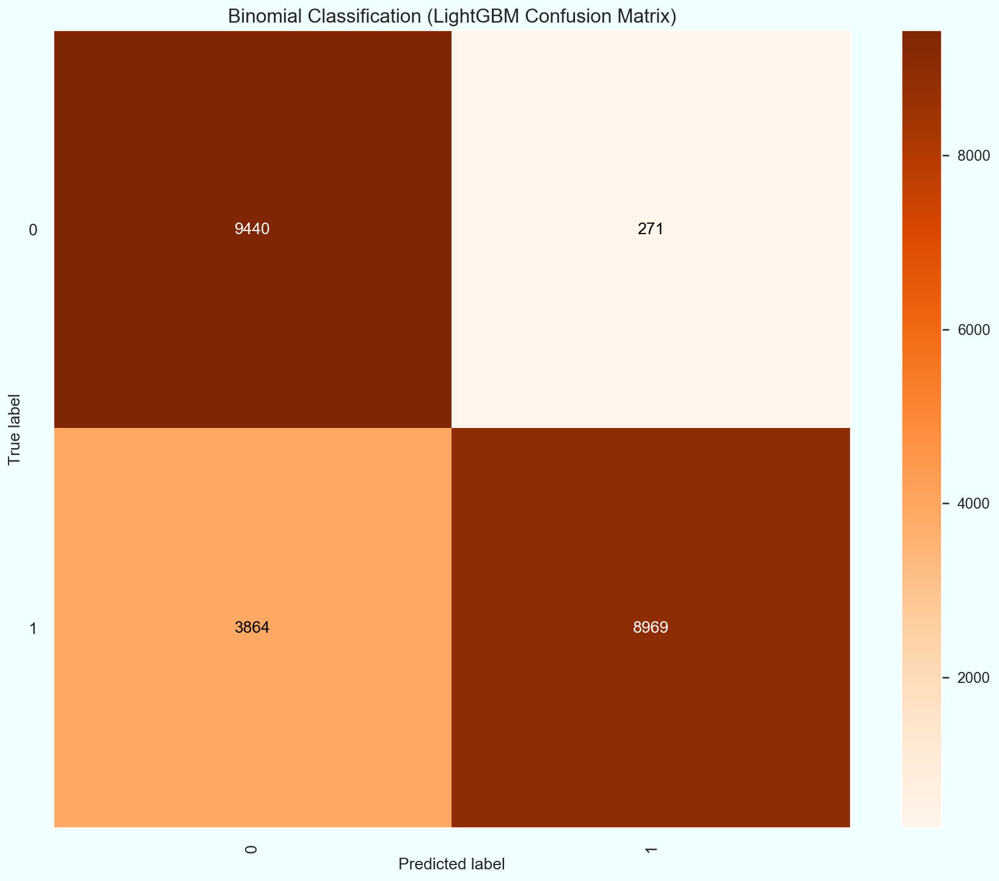

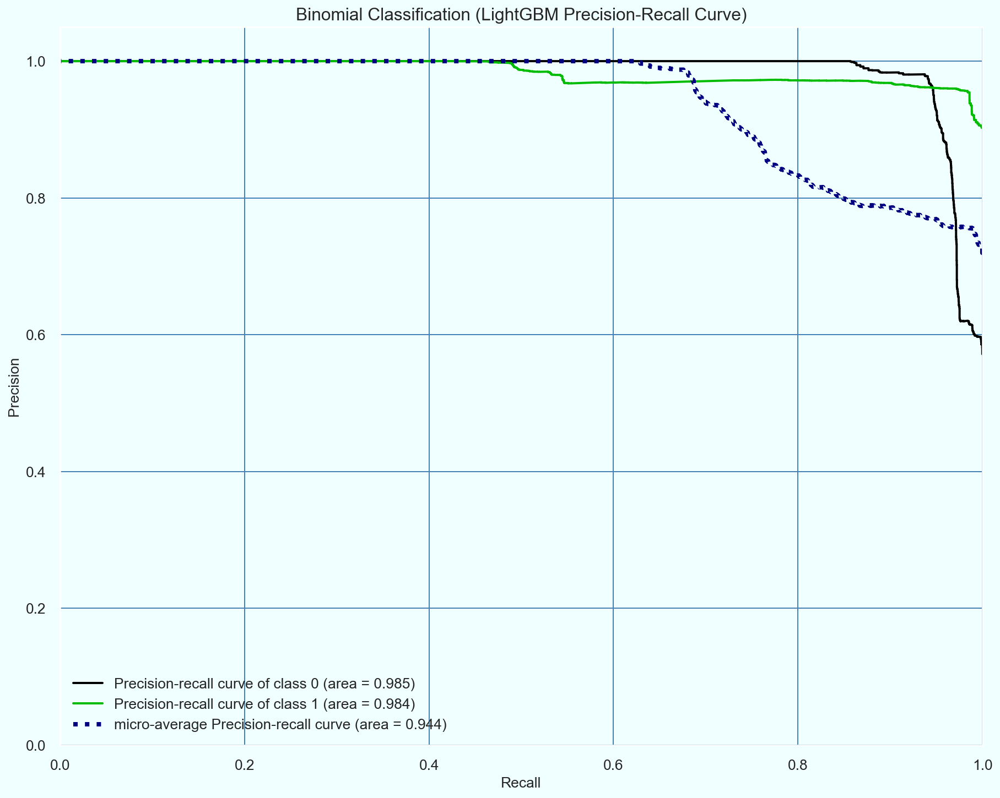

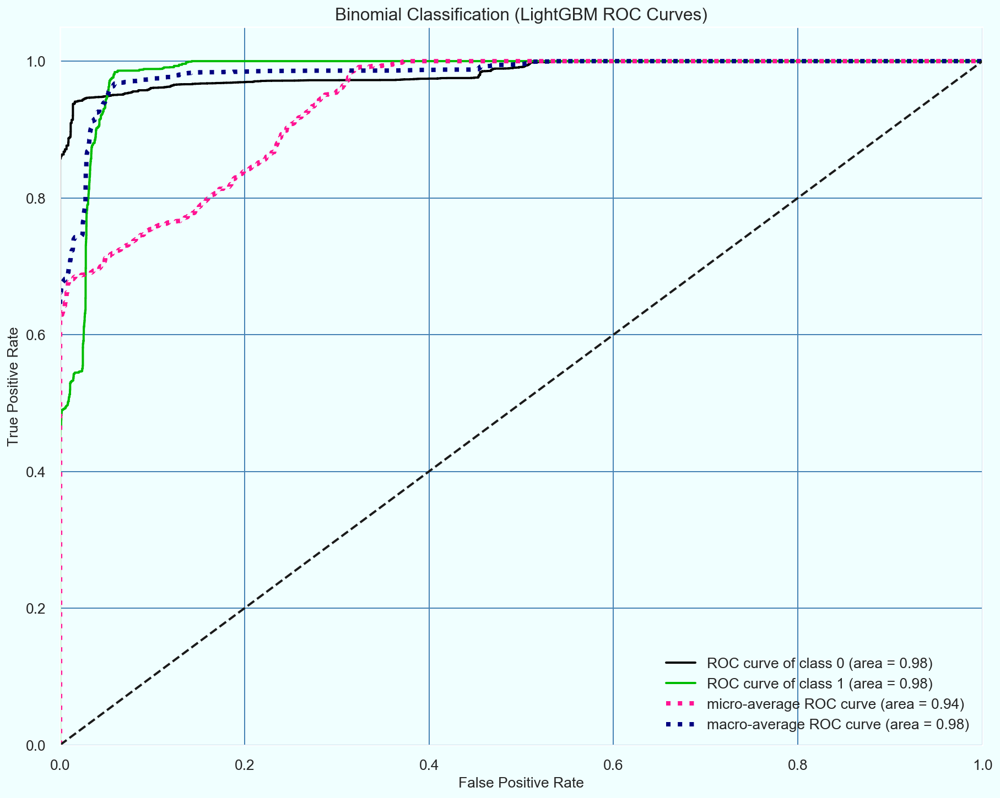

In [108]:
# Predicting the Test set results
y_pred = lgbm_twoclass_model.predict(X_test)
y_pred_proba = lgbm_twoclass_model.predict_proba(X_test)

ac = accuracy_score(y_test, y_pred)
print('The accuracy score of the LightGBM (Two Class) model is: {}%'.format(ac * 100))
print('\n')

cr = classification_report(y_test, y_pred)
print(cr)
print('\n')

skplt.metrics.plot_confusion_matrix(y_test, y_pred, title='Binomial Classification (LightGBM Confusion Matrix)',
                                    x_tick_rotation=90, 
                                    cmap='Oranges',
                                   );
print('\n')

skplt.metrics.plot_precision_recall(y_test, y_pred_proba,
                                    title='Binomial Classification (LightGBM Precision-Recall Curve)',
                                   );
print('\n')

skplt.metrics.plot_roc(y_test, y_pred_proba,
                       title='Binomial Classification (LightGBM ROC Curves)',
                      );

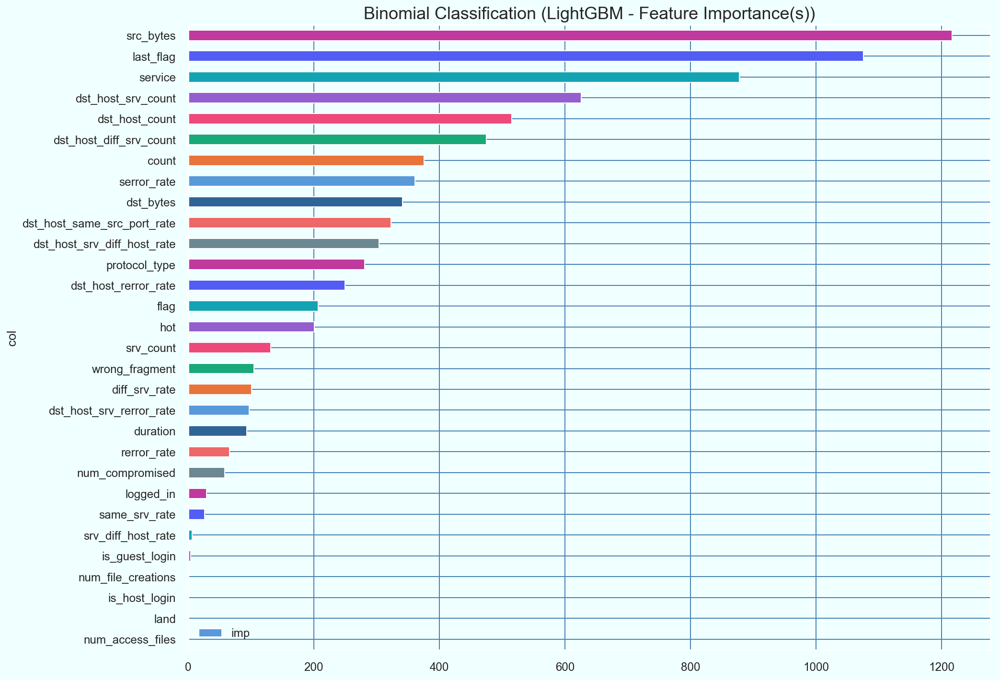

In [109]:
feature_importance = pd.DataFrame({'imp': lgbm_twoclass_model.feature_importances_, 'col': X_train.columns})
feature_importance = feature_importance.sort_values(['imp', 'col'], ascending=[True, False]).iloc[-30:]
feature_importance.plot(kind='barh', x='col', y='imp', color=belize_light_flavor);
plt.title('Binomial Classification (LightGBM - Feature Importance(s))', fontsize=18)
plt.show()

### **Binomial Classification:** Using LightGBM Classifier (Hyperopt)

#### Perform Classification

In [110]:
def lgbmc_objective(params):
    params = {
        'num_leaves': int(params['num_leaves']),
        'max_depth': int(params['max_depth']),
        'n_estimators': int(params['n_estimators']),
        'min_child_samples': int(params['min_child_samples']),
        'subsample_freq': int(params['min_child_samples']),
        }
    lgbmClassifier = lgbm.LGBMClassifier(
        n_jobs=n_cpus_avaliable,
        objective='binary',
        metric='binary_logloss',
        class_weight='balanced',
        silent=True,
        **params
        )

    # if the estimator is a classifier and y is either binary or multiclass, StratifiedKFold is used. In all other cases, KFold is used.
    lgbmcScore = cross_val_score(lgbmClassifier, X_train, y_train,
                                 cv=StratifiedKFold(n_splits=9,
                                 shuffle=True),
                                 n_jobs=n_cpus_avaliable).mean()

    # print('LGBM-Classifier Score: {:.4f}, Parameters are: {}'.format(lgbmcScore, params))

    return lgbmcScore


lgbmc_space = {
    'num_leaves': hp.quniform('num_leaves', 1, 50, 1),
    'max_depth': hp.quniform('max_depth', 1, 25, 1),
    'learning_rate': hp.qloguniform('learning_rate', 0.01, 1.0, 0.01),
    'n_estimators': hp.quniform('n_estimators', 100, 300, 2),
    'min_split_gain': hp.quniform('min_split_gain', 0.01, 1.0, 0.01),
    'min_child_weight': hp.quniform('min_child_weight', 0.01, 1.0,
                                    0.01),
    'min_child_samples': hp.quniform('min_child_samples', 1, 50, 1),
    'subsample': hp.quniform('subsample', 0.01, 1.0, 0.01),
    'subsample_freq': hp.quniform('subsample_freq', 1, 50, 1),
    'colsample_bytree': hp.quniform('colsample_bytree', 0.01, 1.0,
                                    0.01),
    'reg_lambda': hp.qloguniform('reg_lambda', 1e-5, 1000, 0.01),
    'bagging_fraction': hp.quniform('bagging_fraction', 0.01, 1.0,
                                    0.01),
    'feature_fraction': hp.quniform('feature_fraction', 0.01, 1.0,
                                    0.01),
    }

trials = Trials()
lgbmc_best = fmin(fn=lgbmc_objective, space=lgbmc_space,
                  algo=tpe.suggest, max_evals=5, trials=trials)
print(trials.losses())
print('\n')
print(lgbmc_best)

100%|█████████████████████████████████████████████████████| 5/5 [01:45<00:00, 21.90s/it, best loss: 0.9978725565803903]
[0.9997301014605166, 0.9997380374010331, 0.9978725565803903, 0.9997300991920517, 0.9997062885348605]


{'bagging_fraction': 0.99, 'colsample_bytree': 0.12, 'feature_fraction': 0.97, 'learning_rate': 1.08, 'max_depth': 15.0, 'min_child_samples': 7.0, 'min_child_weight': 0.17, 'min_split_gain': 0.8, 'n_estimators': 198.0, 'num_leaves': 4.0, 'reg_lambda': 9.65372172083582e+278, 'subsample': 0.99, 'subsample_freq': 42.0}


In [111]:
space_eval(lgbmc_space, lgbmc_best)

{'bagging_fraction': 0.99,
 'colsample_bytree': 0.12,
 'feature_fraction': 0.97,
 'learning_rate': 1.08,
 'max_depth': 15.0,
 'min_child_samples': 7.0,
 'min_child_weight': 0.17,
 'min_split_gain': 0.8,
 'n_estimators': 198.0,
 'num_leaves': 4.0,
 'reg_lambda': 9.65372172083582e+278,
 'subsample': 0.99,
 'subsample_freq': 42.0}

In [112]:
lgbmc_best=convertIntFloatToInt(lgbmc_best)
lgbmc_best

{'bagging_fraction': 0.99,
 'colsample_bytree': 0.12,
 'feature_fraction': 0.97,
 'learning_rate': 1.08,
 'max_depth': 15,
 'min_child_samples': 7,
 'min_child_weight': 0.17,
 'min_split_gain': 0.8,
 'n_estimators': 198,
 'num_leaves': 4,
 'reg_lambda': 965372172083582007249492690433075575091750765555454162667964502135168998401995103106428141968661275984601645043306707549553276620505422665538738270654595013945621428111242228307612344072448490030973610953958407595415275967202288365230868807817002616798920902889445783578546798592,
 'subsample': 0.99,
 'subsample_freq': 42}

The accuracy score of the LightGBM Hyperopt (Two Class) model is: 43.07576295244854%




C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.



              precision    recall  f1-score   support

           0       0.43      1.00      0.60      9711
           1       0.00      0.00      0.00     12833

   micro avg       0.43      0.43      0.43     22544
   macro avg       0.22      0.50      0.30     22544
weighted avg       0.19      0.43      0.26     22544









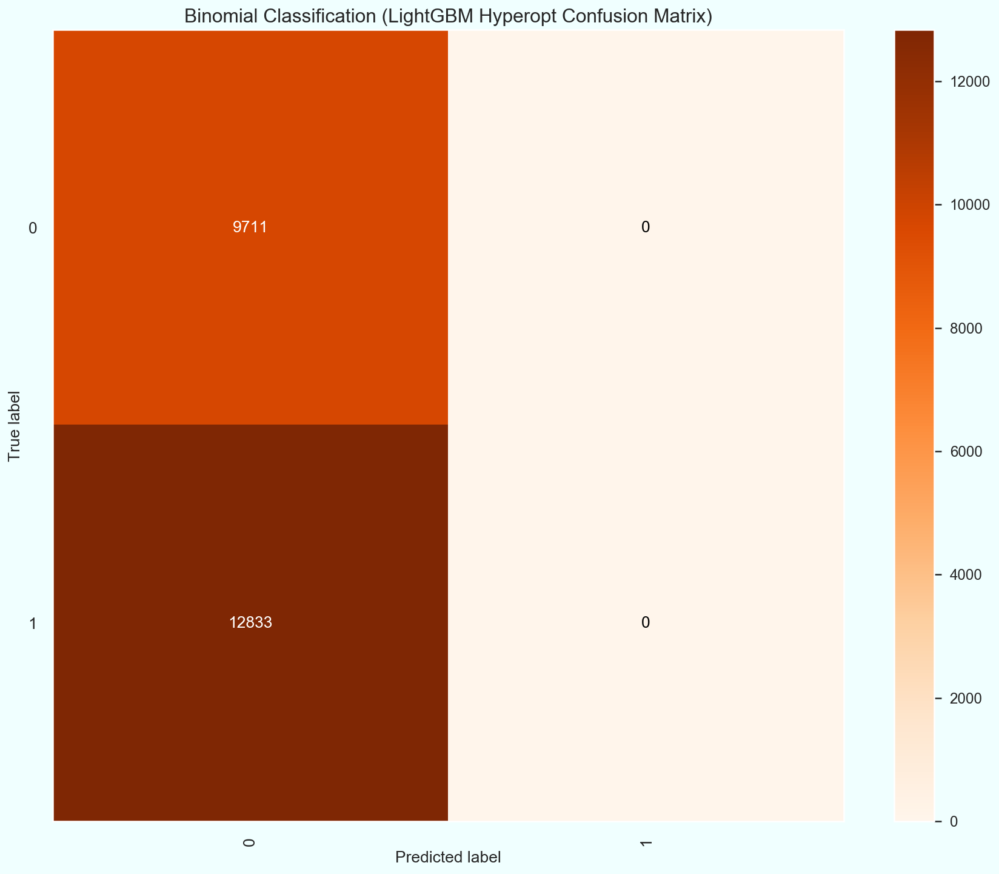

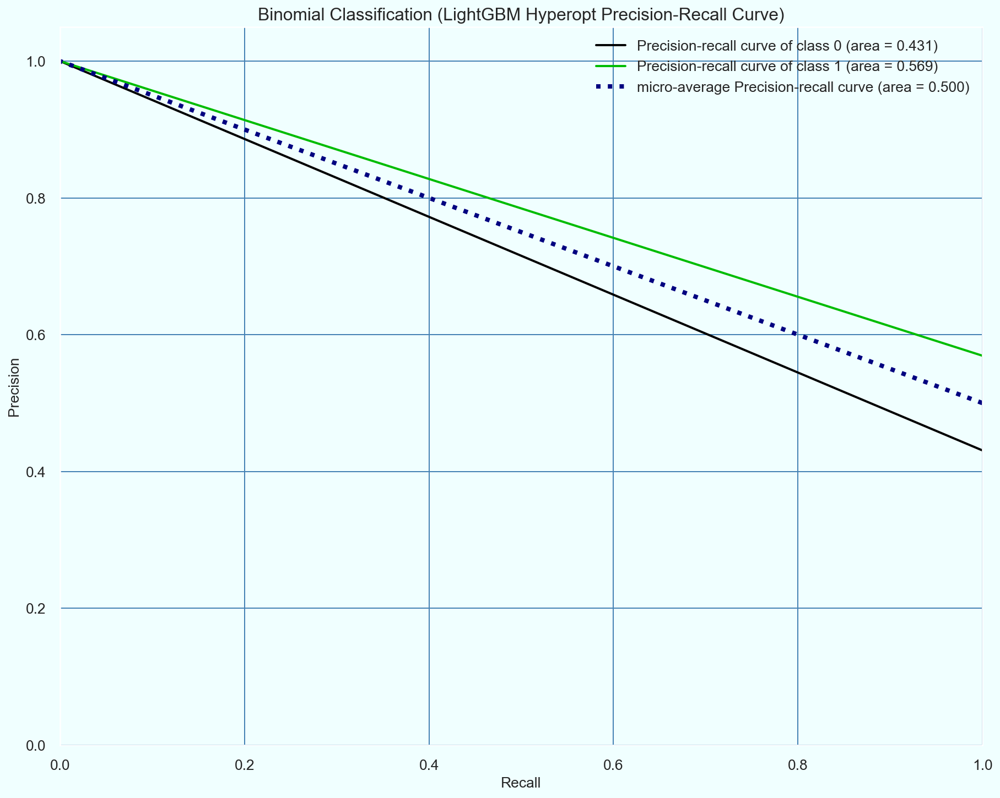

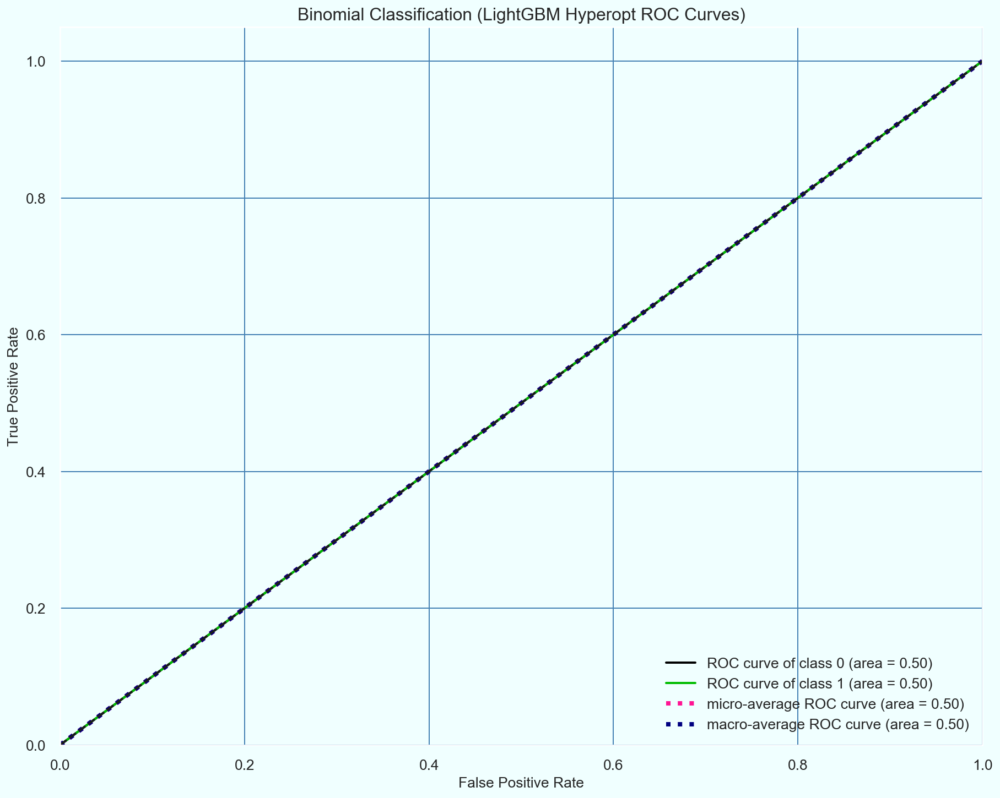

In [113]:
lgbmClassifierHyperopt = lgbm.LGBMClassifier(
        n_jobs=n_cpus_avaliable,
        objective='binary',
        metric='binary_logloss',
        class_weight='balanced',
        silent=True,
        **lgbmc_best
        )
lgbmClassifierHyperopt.fit(X_train, y_train)

# Predicting the Test set results
y_pred = lgbmClassifierHyperopt.predict(X_test)
y_pred_proba = lgbmClassifierHyperopt.predict_proba(X_test)

ac = accuracy_score(y_test, y_pred)
print('The accuracy score of the LightGBM Hyperopt (Two Class) model is: {}%'.format(ac * 100))
print('\n')

cr = classification_report(y_test, y_pred)
print(cr)
print('\n')

skplt.metrics.plot_confusion_matrix(y_test, y_pred, title='Binomial Classification (LightGBM Hyperopt Confusion Matrix)',
                                    x_tick_rotation=90, 
                                    cmap='Oranges',
                                   );
print('\n')

skplt.metrics.plot_precision_recall(y_test, y_pred_proba,
                                    title='Binomial Classification (LightGBM Hyperopt Precision-Recall Curve)',
                                   );
print('\n')

skplt.metrics.plot_roc(y_test, y_pred_proba,
                       title='Binomial Classification (LightGBM Hyperopt ROC Curves)',
                      );

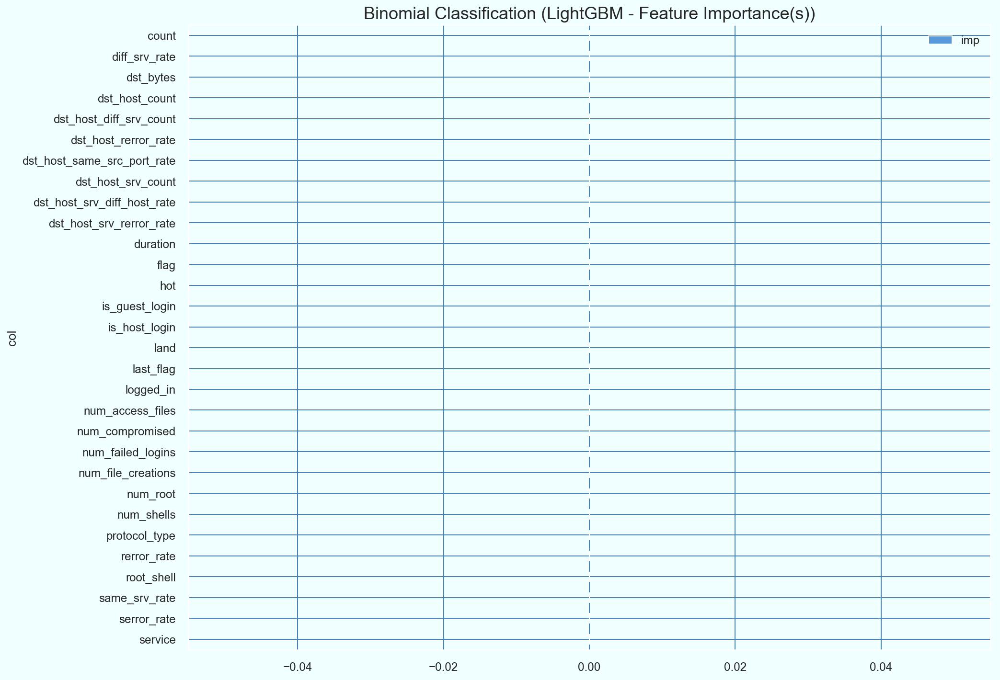

In [114]:
feature_importance = pd.DataFrame({'imp': lgbmClassifierHyperopt.feature_importances_, 'col': X_train.columns})
feature_importance = feature_importance.sort_values(['imp', 'col'], ascending=[True, False]).iloc[-30:]
feature_importance.plot(kind='barh', x='col', y='imp', color=belize_light_flavor);
plt.title('Binomial Classification (LightGBM - Feature Importance(s))', fontsize=18)
plt.show()

### **Binomial Classification:** Using XGBoost Classifier

#### Perform Classification

In [115]:
def status_print_twoclass(optimal_result):
    all_models = pd.DataFrame(bayes_cv_tuner_twoclass.cv_results_)
    best_params = pd.Series(bayes_cv_tuner_twoclass.best_params_)
    print('Model #{}\nBest ROC-AUC: {}\nBest params: {}\n'.format(len(all_models), 
            np.round(bayes_cv_tuner_twoclass.best_score_, 4), 
            bayes_cv_tuner_twoclass.best_params_)
         )


bayes_cv_tuner_twoclass = BayesSearchCV(
    estimator=xgb.XGBClassifier(
        n_jobs=n_cpus_avaliable,
        objective='binary:logistic',
        eval_metric='auc',
        silent=1,
        tree_method='approx',
        device='cpu',
        ),
    search_spaces={
        'booster': ['gbtree', 'dart'],
        'learning_rate': (0.01, 1.0, 'log-uniform'),
        'max_delta_step': (0, 20),
        'max_depth': (0, 25),
        'min_child_weight': (0, 10),
        'n_estimators': (100, 300),
        'subsample': (0.01, 1.0, 'uniform'),
        'colsample_bytree': (0.01, 1.0, 'uniform'),
        'colsample_bylevel': (0.01, 1.0, 'uniform'),
        'reg_lambda': (1e-9, 1000, 'log-uniform'),
        'gamma': (1e-9, 0.5, 'log-uniform'),
        'scale_pos_weight': (1e-6, 500, 'log-uniform'),
        },
    scoring='roc_auc',
    cv=StratifiedKFold(n_splits=9, shuffle=True),
    n_jobs=n_cpus_avaliable,
    n_iter=7,
    refit=True,
    verbose=0,
    )

result_twoclass = bayes_cv_tuner_twoclass.fit(X_train, y_train,
        callback=status_print_twoclass)

xgb_twoclass_model = result_twoclass.best_estimator_

print(xgb_twoclass_model)

Model #1
Best ROC-AUC: 0.987
Best params: {'booster': 'dart', 'colsample_bylevel': 0.5168026020527496, 'colsample_bytree': 0.5512855490191089, 'gamma': 0.23498516210735837, 'learning_rate': 0.029026949949969905, 'max_delta_step': 12, 'max_depth': 1, 'min_child_weight': 2, 'n_estimators': 116, 'reg_lambda': 0.009473812440859838, 'scale_pos_weight': 4.821037947653469, 'subsample': 0.041253633514046546}

Model #2
Best ROC-AUC: 1.0
Best params: {'booster': 'gbtree', 'colsample_bylevel': 0.7742671231359579, 'colsample_bytree': 0.641156321702667, 'gamma': 0.027455058133773455, 'learning_rate': 0.13207337025323213, 'max_delta_step': 19, 'max_depth': 13, 'min_child_weight': 2, 'n_estimators': 189, 'reg_lambda': 3.016771638452131e-06, 'scale_pos_weight': 257.4257611046447, 'subsample': 0.1883595592814563}

Model #3
Best ROC-AUC: 1.0
Best params: {'booster': 'gbtree', 'colsample_bylevel': 0.7742671231359579, 'colsample_bytree': 0.641156321702667, 'gamma': 0.027455058133773455, 'learning_rate': 0

The accuracy score of the XGBoost (Two Class) model is: 88.19641589779987%


              precision    recall  f1-score   support

           0       0.80      0.97      0.88      9711
           1       0.97      0.82      0.89     12833

   micro avg       0.88      0.88      0.88     22544
   macro avg       0.89      0.89      0.88     22544
weighted avg       0.90      0.88      0.88     22544









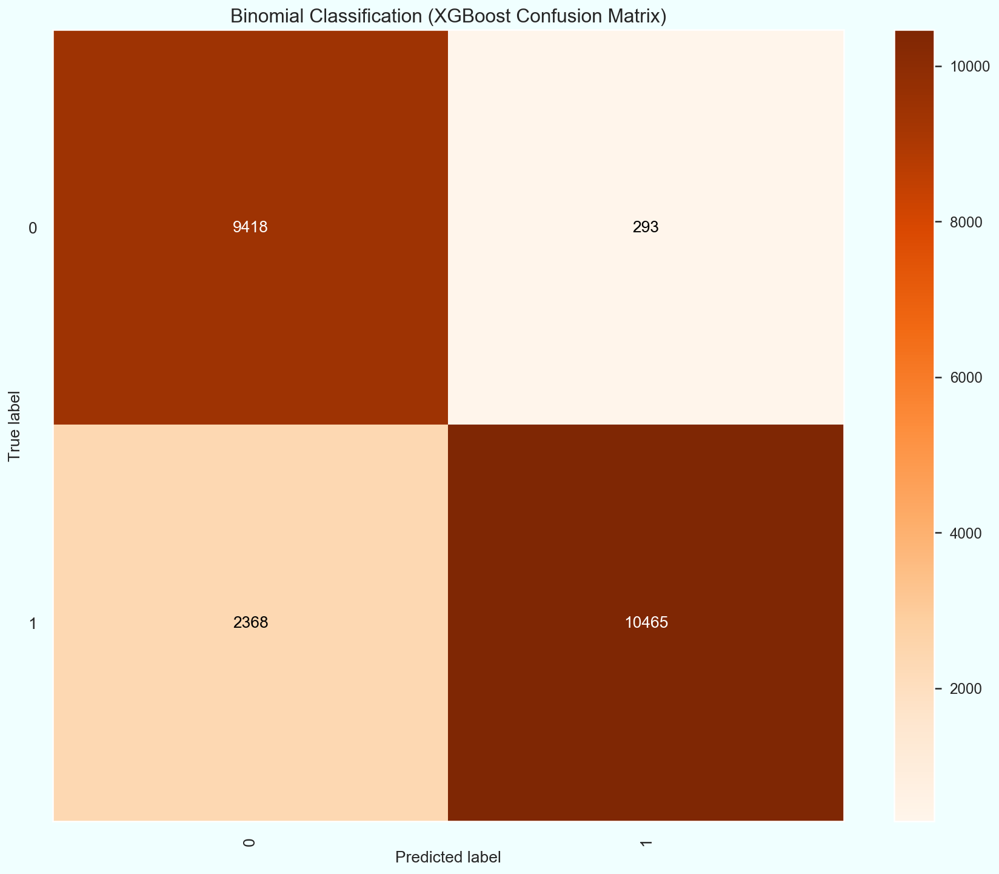

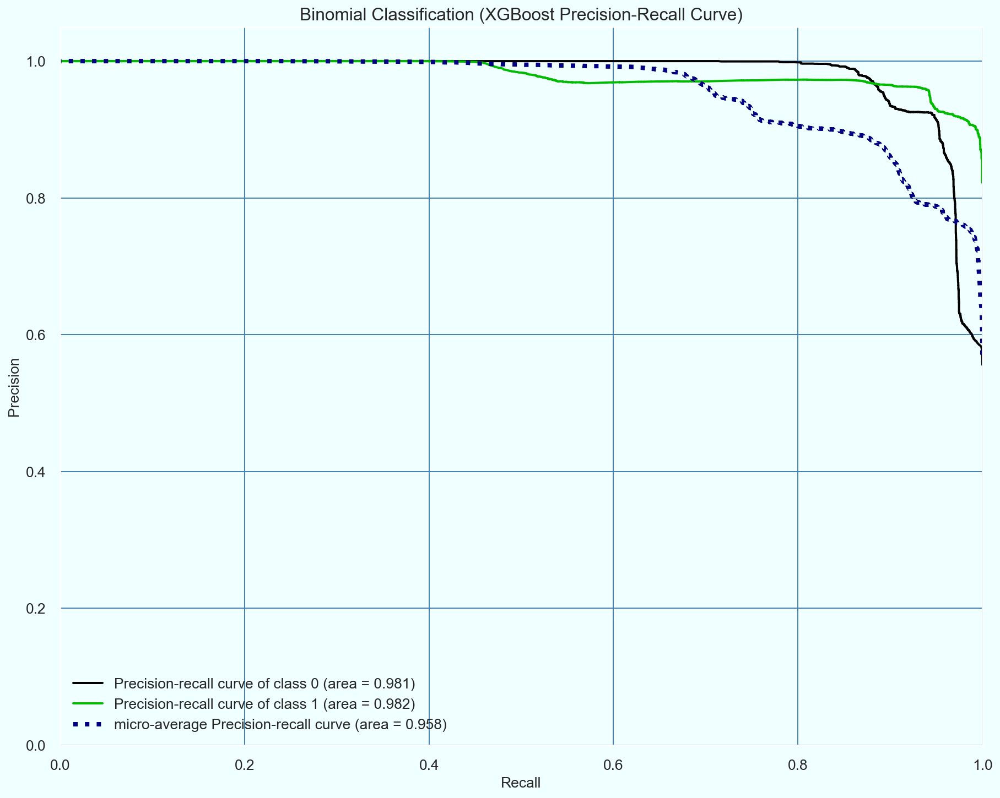

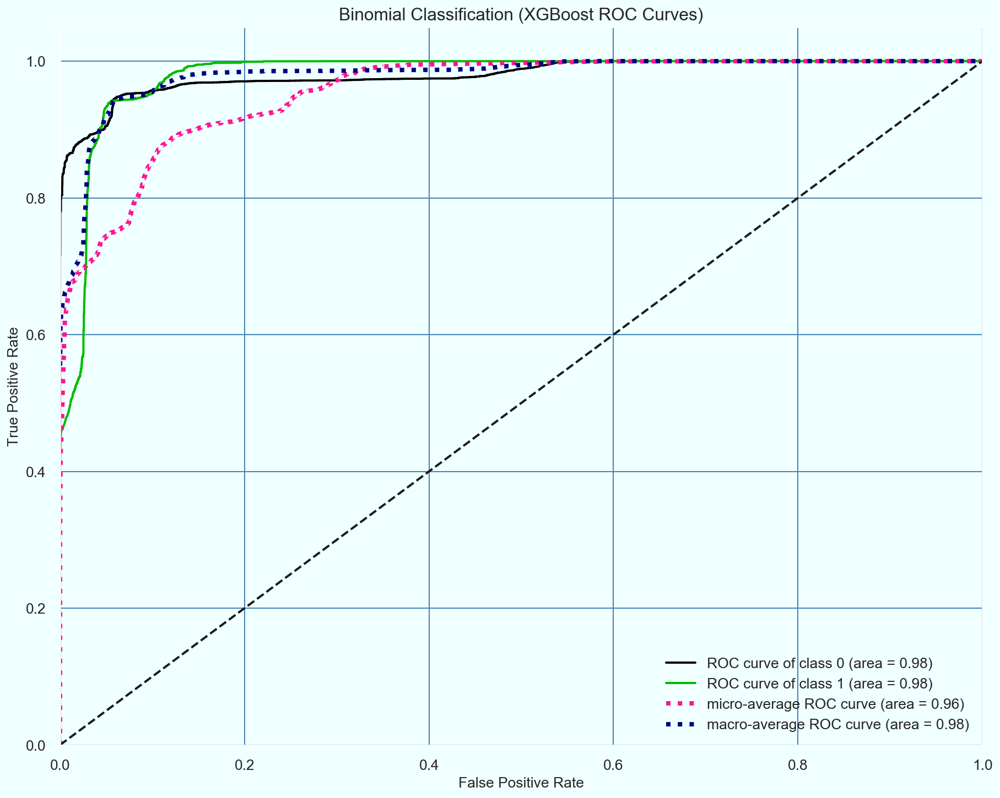

In [116]:
# Predicting the Test set results
y_pred = xgb_twoclass_model.predict(X_test)
y_pred_proba = xgb_twoclass_model.predict_proba(X_test)

ac = accuracy_score(y_test, y_pred)
print('The accuracy score of the XGBoost (Two Class) model is: {}%'.format(ac * 100))
print('\n')

cr = classification_report(y_test, y_pred)
print(cr)
print('\n')

skplt.metrics.plot_confusion_matrix(y_test, y_pred, title='Binomial Classification (XGBoost Confusion Matrix)',
                                    x_tick_rotation=90, 
                                    cmap='Oranges',
                                   );
print('\n')

skplt.metrics.plot_precision_recall(y_test, y_pred_proba,
                                    title='Binomial Classification (XGBoost Precision-Recall Curve)',
                                   );
print('\n')

skplt.metrics.plot_roc(y_test, y_pred_proba,
                       title='Binomial Classification (XGBoost ROC Curves)',
                      );

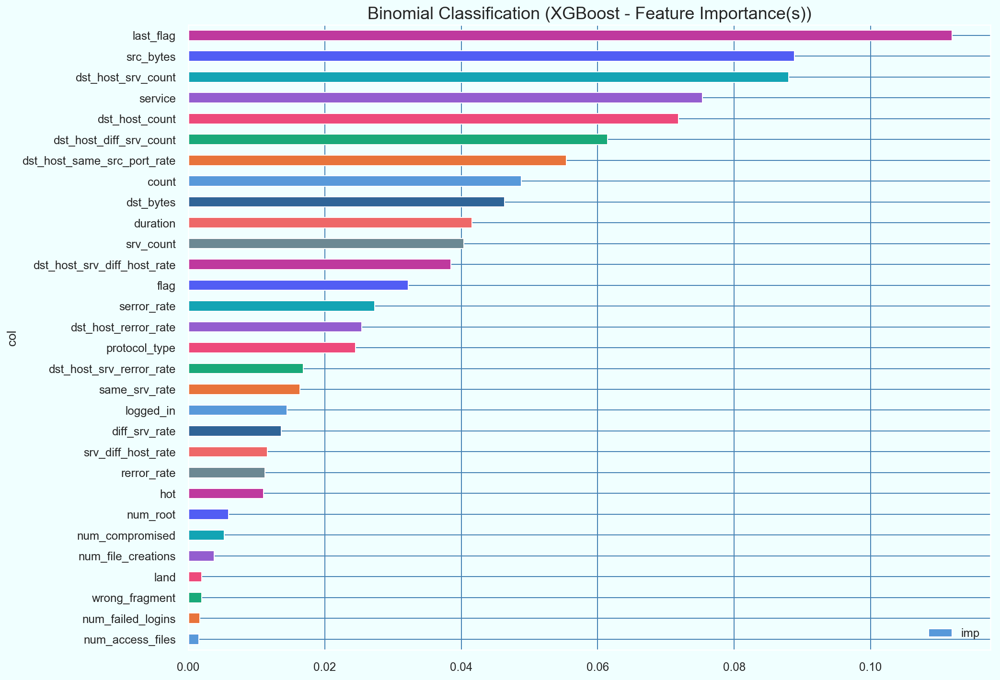

In [117]:
feature_importance = pd.DataFrame({'imp': xgb_twoclass_model.feature_importances_, 'col': X_train.columns})
feature_importance = feature_importance.sort_values(['imp', 'col'], ascending=[True, False]).iloc[-30:]
feature_importance.plot(kind='barh', x='col', y='imp', color=belize_light_flavor);
plt.title('Binomial Classification (XGBoost - Feature Importance(s))', fontsize=18)
plt.show()

### **Binomial Classification:** Using XGBoost with Semi-Supervised Classifier

#### Perform Classification

In [118]:
features = X_train.columns
target = 'attack_type_twoclass_num'
num_folds = 11

xgb_pseudolabeler_twoclass_model = PseudoLabeler(
    xgb_twoclass_model,
    X_test,
    features,
    target,
    sample_rate = 0.3
)

xgb_pseudolabeler_twoclass_model.fit(X_train, y_train)
#y_pred = xgb_pseudolabeler_twoclass_model.predict(X_test)
scores = cross_val_score(xgb_pseudolabeler_twoclass_model, X_train, y_train, cv=num_folds, scoring='roc_auc', n_jobs=1)
scores

[23:49:50] Tree method is selected to be 'approx'
[23:50:04] Tree method is selected to be 'approx'
[23:50:21] Tree method is selected to be 'approx'
[23:50:34] Tree method is selected to be 'approx'
[23:50:48] Tree method is selected to be 'approx'
[23:51:01] Tree method is selected to be 'approx'
[23:51:16] Tree method is selected to be 'approx'
[23:51:28] Tree method is selected to be 'approx'
[23:51:44] Tree method is selected to be 'approx'
[23:51:56] Tree method is selected to be 'approx'
[23:52:11] Tree method is selected to be 'approx'
[23:52:24] Tree method is selected to be 'approx'
[23:52:38] Tree method is selected to be 'approx'
[23:52:51] Tree method is selected to be 'approx'
[23:53:06] Tree method is selected to be 'approx'
[23:53:18] Tree method is selected to be 'approx'
[23:53:34] Tree method is selected to be 'approx'
[23:53:48] Tree method is selected to be 'approx'
[23:54:03] Tree method is selected to be 'approx'
[23:54:16] Tree method is selected to be 'approx'


array([0.99999988, 0.9999856 , 0.99999911, 0.99999721, 0.99999905,
       0.99999255, 0.99999752, 0.99999948, 0.99999975, 0.99999933,
       0.99999936])

In [119]:
xgb_pseudolabeler_twoclass_model

PseudoLabeler(features=Index(['duration', 'protocol_type', 'service', 'flag', 'src_bytes',
       'dst_bytes', 'land', 'wrong_fragment', 'urgent', 'hot',
       'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell',
       'su_attempted', 'num_root', 'num_file_creations', 'num_shells',
       'num_acc...ate',
       'dst_host_rerror_rate', 'dst_host_srv_rerror_rate', 'last_flag'],
      dtype='object'),
       model=XGBClassifier(base_score=0.5, booster='gbtree',
       colsample_bylevel=0.7742671231359579,
       colsample_bytree=0.641156321702667, device='cpu', eval_metric='auc',
       gamma=0.027455058133773455, learning_rate=0.13207337025323213,
       max_delta_step=19, max_depth=13, min_child_weigh...ght=257.4257611046447, seed=42, silent=1,
       subsample=0.1883595592814563, tree_method='approx'),
       sample_rate=0.3, seed=42, target='attack_type_twoclass_num',
       unlabled_data=       duration  protocol_type  service  flag  src_bytes  dst_bytes  land  \
0  

The accuracy score of the XGBoost (Semi-Supervised Model) (Two Class) model is: 87.50443577004968%


              precision    recall  f1-score   support

           0       0.79      0.97      0.87      9711
           1       0.97      0.80      0.88     12833

   micro avg       0.88      0.88      0.88     22544
   macro avg       0.88      0.89      0.87     22544
weighted avg       0.89      0.88      0.88     22544









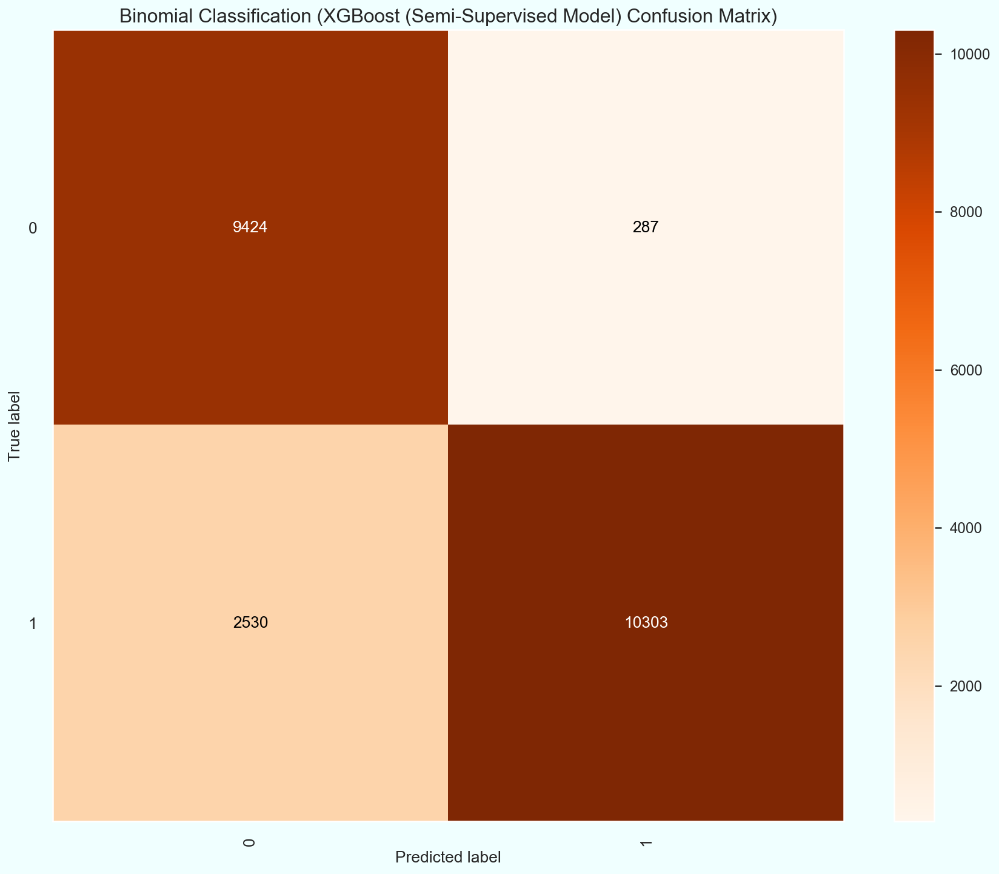

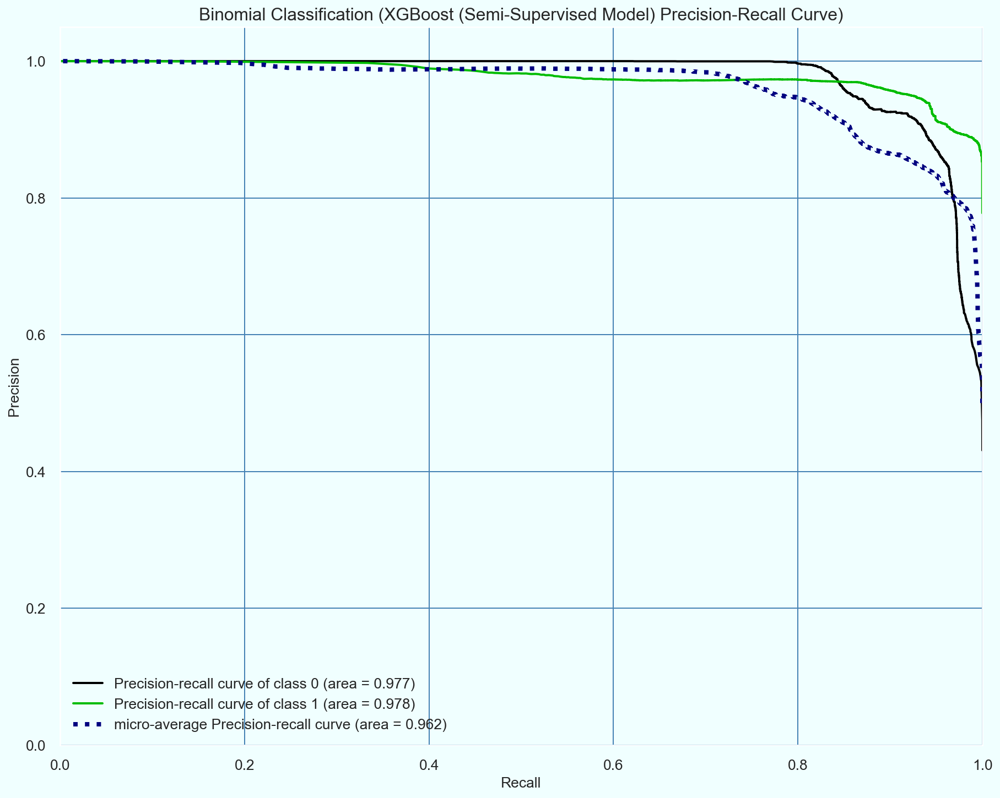

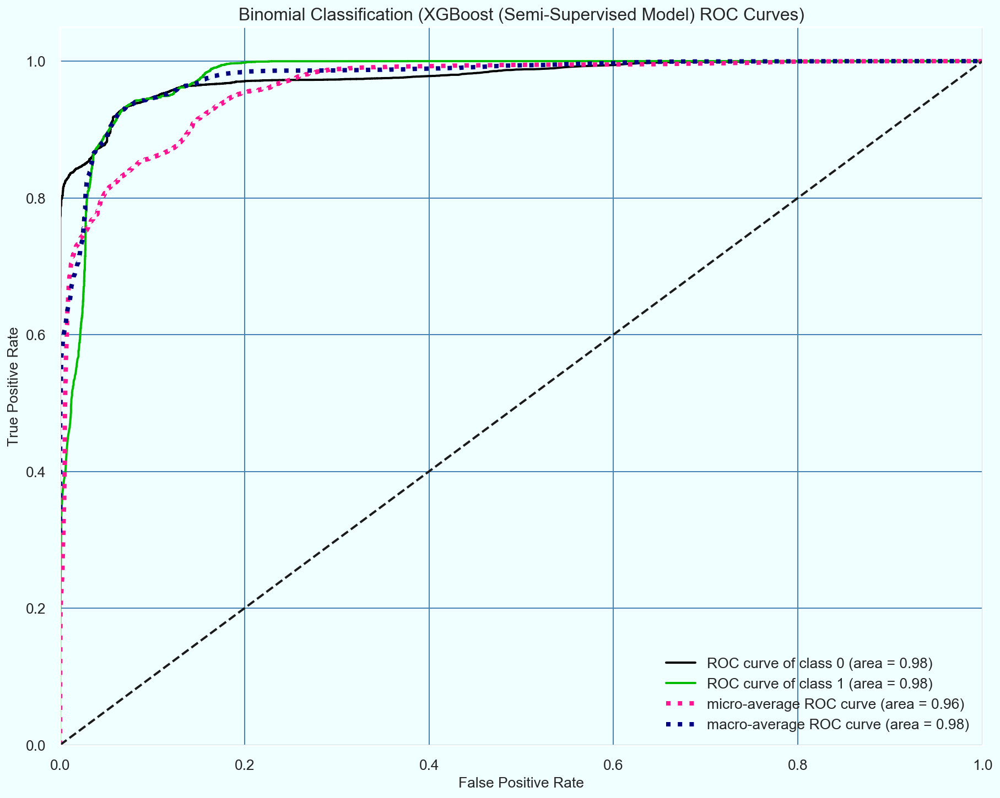

In [120]:
y_pred = xgb_pseudolabeler_twoclass_model.predict(X_test)
y_pred_proba = xgb_pseudolabeler_twoclass_model.predict_proba(X_test)

ac = accuracy_score(y_test, y_pred)
print('The accuracy score of the XGBoost (Semi-Supervised Model) (Two Class) model is: {}%'.format(ac * 100))
print('\n')

cr = classification_report(y_test, y_pred)
print(cr)
print('\n')

skplt.metrics.plot_confusion_matrix(y_test, y_pred, title='Binomial Classification (XGBoost (Semi-Supervised Model) Confusion Matrix)',
                                    x_tick_rotation=90, 
                                    cmap='Oranges',
                                   );
print('\n')

skplt.metrics.plot_precision_recall(y_test, y_pred_proba,
                                    title='Binomial Classification (XGBoost (Semi-Supervised Model) Precision-Recall Curve)',
                                   );
print('\n')

skplt.metrics.plot_roc(y_test, y_pred_proba,
                       title='Binomial Classification (XGBoost (Semi-Supervised Model) ROC Curves)',
                      );

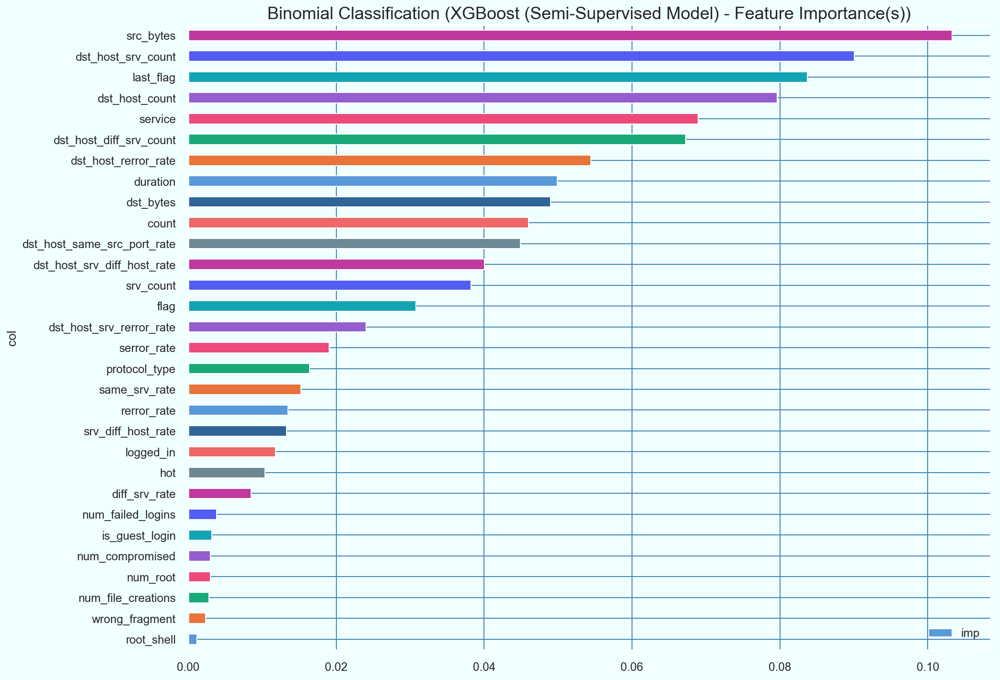

In [121]:
feature_importance = pd.DataFrame({'imp': xgb_pseudolabeler_twoclass_model.model.feature_importances_, 'col': X_train.columns})
feature_importance = feature_importance.sort_values(['imp', 'col'], ascending=[True, False]).iloc[-30:]
feature_importance.plot(kind='barh', x='col', y='imp', color=belize_light_flavor);
plt.title('Binomial Classification (XGBoost (Semi-Supervised Model) - Feature Importance(s))', fontsize=18)
plt.show()

## **Multinomial Classification:** Activity is normal or DOS or PROBE or R2L or U2R

### **Multinomial Classification:** Using NN Keras Classifier

#### Perform Classification

In [122]:
num_classes=5

kerasnn_fiveclass_model = Sequential()
kerasnn_fiveclass_model.add(Dense(32, input_shape=(X_train.shape[1], ), activation='relu',
          kernel_regularizer=regularizers.l2(0.01),
          ))
kerasnn_fiveclass_model.add(Dropout(0.2))
kerasnn_fiveclass_model.add(BatchNormalization())
kerasnn_fiveclass_model.add(Dense(64, activation='relu',
          kernel_regularizer=regularizers.l2(0.01),
          ))
kerasnn_fiveclass_model.add(GaussianNoise(0.1))
kerasnn_fiveclass_model.add(Dense(128, activation='relu',
          kernel_regularizer=regularizers.l2(0.01),
          ))
kerasnn_fiveclass_model.add(Dropout(0.2))
kerasnn_fiveclass_model.add(BatchNormalization())
kerasnn_fiveclass_model.add(Dense(128, activation='relu',
          kernel_regularizer=regularizers.l2(0.01),
          ))
kerasnn_fiveclass_model.add(GaussianNoise(0.1))
kerasnn_fiveclass_model.add(Dense(64, activation='relu',
          kernel_regularizer=regularizers.l2(0.01),
          ))
kerasnn_fiveclass_model.add(Dropout(0.2))
kerasnn_fiveclass_model.add(BatchNormalization())
kerasnn_fiveclass_model.add(Dense(32, activation='relu',
          kernel_regularizer=regularizers.l2(0.01),
          ))
kerasnn_fiveclass_model.add(Dense(num_classes, activation='softmax'))
kerasnn_fiveclass_model.summary()

# kerasnn_fiveclass_model.compile(loss="sparse_categorical_crossentropy", optimizer="adam", metrics=['binary_accuracy'])
# OR
z_train_cat = np_utils.to_categorical(z_train)
z_test_cat = np_utils.to_categorical(z_test)
kerasnn_fiveclass_model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=['binary_accuracy'])

kerasnn_fiveclass_model.fit(X_train, z_train_cat, validation_data=(X_test, z_test_cat), epochs=5, shuffle=True, verbose=0)
kerasnn_fiveclass_model.evaluate(X_test, z_test_cat)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_8 (Dense)              (None, 32)                1184      
_________________________________________________________________
dropout_4 (Dropout)          (None, 32)                0         
_________________________________________________________________
batch_normalization_4 (Batch (None, 32)                128       
_________________________________________________________________
dense_9 (Dense)              (None, 64)                2112      
_________________________________________________________________
gaussian_noise_3 (GaussianNo (None, 64)                0         
_________________________________________________________________
dense_10 (Dense)             (None, 128)               8320      
_________________________________________________________________
dropout_5 (Dropout)          (None, 128)               0         
__________

[1.20280273084187, 0.8207416590263523]

The accuracy score of the Keras NN (Five Class) model is: 50.638750887154%




C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.



              precision    recall  f1-score   support

           0       0.83      0.32      0.46     11235
           1       0.41      0.98      0.58      7167
           2       0.68      0.33      0.45      2421
           3       0.00      0.00      0.00      1654
           4       0.00      0.00      0.00        67

   micro avg       0.51      0.51      0.51     22544
   macro avg       0.39      0.33      0.30     22544
weighted avg       0.62      0.51      0.46     22544





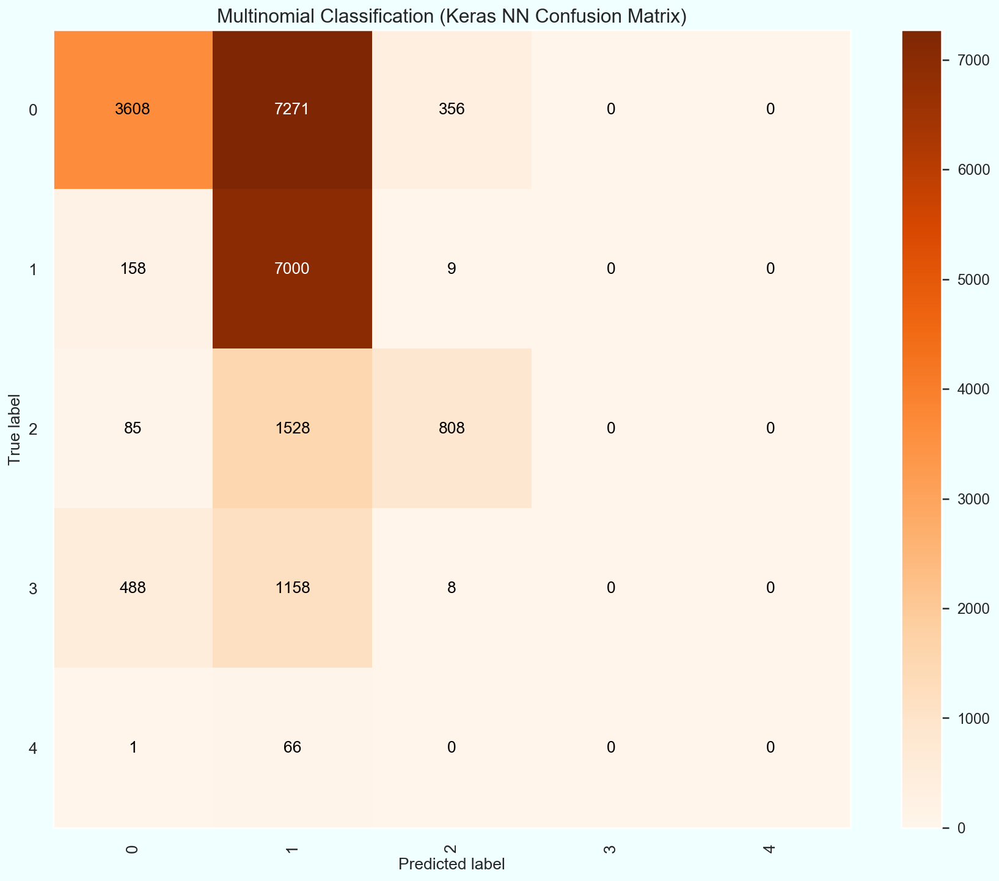

In [123]:
# Predicting the Test set results
z_pred = kerasnn_fiveclass_model.predict_classes(X_test)
z_pred_proba = kerasnn_fiveclass_model.predict_proba(X_test)

ac = accuracy_score(z_test, z_pred)
print('The accuracy score of the Keras NN (Five Class) model is: {}%'.format(ac * 100))
print('\n')

cr = classification_report(z_test, z_pred)
print(cr)
print('\n')

skplt.metrics.plot_confusion_matrix(z_test, z_pred, title='Multinomial Classification (Keras NN Confusion Matrix)',
                                    x_tick_rotation=90, 
                                    cmap='Oranges',
                                   );

### **Multinomial Classification:** Using LightGBM Classifier

#### Perform Classification

In [124]:
def lgbm_status_print_fiveclass(optimal_result):
    all_models = pd.DataFrame(lgbm_bayes_cv_tuner_fiveclass.cv_results_)
    best_params = pd.Series(lgbm_bayes_cv_tuner_fiveclass.best_params_)
    print('Model #{}\nBest ROC-AUC: {}\nBest params: {}\n'.format(len(all_models),
            np.round(lgbm_bayes_cv_tuner_fiveclass.best_score_, 4),
            lgbm_bayes_cv_tuner_fiveclass.best_params_)
         )


lgbm_bayes_cv_tuner_fiveclass = BayesSearchCV(
    estimator=lgbm.LGBMClassifier(
        n_jobs=n_cpus_avaliable,
        objective='multiclass',
        metric='multi_logloss',
        num_class=5,
        class_weight='balanced',
        silent=True,
        ),
    search_spaces={
        'boosting_type': ['gbdt', 'dart', 'rf'],
        'num_leaves': (2, 50),
        'max_depth': (2, 25),
        'learning_rate': (0.01, 1.0, 'log-uniform'),
        'n_estimators': (100, 300),
        'min_split_gain': (0.01, 1.0, 'uniform'),
        'min_child_weight': (0.01, 1.0, 'uniform'),
        'min_child_samples': (2, 50),
        'subsample': (0.01, 1.0, 'uniform'),
        'subsample_freq': (2, 50),
        'colsample_bytree': (0.01, 1.0, 'uniform'),
        'reg_lambda': (1e-4, 1000, 'log-uniform'),
        #'bagging_fraction': (0.01, 1.0, 'uniform'),    # OR subsample
        #'feature_fraction': (0.01, 1.0, 'uniform'),    # OR colsample_bytree
        },
    cv=StratifiedKFold(n_splits=9, shuffle=True),
    n_jobs=n_cpus_avaliable,
    n_iter=5,
    refit=True,
    verbose=0,
    )

lgbm_result_fiveclass = lgbm_bayes_cv_tuner_fiveclass.fit(X_train, z_train,
        callback=lgbm_status_print_fiveclass)

lgbm_fiveclass_model = lgbm_result_fiveclass.best_estimator_

print(lgbm_fiveclass_model)

Model #1
Best ROC-AUC: 0.9992
Best params: {'boosting_type': 'gbdt', 'colsample_bytree': 0.5143328707498763, 'learning_rate': 0.22081140844436528, 'max_depth': 9, 'min_child_samples': 17, 'min_child_weight': 0.5402402860195835, 'min_split_gain': 0.5269373527638566, 'n_estimators': 253, 'num_leaves': 27, 'reg_lambda': 0.14098231474514877, 'subsample': 0.8991932687960583, 'subsample_freq': 17}

Model #2
Best ROC-AUC: 0.9992
Best params: {'boosting_type': 'gbdt', 'colsample_bytree': 0.5143328707498763, 'learning_rate': 0.22081140844436528, 'max_depth': 9, 'min_child_samples': 17, 'min_child_weight': 0.5402402860195835, 'min_split_gain': 0.5269373527638566, 'n_estimators': 253, 'num_leaves': 27, 'reg_lambda': 0.14098231474514877, 'subsample': 0.8991932687960583, 'subsample_freq': 17}

Model #3
Best ROC-AUC: 0.9992
Best params: {'boosting_type': 'gbdt', 'colsample_bytree': 0.5143328707498763, 'learning_rate': 0.22081140844436528, 'max_depth': 9, 'min_child_samples': 17, 'min_child_weight': 

The accuracy score of the LightGBM (Five Class) model is: 87.19836763662173%


              precision    recall  f1-score   support

           0       0.83      0.97      0.90     11235
           1       0.96      0.85      0.90      7167
           2       0.82      0.76      0.79      2421
           3       0.96      0.48      0.64      1654
           4       0.43      0.49      0.46        67

   micro avg       0.87      0.87      0.87     22544
   macro avg       0.80      0.71      0.74     22544
weighted avg       0.88      0.87      0.87     22544









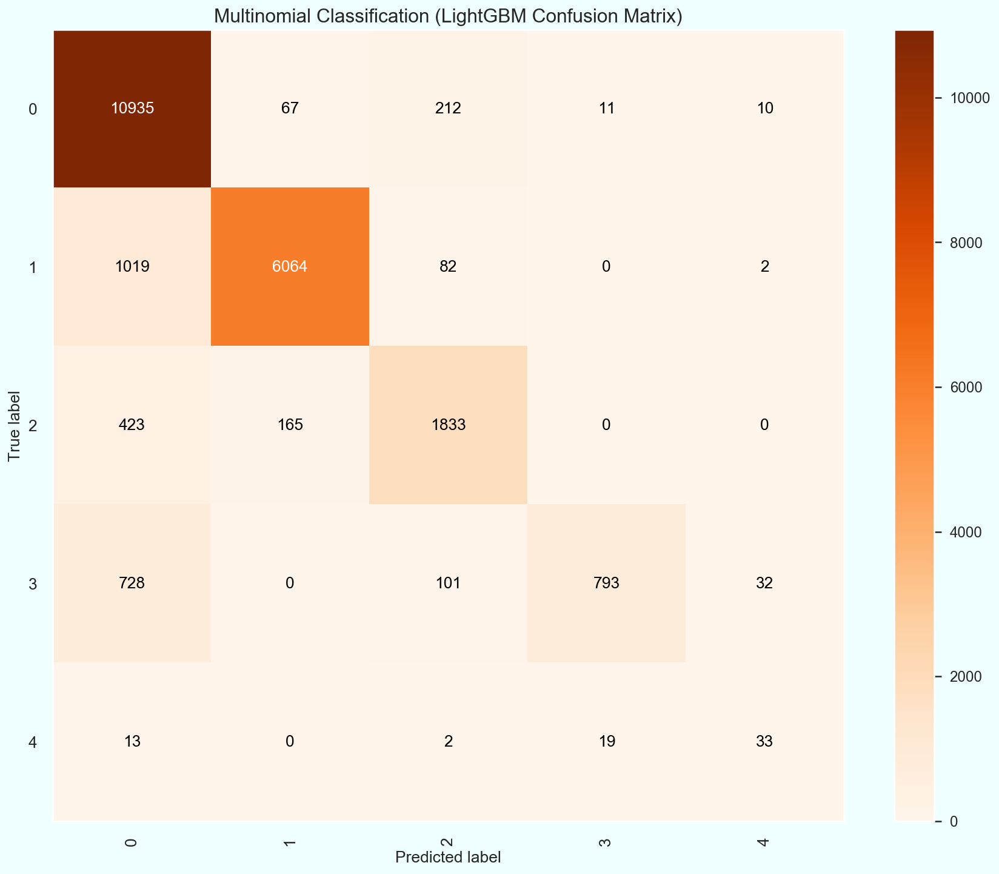

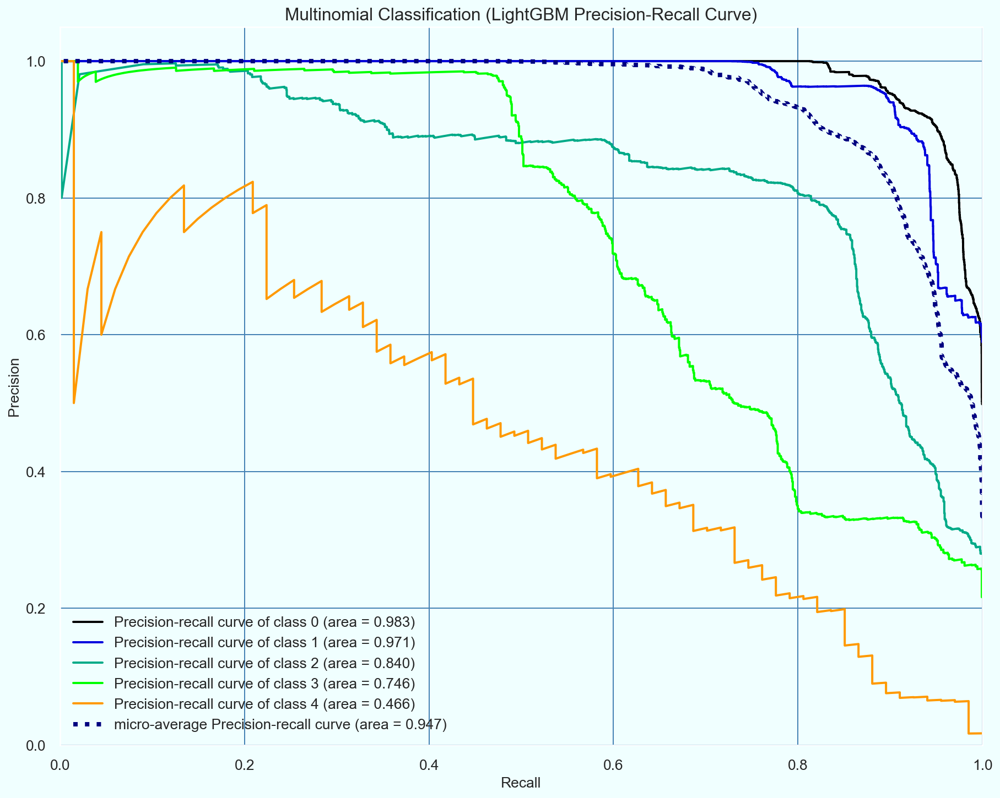

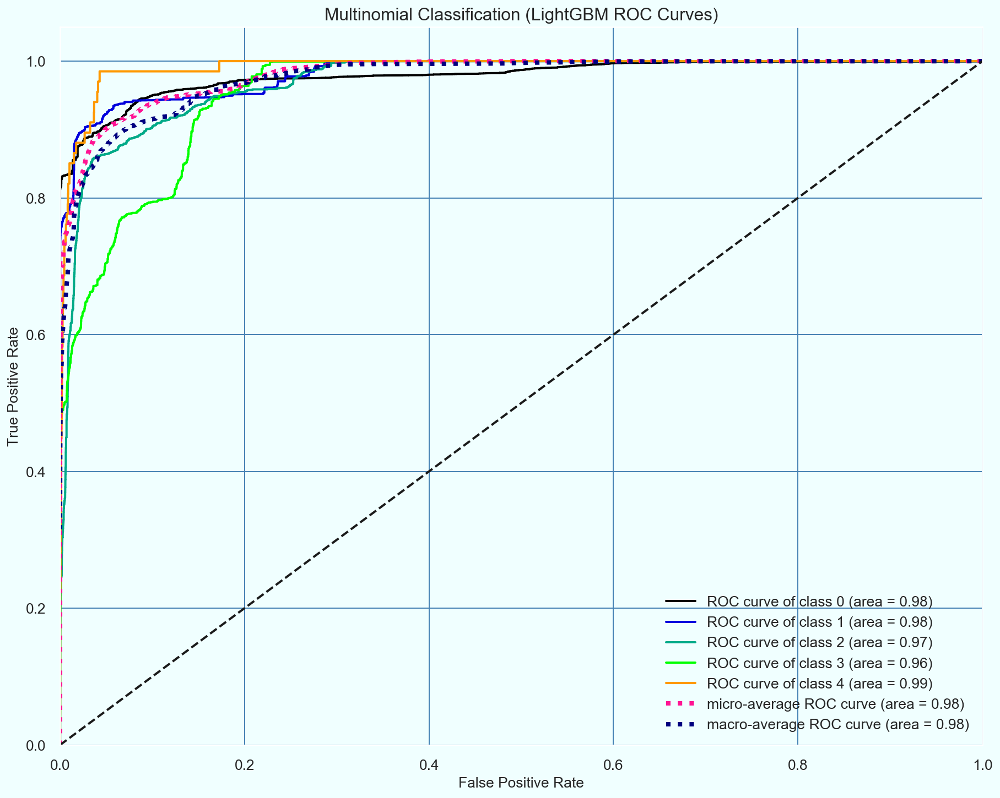

In [125]:
# Predicting the Test set results

z_pred = lgbm_fiveclass_model.predict(X_test)
z_pred_proba = lgbm_fiveclass_model.predict_proba(X_test)

ac = accuracy_score(z_test, z_pred)
print('The accuracy score of the LightGBM (Five Class) model is: {}%'.format(ac
        * 100))
print('\n')

cr = classification_report(z_test, z_pred)
print(cr)
print('\n')

skplt.metrics.plot_confusion_matrix(z_test, z_pred,
                                    title='Multinomial Classification (LightGBM Confusion Matrix)'
                                    , x_tick_rotation=90, cmap='Oranges'
                                    )
print('\n')

skplt.metrics.plot_precision_recall(z_test, z_pred_proba,
                                    title='Multinomial Classification (LightGBM Precision-Recall Curve)'
                                    )
print('\n')

skplt.metrics.plot_roc(z_test, z_pred_proba,
                       title='Multinomial Classification (LightGBM ROC Curves)'
                       )

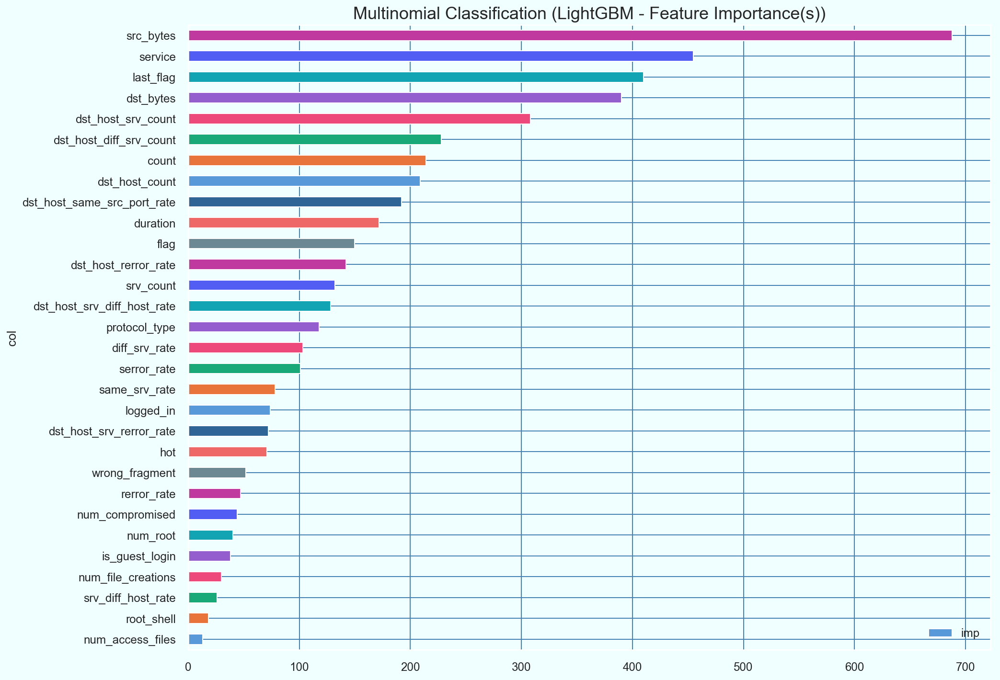

In [126]:
feature_importance = \
    pd.DataFrame({'imp': lgbm_fiveclass_model.feature_importances_,
                 'col': X_train.columns})
feature_importance = feature_importance.sort_values(['imp', 'col'],
        ascending=[True, False]).iloc[-30:]
feature_importance.plot(kind='barh', x='col', y='imp', color=belize_light_flavor)
plt.title('Multinomial Classification (LightGBM - Feature Importance(s))'
          , fontsize=18)
plt.show()

### **Multinomial Classification:** Using XGBoost Classifier

#### Perform Classification

In [127]:
def status_print(optimal_result):
    all_models = pd.DataFrame(bayes_cv_tuner.cv_results_)
    best_params = pd.Series(bayes_cv_tuner.best_params_)
    print('Model #{}\nBest ROC-AUC: {}\nBest params: {}\n'.format(len(all_models),
            np.round(bayes_cv_tuner.best_score_, 4),
            bayes_cv_tuner.best_params_)
         )


bayes_cv_tuner = BayesSearchCV(
    estimator=xgb.XGBClassifier(
        n_jobs=n_cpus_avaliable,
        objective='binary:logistic',
        eval_metric='auc',
        silent=1,
        tree_method='approx',
        nthread=n_cpus_avaliable,
        ),
    search_spaces={
        # 'booster': ['gbtree', 'dart'],
        'learning_rate': (0.01, 1.0, 'log-uniform'),
        'min_child_weight': (0, 10),
        'max_depth': (0, 25),
        'max_delta_step': (0, 20),
        'subsample': (0.01, 1.0, 'uniform'),
        'colsample_bytree': (0.01, 1.0, 'uniform'),
        'colsample_bylevel': (0.01, 1.0, 'uniform'),
        'reg_lambda': (1e-9, 1000, 'log-uniform'),
        'gamma': (1e-9, 0.5, 'log-uniform'),
        'min_child_weight': (0, 10),
        'n_estimators': (100, 300),
        'scale_pos_weight': (1e-6, 500, 'log-uniform'),
        },
    cv=StratifiedKFold(n_splits=9, shuffle=True),
    n_jobs=n_cpus_avaliable,
    n_iter=9,
    refit=True,
    verbose=0,
    )

result = bayes_cv_tuner.fit(X_train, z_train, callback=status_print)

xgb_fiveclass_model = result.best_estimator_

print(xgb_fiveclass_model)

Model #1
Best ROC-AUC: 0.9996
Best params: {'colsample_bylevel': 0.8423339384485536, 'colsample_bytree': 0.48531154153085093, 'gamma': 7.331927192267838e-07, 'learning_rate': 0.18820996393663403, 'max_delta_step': 17, 'max_depth': 17, 'min_child_weight': 2, 'n_estimators': 182, 'reg_lambda': 0.0026661603348918394, 'scale_pos_weight': 0.00818199187085701, 'subsample': 0.8592312849828907}

Model #2
Best ROC-AUC: 0.9996
Best params: {'colsample_bylevel': 0.8423339384485536, 'colsample_bytree': 0.48531154153085093, 'gamma': 7.331927192267838e-07, 'learning_rate': 0.18820996393663403, 'max_delta_step': 17, 'max_depth': 17, 'min_child_weight': 2, 'n_estimators': 182, 'reg_lambda': 0.0026661603348918394, 'scale_pos_weight': 0.00818199187085701, 'subsample': 0.8592312849828907}

Model #3
Best ROC-AUC: 0.9996
Best params: {'colsample_bylevel': 0.8423339384485536, 'colsample_bytree': 0.48531154153085093, 'gamma': 7.331927192267838e-07, 'learning_rate': 0.18820996393663403, 'max_delta_step': 17, 

The accuracy score of the XGBoost (Five Class) model is: 84.85184528034067%


              precision    recall  f1-score   support

           0       0.80      0.97      0.88     11235
           1       0.96      0.86      0.91      7167
           2       0.80      0.66      0.72      2421
           3       0.93      0.26      0.40      1654
           4       0.67      0.49      0.57        67

   micro avg       0.85      0.85      0.85     22544
   macro avg       0.83      0.65      0.70     22544
weighted avg       0.86      0.85      0.83     22544









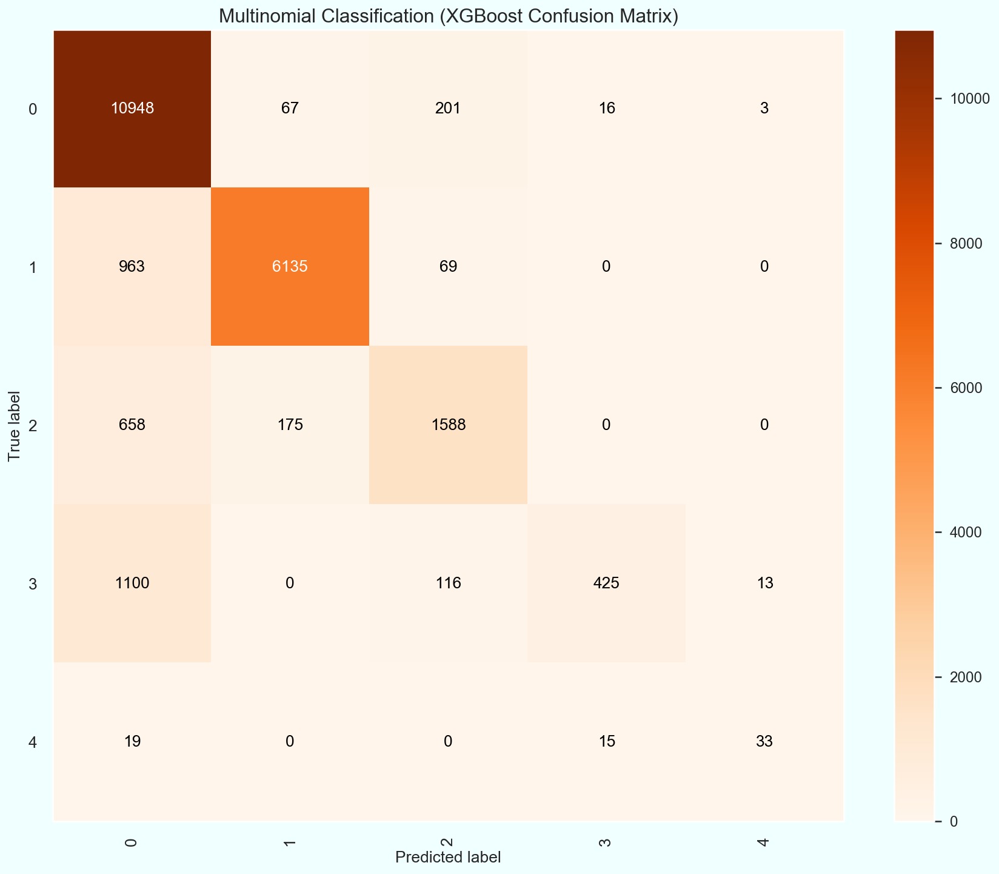

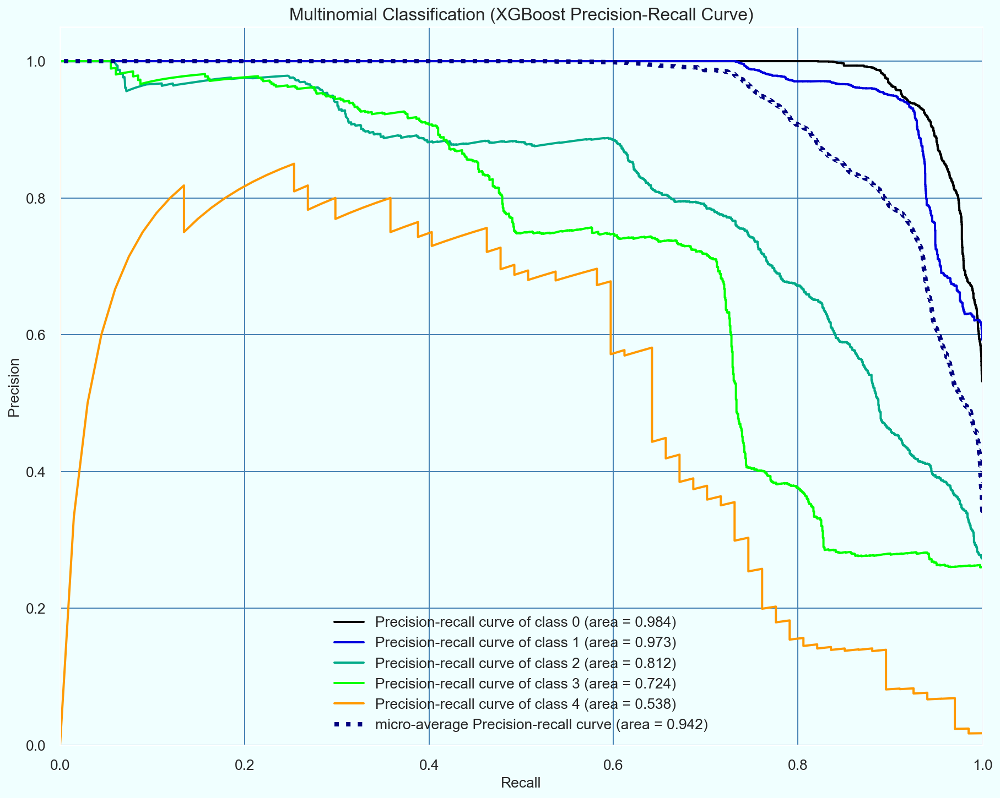

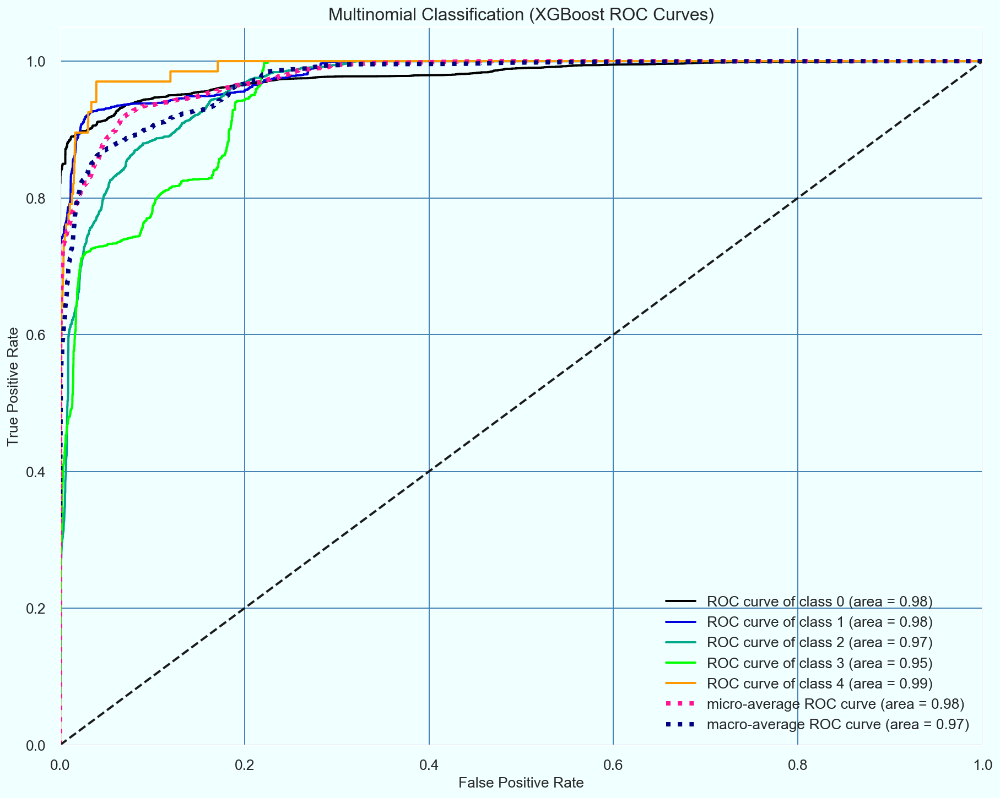

In [128]:
# Predicting the Test set results

z_pred = xgb_fiveclass_model.predict(X_test)
z_pred_proba = xgb_fiveclass_model.predict_proba(X_test)

ac = accuracy_score(z_test, z_pred)
print('The accuracy score of the XGBoost (Five Class) model is: {}%'.format(ac
        * 100))
print('\n')

cr = classification_report(z_test, z_pred)
print(cr)
print('\n')

skplt.metrics.plot_confusion_matrix(z_test, z_pred,
                                    title='Multinomial Classification (XGBoost Confusion Matrix)'
                                    , x_tick_rotation=90, cmap='Oranges'
                                    )
print('\n')

skplt.metrics.plot_precision_recall(z_test, z_pred_proba,
                                    title='Multinomial Classification (XGBoost Precision-Recall Curve)'
                                    )
print('\n')

skplt.metrics.plot_roc(z_test, z_pred_proba,
                       title='Multinomial Classification (XGBoost ROC Curves)'
                       )

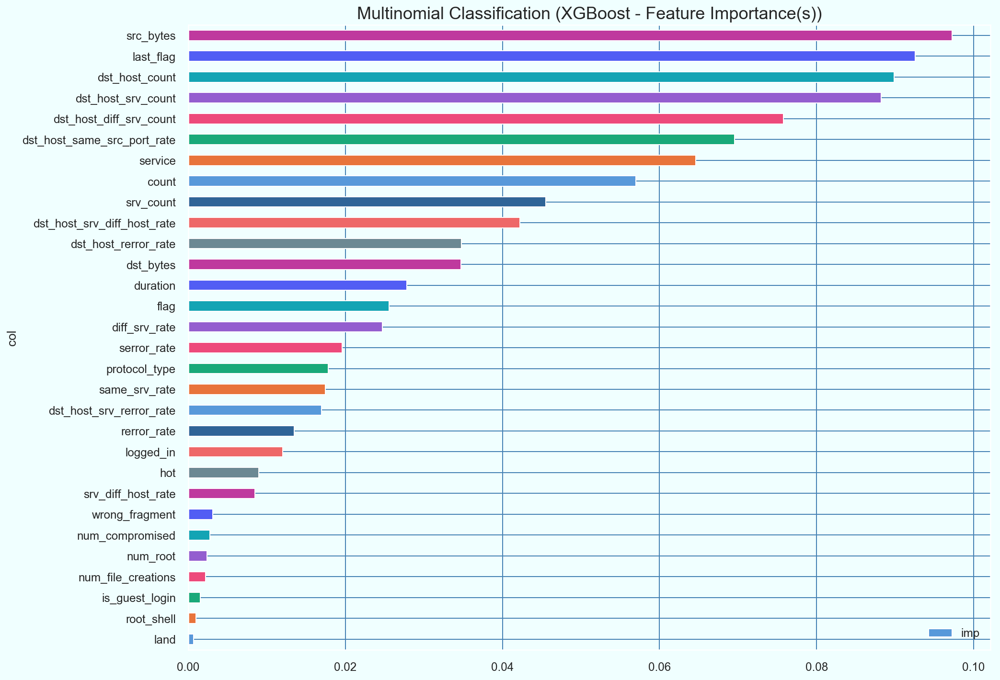

In [129]:
feature_importance = pd.DataFrame({'imp': xgb_fiveclass_model.feature_importances_, 'col': X_train.columns})
feature_importance = feature_importance.sort_values(['imp', 'col'], ascending=[True, False]).iloc[-30:]
feature_importance.plot(kind='barh', x='col', y='imp', color=belize_light_flavor);
plt.title('Multinomial Classification (XGBoost - Feature Importance(s))', fontsize=18)
plt.show()

### **Multinomial Classification:** Using XGBoost with Semi-Supervised Classifier

#### Perform Classification

In [130]:
features = X_train.columns
target = 'attack_type_fiveclass_num'
num_folds = 11

xgb_pseudolabeler_fiveclass_model = PseudoLabeler(
    xgb_fiveclass_model,
    X_test,
    features,
    target,
    sample_rate = 0.3
)

xgb_pseudolabeler_fiveclass_model.fit(X_train, z_train,)
#z_pred = xgb_pseudolabeler_fiveclass_model.predict(X_test)
scores = cross_val_score(xgb_pseudolabeler_fiveclass_model, X_train, z_train, cv=num_folds, n_jobs=1)
scores

[00:44:08] Tree method is selected to be 'approx'
[00:44:52] Tree method is selected to be 'approx'
[00:45:45] Tree method is selected to be 'approx'
[00:46:25] Tree method is selected to be 'approx'
[00:47:14] Tree method is selected to be 'approx'
[00:47:54] Tree method is selected to be 'approx'
[00:48:41] Tree method is selected to be 'approx'
[00:49:22] Tree method is selected to be 'approx'
[00:50:11] Tree method is selected to be 'approx'
[00:50:52] Tree method is selected to be 'approx'
[00:51:41] Tree method is selected to be 'approx'
[00:52:22] Tree method is selected to be 'approx'
[00:53:09] Tree method is selected to be 'approx'
[00:53:48] Tree method is selected to be 'approx'
[00:54:40] Tree method is selected to be 'approx'
[00:55:19] Tree method is selected to be 'approx'
[00:56:05] Tree method is selected to be 'approx'
[00:56:46] Tree method is selected to be 'approx'
[00:57:34] Tree method is selected to be 'approx'
[00:58:14] Tree method is selected to be 'approx'


array([0.99973808, 0.99921425, 0.99982537, 0.99956343, 0.99947612,
       0.99930149, 0.99930149, 0.99973801, 0.99973799, 0.99982533,
       0.99956328])

In [131]:
xgb_pseudolabeler_fiveclass_model

PseudoLabeler(features=Index(['duration', 'protocol_type', 'service', 'flag', 'src_bytes',
       'dst_bytes', 'land', 'wrong_fragment', 'urgent', 'hot',
       'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell',
       'su_attempted', 'num_root', 'num_file_creations', 'num_shells',
       'num_acc...ate',
       'dst_host_rerror_rate', 'dst_host_srv_rerror_rate', 'last_flag'],
      dtype='object'),
       model=XGBClassifier(base_score=0.5, booster='gbtree',
       colsample_bylevel=0.8423339384485536,
       colsample_bytree=0.48531154153085093, eval_metric='auc',
       gamma=7.331927192267838e-07, learning_rate=0.18820996393663403,
       max_delta_step=17, max_depth=17, min_child_weight=2, missin...t=0.00818199187085701, seed=42, silent=1,
       subsample=0.8592312849828907, tree_method='approx'),
       sample_rate=0.3, seed=42, target='attack_type_fiveclass_num',
       unlabled_data=       duration  protocol_type  service  flag  src_bytes  dst_bytes  land  \
0 

The accuracy score of the XGBoost (Semi-Supervised Model) (Five Class) model is: 83.39691270404542%


              precision    recall  f1-score   support

           0       0.77      0.98      0.86     11235
           1       0.97      0.84      0.90      7167
           2       0.84      0.66      0.74      2421
           3       0.94      0.11      0.20      1654
           4       0.65      0.36      0.46        67

   micro avg       0.83      0.83      0.83     22544
   macro avg       0.83      0.59      0.63     22544
weighted avg       0.85      0.83      0.81     22544









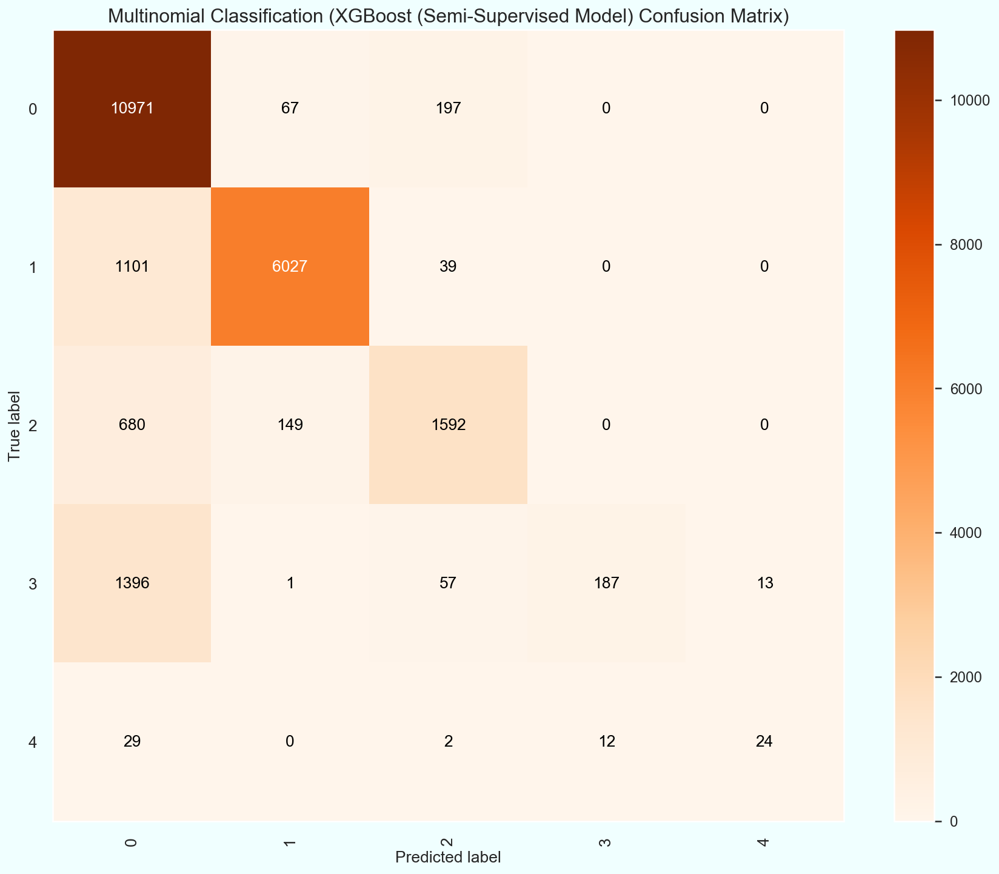

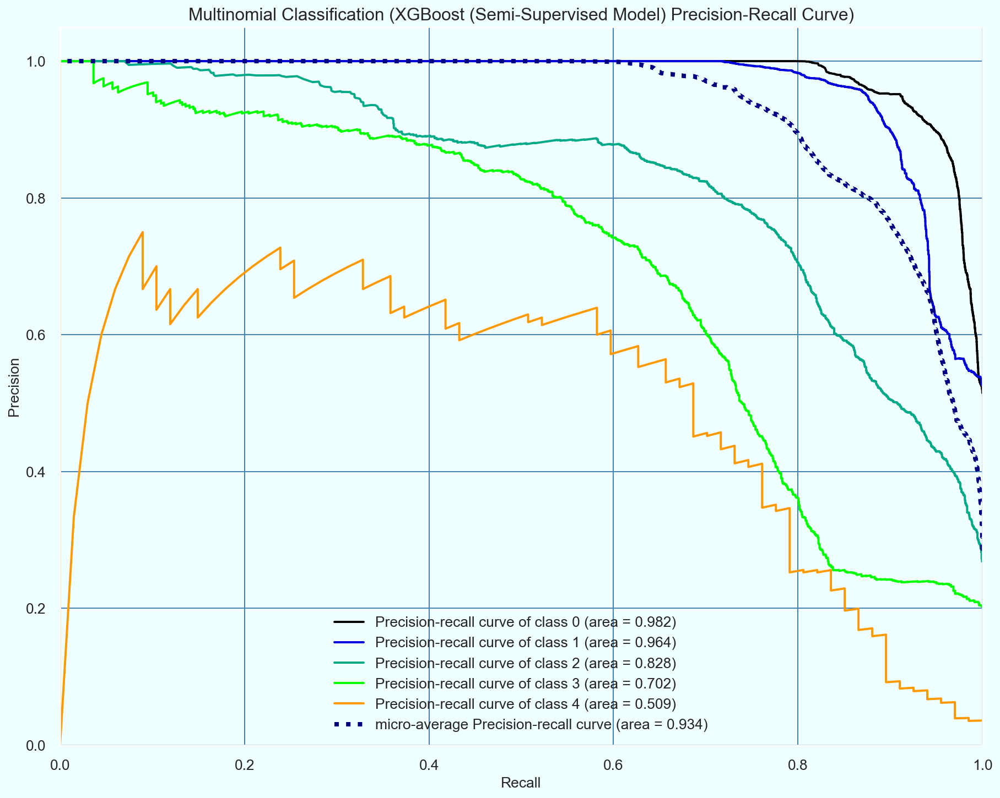

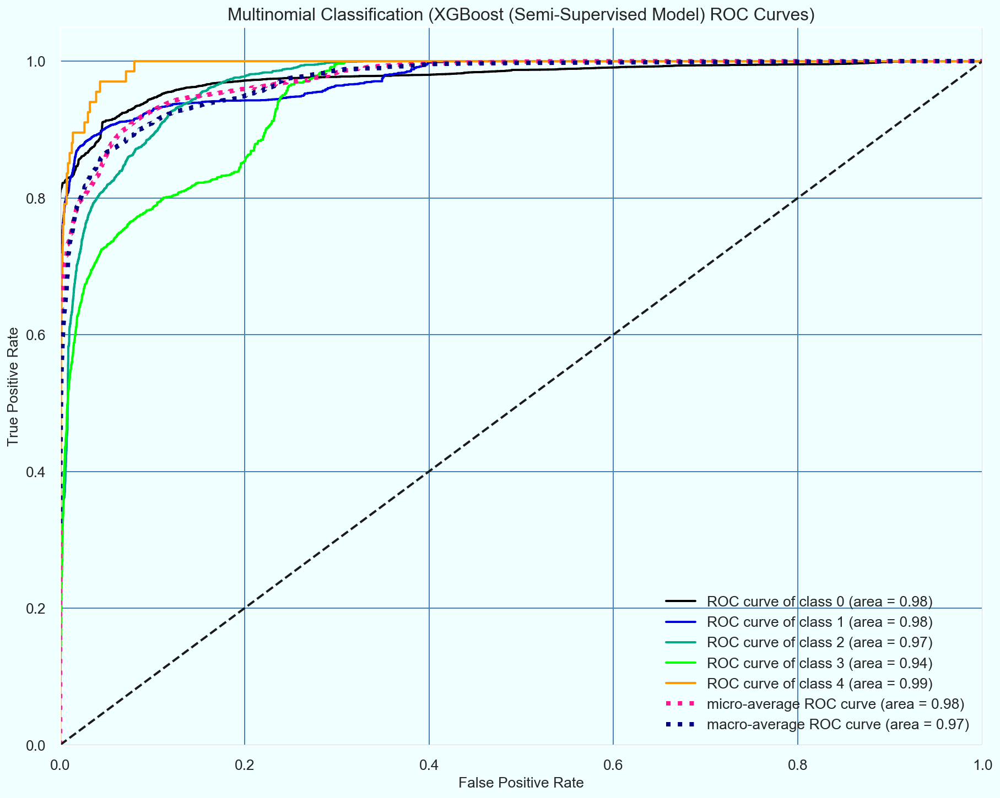

In [132]:
z_pred = xgb_pseudolabeler_fiveclass_model.predict(X_test)
z_pred_proba = xgb_pseudolabeler_fiveclass_model.predict_proba(X_test)

ac = accuracy_score(z_test, z_pred)
print('The accuracy score of the XGBoost (Semi-Supervised Model) (Five Class) model is: {}%'.format(ac * 100))
print('\n')

cr = classification_report(z_test, z_pred)
print(cr)
print('\n')

skplt.metrics.plot_confusion_matrix(z_test, z_pred, title='Multinomial Classification (XGBoost (Semi-Supervised Model) Confusion Matrix)',
                                    x_tick_rotation=90, 
                                    cmap='Oranges',
                                   );
print('\n')

skplt.metrics.plot_precision_recall(z_test, z_pred_proba,
                                    title='Multinomial Classification (XGBoost (Semi-Supervised Model) Precision-Recall Curve)',
                                   );
print('\n')

skplt.metrics.plot_roc(z_test, z_pred_proba,
                       title='Multinomial Classification (XGBoost (Semi-Supervised Model) ROC Curves)',
                      );

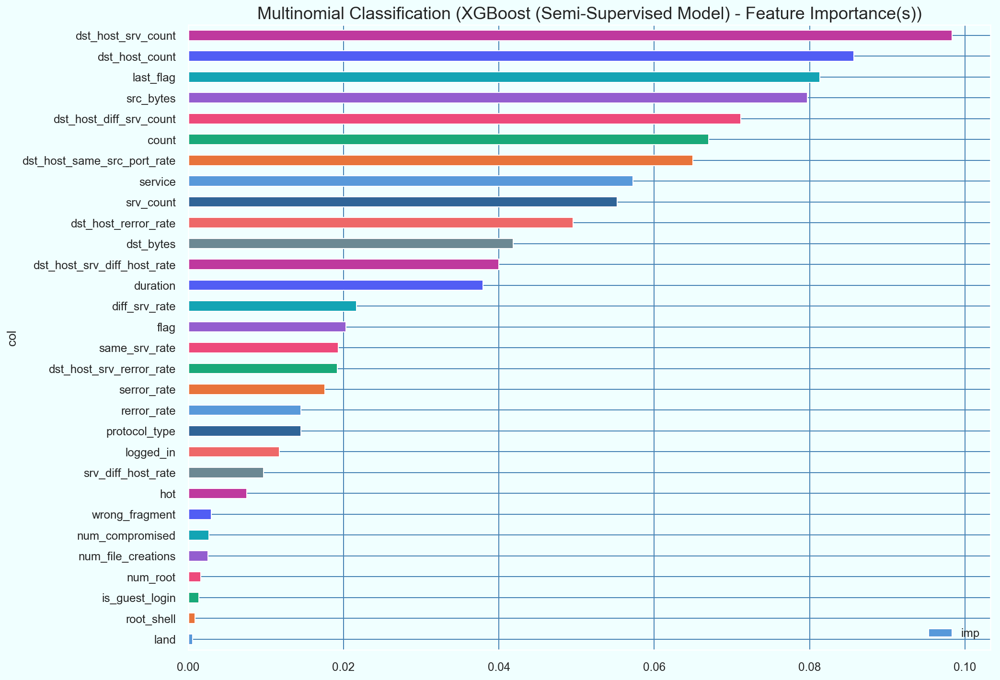

In [133]:
feature_importance = pd.DataFrame({'imp': xgb_pseudolabeler_fiveclass_model.model.feature_importances_, 'col': X_train.columns})
feature_importance = feature_importance.sort_values(['imp', 'col'], ascending=[True, False]).iloc[-30:]
feature_importance.plot(kind='barh', x='col', y='imp', color=belize_light_flavor);
plt.title('Multinomial Classification (XGBoost (Semi-Supervised Model) - Feature Importance(s))', fontsize=18)
plt.show()

In [134]:
print("Notebook Runtime: %0.2f Minutes"%((time.time() - notebookstart)/60))

Notebook Runtime: 110.90 Minutes
